In [1]:
# Import main libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import collections, re
import pickle
import time
from sklearn import cluster, metrics
from sklearn import manifold, decomposition
from sklearn.metrics import confusion_matrix
import logging

In [2]:
# Import description dataset
data = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv", sep = ',')

# First view of the description dataset

In [3]:
# Code to display all columns and all texts
def set_pandas_display_options() -> None:
    display = pd.options.display
    display.max_columns = 20
    display.max_rows = 100
    display.max_colwidth = 300
    display.width = None
set_pandas_display_options()

In [4]:
# First view of dataset
data.head(20)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multico..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft text...",No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"", ""value""=>""Cotton Terry""}, {""key""=>""Design"", ""value""=>""SHUVAM""}, {""key""=>""Brand"", ""value""=>""Eurospa""}, {""key""=>""GSM"", ""value""=>""360""}, {""key""=>""Type"", ""value""=>""Face Towel Set""}, {""key""=>""Model Name"", ""value""=>""SHUVAM20PCFTSETASSORTED""}, {""key""=>""Ide..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-cotton-printed-king-sized-double-bedsheet/p/itmejt9uaqahahuf?pid=BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ...""]",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf415

In [5]:
# Size of dataset
data.shape

(1050, 15)

In [6]:
# dtypes of features
data.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [7]:
# Percentage of missing values for each column
data.isna().mean()

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
retail_price               0.000952
discounted_price           0.000952
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
brand                      0.321905
product_specifications     0.000952
dtype: float64

In [8]:
# Number of missing values for each column
data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [9]:
# Duplicates ?
print("duplicates in data : ", data.duplicated().sum())
print("duplicates in data['uniq_id'] : ", data.duplicated('uniq_id').sum())
print("duplicates in data['product_url'] : ", data.duplicated('product_url').sum())
print("duplicates in data['product_name'] : ", data.duplicated('product_name').sum())
print("duplicates in data['image'] : ", data.duplicated('image').sum())
print("duplicates in data['pid'] : ", data.duplicated('pid').sum())
print("duplicates in data['description'] : ", data.duplicated('description').sum())

duplicates in data :  0
duplicates in data['uniq_id'] :  0
duplicates in data['product_url'] :  0
duplicates in data['product_name'] :  0
duplicates in data['image'] :  0
duplicates in data['pid'] :  0
duplicates in data['description'] :  0


In [10]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [11]:
# Analysis of different features

# Number of different product_category_tree
print('number of different product_category_tree =', 
      len(data['product_category_tree'].unique().tolist()))
print('-------------------------------------------')

# Number of different product_rating
print('number of different product_rating =', 
      len(data['product_rating'].unique().tolist()))
print('-------------------------------------------')
      
# Number of different overall_rating
print('number of different overall_rating =', 
      len(data['overall_rating'].unique().tolist()))
print('-------------------------------------------')

# Number of different brand
print('number of different brand =', 
      len(data['brand'].unique().tolist()))

number of different product_category_tree = 642
-------------------------------------------
number of different product_rating = 27
-------------------------------------------
number of different overall_rating = 27
-------------------------------------------
number of different brand = 491


In [12]:
# Filter convenient features
data = data[['uniq_id',
            'product_name',
            'product_category_tree',
            'image',
            'description']]

In [13]:
# Create new column 'product_name_description'
data['product_name_description'] = (data['product_name']
                                    + data['description'])

In [14]:
data.head()

,uniq_id,product_name,product_category_tree,image,description,product_name_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester ...","Elegance Polyester Multicolor Abstract Eyelet Door CurtainKey Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interi..."
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",7b72c92c2f6c40268628ec5f14c6d590.jpg,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Col...","Sathiyas Cotton Bath TowelSpecifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Gi..."
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",64d5d4a258243731dc7bbb1eef49ad74.jpg,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft text...","Eurospa Cotton Terry Face Towel SetKey Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quali..."
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ...""]",d4684dcdc759dd9cdf41504698d737d8.jpg,"Key Features of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet Royal Bedsheet Perfact for Wedding & Gifting,Specifications of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet (1 Bedsheet,2 Pillow Cover, Multicolor) General Brand SANTOSH ROYAL FASHION Machine Washa...","SANTOSH ROYAL FASHION Cotton Printed King sized Double BedsheetKey Features of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet Royal Bedsheet Perfact for Wedding & Gifting,Specifications of SANTOSH ROYAL FASHION Cotton Printed King sized Double Bedsheet (1 Bedsheet,2 Pillow Cover..."
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed...""]",6325b6870c54cd47be6ebfbffa620ec7.jpg,"Key Features of Jaipur Print Cotton Floral King sized Double Bedsheet 100% cotton,Jaipur Print Cotton Floral King sized Double Bedsheet (1 bed sheet 2 pillow cover, White) Price: Rs. 998 This nice bed sheet made up of 100% co

## Analysis of categories and creation of new categories

In [15]:
# Display all product_category_trees
list_cat_trees = data['product_category_tree'].unique().tolist()
list_cat_trees

['["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]',
 '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]',
 '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]',
 '["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]',
 '["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]',
 '["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]',
 '["Watches >> Wrist Watches >> Camerii Wrist Watches"]',
 '["Watches >> Wrist Watches >> T STAR Wrist Watches"]',
 '["Watches >> Wrist Watches >> Alfajr Wrist Watches"]',
 '["Watches >> Wrist Watches >> TAG Heuer Wrist Watches"]',
 '["Watches >> Wrist Watches >> C

In [16]:
# Display number of different product_category_trees
len(list_cat_trees)

642

In [17]:
# Create 'first_category', 'second_category' and 'third_category' features from 'product_category_tree'
import re

# Save column index of 'product_category_tree'
index_product_category_tree = data.columns.get_loc('product_category_tree')
# Create new columns
data['first_category'] = 0
data['second_category'] = 0
data['third_category'] = 0
# Save column indexes of 'first_category', 'second_category' and 'third_category'
index_first_category = data.columns.get_loc('first_category')
index_second_category = data.columns.get_loc('second_category')
index_third_category = data.columns.get_loc('third_category')

# Add the appropriate category for each dataset row
for index in data.index:
    # Save string for each index of column 'product_category_tree'
    cat_tree = data.iloc[index, index_product_category_tree]
    # Save indexes of each ">" for each dataset row in list 'indices'
    indices = [i.start() for i in re.finditer(">", cat_tree)]
    # column 'first_categoy' : Keep only first_category (string before the first '>')
    first_cat = cat_tree[2:indices[0] - 1]
    data.iloc[index, index_first_category] = first_cat
    # column 'second_category : Keep only second_category 
    # (string before the third '>' or complete string if len(indices) == 2)
    if len(indices) == 2:
        data.iloc[index, index_second_category] = cat_tree[2:-2]
    else:
        second_cat = cat_tree[2:indices[2] - 1]
        data.iloc[index, index_second_category] = second_cat
    # column 'third_category : Keep third_category or second_category if there is no third_category
    # (string before the fifth '>' or complete string if len(indices) == 4 or 2)
    if 2 <= len(indices) <= 4:
        data.iloc[index, index_third_category] = cat_tree[2:-2]
    else:
        third_cat = cat_tree[2:indices[4] - 1]
        data.iloc[index, index_third_category] = third_cat

In [18]:
# Display the list of first_category listed in alphabetical order
list_1st_cat = data['first_category'].unique().tolist()
list_1st_cat.sort()
print(list_1st_cat)
print('number of first categories =', len(list_1st_cat))

['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
number of first categories = 7


In [19]:
list_1st_cat

['Baby Care',
 'Beauty and Personal Care',
 'Computers',
 'Home Decor & Festive Needs',
 'Home Furnishing',
 'Kitchen & Dining',
 'Watches']

In [20]:
# Number of products by first_category
data.groupby('first_category')['first_category'].count()

first_category
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: first_category, dtype: int64

In [21]:
# Display the list of second_category listed in alphabetical order
list_2nd_cat = data['second_category'].unique().tolist()
list_2nd_cat.sort()
print(list_2nd_cat)
print('number of second categories =', len(list_2nd_cat))

['Baby Care >> Baby & Kids Gifts', 'Baby Care >> Baby Bath & Skin', 'Baby Care >> Baby Bedding', 'Baby Care >> Baby Grooming', 'Baby Care >> Diapering & Potty Training', 'Baby Care >> Feeding & Nursing', 'Baby Care >> Furniture & Furnishings', 'Baby Care >> Infant Wear', 'Baby Care >> Strollers & Activity Gear', 'Beauty and Personal Care >> Bath and Spa', 'Beauty and Personal Care >> Beauty Accessories', 'Beauty and Personal Care >> Body and Skin Care', 'Beauty and Personal Care >> Combos and Kits', 'Beauty and Personal Care >> Eye Care', 'Beauty and Personal Care >> Fragrances', 'Beauty and Personal Care >> Hair Care', 'Beauty and Personal Care >> Health Care', 'Beauty and Personal Care >> Makeup', "Beauty and Personal Care >> Men's Grooming", "Beauty and Personal Care >> Women's Hygiene", 'Computers >> Computer Components', 'Computers >> Computer Peripherals', 'Computers >> Laptop Accessories', 'Computers >> Laptops', 'Computers >> Network Components', 'Computers >> Software', 'Compu

In [22]:
list_2nd_cat

['Baby Care >> Baby & Kids Gifts',
 'Baby Care >> Baby Bath & Skin',
 'Baby Care >> Baby Bedding',
 'Baby Care >> Baby Grooming',
 'Baby Care >> Diapering & Potty Training',
 'Baby Care >> Feeding & Nursing',
 'Baby Care >> Furniture & Furnishings',
 'Baby Care >> Infant Wear',
 'Baby Care >> Strollers & Activity Gear',
 'Beauty and Personal Care >> Bath and Spa',
 'Beauty and Personal Care >> Beauty Accessories',
 'Beauty and Personal Care >> Body and Skin Care',
 'Beauty and Personal Care >> Combos and Kits',
 'Beauty and Personal Care >> Eye Care',
 'Beauty and Personal Care >> Fragrances',
 'Beauty and Personal Care >> Hair Care',
 'Beauty and Personal Care >> Health Care',
 'Beauty and Personal Care >> Makeup',
 "Beauty and Personal Care >> Men's Grooming",
 "Beauty and Personal Care >> Women's Hygiene",
 'Computers >> Computer Components',
 'Computers >> Computer Peripherals',
 'Computers >> Laptop Accessories',
 'Computers >> Laptops',
 'Computers >> Network Components',
 'Compu

In [23]:
# Number of products by second_category
data.groupby('second_category')['second_category'].count()

second_category
Baby Care >> Baby & Kids Gifts                                    15
Baby Care >> Baby Bath & Skin                                     14
Baby Care >> Baby Bedding                                         15
Baby Care >> Baby Grooming                                         4
Baby Care >> Diapering & Potty Training                            7
Baby Care >> Feeding & Nursing                                     8
Baby Care >> Furniture & Furnishings                               2
Baby Care >> Infant Wear                                          84
Baby Care >> Strollers & Activity Gear                             1
Beauty and Personal Care >> Bath and Spa                           7
Beauty and Personal Care >> Beauty Accessories                     1
Beauty and Personal Care >> Body and Skin Care                    15
Beauty and Personal Care >> Combos and Kits                       24
Beauty and Personal Care >> Eye Care                               2
Beauty and Persona

In [24]:
# Display the list of third_category listed in alphabetical order
list_3rd_cat = data['third_category'].unique().tolist()
list_3rd_cat.sort()
print(list_3rd_cat)
print('number of third categories =', len(list_3rd_cat))

['Baby Care >> Baby & Kids Gifts >> Decorations', 'Baby Care >> Baby & Kids Gifts >> Photo Frames', 'Baby Care >> Baby & Kids Gifts >> Stickers', 'Baby Care >> Baby Bath & Skin >> Baby Bath Towels', 'Baby Care >> Baby Bath & Skin >> Baby Body Wash', 'Baby Care >> Baby Bath & Skin >> Baby Shower Caps', 'Baby Care >> Baby Bedding >> Baby Bedsheets', 'Baby Care >> Baby Bedding >> Baby Blankets', 'Baby Care >> Baby Bedding >> Baby Mattresses', 'Baby Care >> Baby Bedding >> Baby Mosquito Nets', 'Baby Care >> Baby Bedding >> Baby Sleeping Bags', 'Baby Care >> Baby Grooming >> Baby Grooming Combos', 'Baby Care >> Baby Grooming >> Baby Massage Oils', 'Baby Care >> Baby Grooming >> Boreal Baby Grooming', 'Baby Care >> Baby Grooming >> Cotton Buds', 'Baby Care >> Diapering & Potty Training >> Changing Tables', 'Baby Care >> Diapering & Potty Training >> Diaper Bags', 'Baby Care >> Diapering & Potty Training >> Nappies & Cloth Diapers', 'Baby Care >> Feeding & Nursing >> Bibs & Hankies', 'Baby Ca

In [25]:
list_3rd_cat

['Baby Care >> Baby & Kids Gifts >> Decorations',
 'Baby Care >> Baby & Kids Gifts >> Photo Frames',
 'Baby Care >> Baby & Kids Gifts >> Stickers',
 'Baby Care >> Baby Bath & Skin >> Baby Bath Towels',
 'Baby Care >> Baby Bath & Skin >> Baby Body Wash',
 'Baby Care >> Baby Bath & Skin >> Baby Shower Caps',
 'Baby Care >> Baby Bedding >> Baby Bedsheets',
 'Baby Care >> Baby Bedding >> Baby Blankets',
 'Baby Care >> Baby Bedding >> Baby Mattresses',
 'Baby Care >> Baby Bedding >> Baby Mosquito Nets',
 'Baby Care >> Baby Bedding >> Baby Sleeping Bags',
 'Baby Care >> Baby Grooming >> Baby Grooming Combos',
 'Baby Care >> Baby Grooming >> Baby Massage Oils',
 'Baby Care >> Baby Grooming >> Boreal Baby Grooming',
 'Baby Care >> Baby Grooming >> Cotton Buds',
 'Baby Care >> Diapering & Potty Training >> Changing Tables',
 'Baby Care >> Diapering & Potty Training >> Diaper Bags',
 'Baby Care >> Diapering & Potty Training >> Nappies & Cloth Diapers',
 'Baby Care >> Feeding & Nursing >> Bibs & 

In [26]:
# Number of products by third_category
data.groupby('third_category')['third_category'].count()

third_category
Baby Care >> Baby & Kids Gifts >> Decorations               1
Baby Care >> Baby & Kids Gifts >> Photo Frames              4
Baby Care >> Baby & Kids Gifts >> Stickers                 10
Baby Care >> Baby Bath & Skin >> Baby Bath Towels          11
Baby Care >> Baby Bath & Skin >> Baby Body Wash             2
                                                           ..
Watches >> Wrist Watches >> Vizion Wrist Watches            1
Watches >> Wrist Watches >> Xemex Wrist Watches             1
Watches >> Wrist Watches >> Yves Bertelin Wrist Watches     1
Watches >> Wrist Watches >> fastrack Wrist Watches          1
Watches >> Wrist Watches >> palito Wrist Watches            3
Name: third_category, Length: 243, dtype: int64

In [27]:
# LabelEncoder for first categories
from sklearn import preprocessing

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(data['first_category'])

# Transform categories to labels
data["category_label"] = le.transform(data['first_category'])
true_label = data["category_label"]

In [28]:
# Create the list of first categories sorted in alphabetical order
list_categories = data['first_category'].unique().tolist()
list_categories.sort()
list_categories

['Baby Care',
 'Beauty and Personal Care',
 'Computers',
 'Home Decor & Festive Needs',
 'Home Furnishing',
 'Kitchen & Dining',
 'Watches']

# Bag-of-words

In [29]:
# Count words in column 'product_name' without any cleaning
data['product_name'] = data['product_name'].astype(str)
import collections, re
pd.Series([y for x in data['product_name'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'-': 285,
 'For': 156,
 'Watch': 150,
 'Set': 128,
 'Analog': 127,
 'cm': 109,
 'Showpiece': 104,
 'Baby': 92,
 'Combo': 90,
 'Ceramic': 78,
 'Mug': 76,
 '&': 71,
 'Men': 63,
 'USB': 60,
 'Cotton': 54,
 'Women': 49,
 "Girl's": 48,
 'Single': 45,
 'Double': 40,
 'Laptop': 38,
 'Abstract': 34,
 'Printed': 29,
 "Boy's": 29,
 'Multicolor': 29,
 'and': 28,
 '6': 28,
 'of': 28,
 'Blue': 27,
 'Floral': 27,
 'Design': 27,
 'Blanket': 26,
 'Prithish': 26,
 'L': 25,
 'Cell': 25,
 'Cover': 24,
 'with': 24,
 'Sticker': 24,
 'Maxima': 23,
 'Sonata': 23,
 'Kadhai': 22,
 'Towel': 22,
 'With': 22,
 'Battery': 22,
 'Dress': 22,
 'Rockmantra': 22,
 'Quilts': 21,
 'Light': 21,
 'Polyester': 21,
 'Gold': 21,
 'Comforters': 21,
 'Curtain': 20,
 'Black': 19,
 'Eyelet': 19,
 'Led': 19,
 'Digital': 18,
 'Bath': 18,
 'Boys': 18,
 'Gift': 17,
 'Boys,': 17,
 'Cushions': 17,
 '4': 16,
 'Router': 16,
 'Door': 16,
 'Mini': 15,
 'Men,': 15,
 'Red': 15,
 'Cream': 14,
 'Jewellery': 14,
 'Wall': 14,
 'Kit': 14,
 'HP':

In [30]:
# Count words in column 'description' without any cleaning
data['description'] = data['description'].astype(str)
import collections, re
pd.Series([y for x in data['description'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'of': 1656,
 'and': 1167,
 'the': 1013,
 'to': 982,
 '-': 910,
 'for': 819,
 'in': 748,
 'Only': 717,
 'at': 701,
 'with': 688,
 'your': 600,
 'For': 584,
 'Rs.': 584,
 'Buy': 566,
 'Genuine': 564,
 'a': 555,
 'is': 544,
 'Replacement': 518,
 '&': 492,
 '30': 486,
 'cm': 473,
 'Day': 473,
 'On': 425,
 'Products.': 413,
 'Free': 403,
 'on': 402,
 'Shipping.': 381,
 'Cash': 381,
 'Delivery!': 381,
 'Flipkart.com.': 379,
 '1': 365,
 'from': 352,
 'Price:': 342,
 'The': 338,
 'Features': 327,
 'Guarantee.': 318,
 'Watch': 292,
 'Baby': 287,
 'In': 287,
 'General': 285,
 'Type': 281,
 'Package': 268,
 'Box': 265,
 'Sales': 261,
 'you': 257,
 'this': 254,
 'Analog': 253,
 'Number': 244,
 'Pack': 243,
 'Set': 237,
 'Cotton': 218,
 'Warranty': 217,
 'Key': 215,
 'Model': 215,
 'best': 213,
 'Material': 212,
 'It': 207,
 'Color': 206,
 'Brand': 204,
 'it': 198,
 'Showpiece': 198,
 'are': 191,
 'be': 188,
 'Details': 188,
 'prices': 183,
 'online.': 183,
 'Ceramic': 183,
 'shipping': 183,
 'cas

In [31]:
# Count words in column 'product_name_description' without any cleaning
data['product_name_description'] = data['product_name_description'].astype(str)
import collections, re
pd.Series([y for x in data['product_name_description'].values.flatten() for y in x.split()]).value_counts().to_dict()

{'of': 1684,
 'and': 1195,
 '-': 1195,
 'the': 1014,
 'to': 982,
 'for': 829,
 'in': 749,
 'For': 740,
 'Only': 717,
 'with': 712,
 'at': 701,
 'your': 600,
 'Rs.': 584,
 'Genuine': 564,
 '&': 563,
 'a': 555,
 'is': 544,
 'Replacement': 527,
 '30': 488,
 'cm': 481,
 'Day': 475,
 'Watch': 436,
 'On': 428,
 'Products.': 413,
 'Free': 407,
 'on': 404,
 'Cash': 381,
 'Shipping.': 381,
 'Delivery!': 381,
 'Analog': 380,
 'Baby': 379,
 'Flipkart.com.': 379,
 '1': 373,
 'from': 352,
 'The': 350,
 'Price:': 342,
 'Features': 327,
 'Guarantee.': 318,
 'Showpiece': 302,
 'In': 291,
 'General': 285,
 'Type': 281,
 'Box': 273,
 'Cotton': 272,
 'Package': 268,
 'Set': 263,
 'Ceramic': 261,
 'Sales': 261,
 'you': 257,
 'this': 254,
 'Pack': 250,
 'Number': 244,
 'Combo': 229,
 'USB': 228,
 'Buy': 226,
 'Warranty': 217,
 'Color': 216,
 'Model': 215,
 'best': 213,
 'Material': 212,
 'It': 207,
 'Brand': 204,
 "Girl's": 203,
 'it': 198,
 'are': 191,
 'Details': 188,
 'be': 188,
 'India': 184,
 'deliver

## Cleaning of the text in columns 'product_name', 'description' & 'product_name_description'

In [32]:
# FONCTIONS FOR TEXT CLEANING

# Tokenizer
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ')
    sentence_clean = sentence.replace('#', ' ').replace('.', ' . ').replace(',', ' , ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
from nltk.corpus import stopwords
nltk.download('stopwords')
# Combining list of usual stopwords in english and punctuation
stop_w = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')', '!']

def stop_word_filter_fct(list_words) :
    # First filter : delete words in stop_w
    filtered_w = [w for w in list_words if not w in stop_w]
    # Second filter : delete words of 1 or 2 caracters
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case and alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@"))
                                       and (not w.startswith("http"))]
    return lw

# Remove digits from words in list
def remove(input):
    # using join and is digit 
    # to remove numeric digits from string
    res = ''.join([i for i in input if not i.isdigit()])
    return res

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(sw)
    # Remove numbers
    transf_desc_text = re.sub(r"\b[0-9]+\b\s*", "", transf_desc_text)
    # Remove digits from words
    transf_desc_text = remove(transf_desc_text)
    return transf_desc_text

# Fonction de préparation du texte pour le bag of words avec lemmatization
def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    sw = stop_word_filter_fct(lw)
    lem_w = lemma_fct(sw)
    # Remove extra spaces, tabs, and line breaks
    transf_desc_text = ' '.join(lem_w)
    # Remove numbers
    transf_desc_text = re.sub(r"\b[0-9]+\b\s*", "", transf_desc_text)
    # Remove digits from words
    transf_desc_text = remove(transf_desc_text)
    return transf_desc_text

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
#    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(word_tokens)
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\33624\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\33624\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [33]:
# Create new columns by applying transform_bow_fct, transform_bow_lem_fct & transform_dl_fct
data['product_name_bow'] = data['product_name'].apply(lambda x : transform_bow_fct(x))
data['product_name_bow_lem'] = data['product_name'].apply(lambda x : transform_bow_lem_fct(x))
data['product_name_dl'] = data['product_name'].apply(lambda x : transform_dl_fct(x))
data['description_bow'] = data['description'].apply(lambda x : transform_bow_fct(x))
data['description_bow_lem'] = data['description'].apply(lambda x : transform_bow_lem_fct(x))
data['description_dl'] = data['description'].apply(lambda x : transform_dl_fct(x))
data['product_name_description_bow'] = data['product_name_description'].apply(lambda x : transform_bow_fct(x))
data['product_name_description_bow_lem'] = data['product_name_description'].apply(lambda x : transform_bow_lem_fct(x))
data['product_name_description_dl'] = data['product_name_description'].apply(lambda x : transform_dl_fct(x))
data.shape

(1050, 19)

### Wordclouds after cleaning

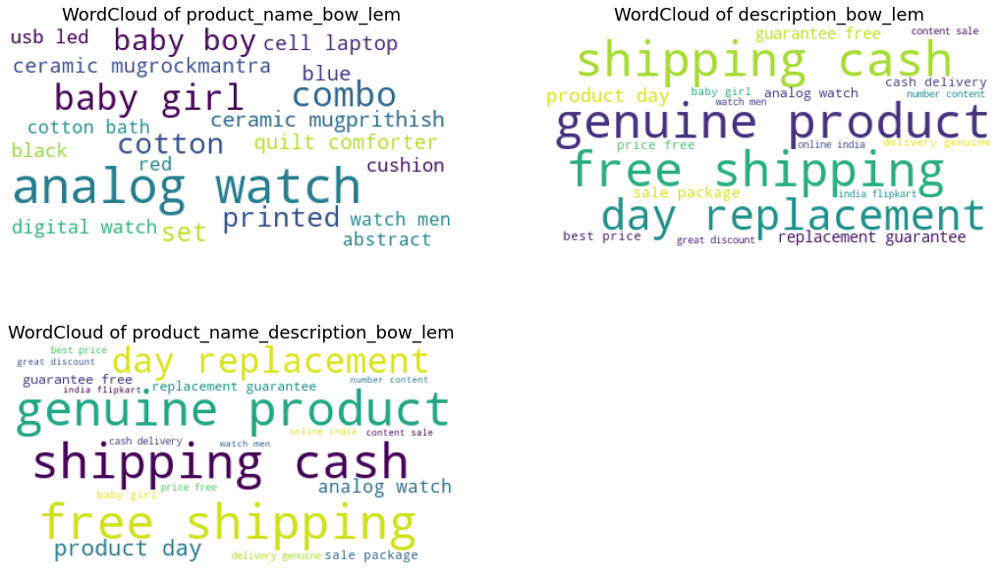

In [34]:
# Comparison of wordclouds of product_name_bow_lem, description_bow_lem & product_name_description_bow_lem
from PIL import Image
from wordcloud import WordCloud

list_feat_comp = ['product_name_bow_lem', 'description_bow_lem', 
                  'product_name_description_bow_lem']

plt.figure(figsize = (18,6))
plt.subplots_adjust(top = 1.5)

for index, feat in enumerate(list_feat_comp):    
    text = data[feat].sum()
    plt.subplot(2,2,index+1)
    wordcloud = WordCloud(background_color = 'white', max_words = 20).generate(text)
    plt.title('WordCloud of '+ feat, size = 18)
    plt.imshow(wordcloud)
    plt.axis("off")

plt.show()

In [35]:
data.columns

Index(['uniq_id', 'product_name', 'product_category_tree', 'image',
       'description', 'product_name_description', 'first_category',
       'second_category', 'third_category', 'category_label',
       'product_name_bow', 'product_name_bow_lem', 'product_name_dl',
       'description_bow', 'description_bow_lem', 'description_dl',
       'product_name_description_bow', 'product_name_description_bow_lem',
       'product_name_description_dl'],
      dtype='object')

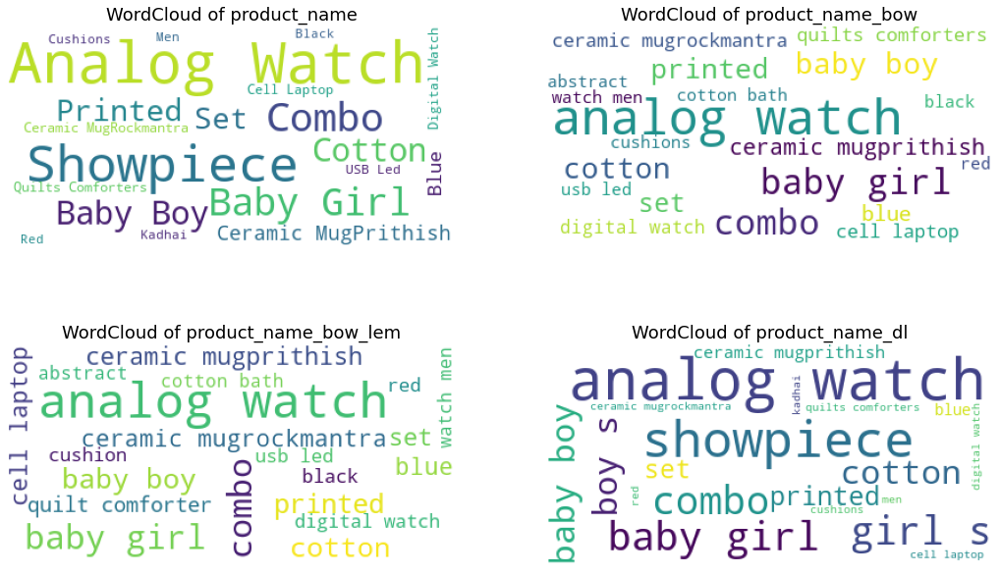

In [36]:
# Comparison of wordclouds of product_name, product_name_bow, product_name_bow_lem & product_name_dl
list_feat_comp = ['product_name', 'product_name_bow', 
                  'product_name_bow_lem', 'product_name_dl']

plt.figure(figsize = (18,6))
plt.subplots_adjust(top = 1.5)

for index, feat in enumerate(list_feat_comp):    
    text = data[feat].sum()
    plt.subplot(2,2,index+1)
    wordcloud = WordCloud(background_color = 'white', max_words = 20).generate(text)
    plt.title('WordCloud of '+ feat, size = 18)
    plt.imshow(wordcloud)
    plt.axis("off")

plt.show()

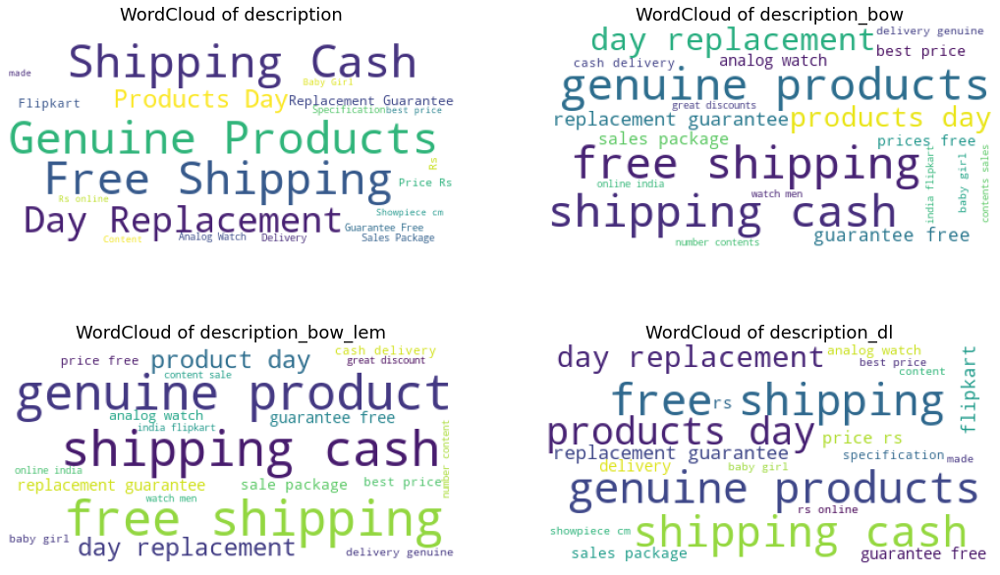

In [37]:
# Comparison of wordclouds of description, description_bow, description_bow_lem & description_dl
list_feat_comp = ['description', 'description_bow', 
                  'description_bow_lem', 'description_dl']

plt.figure(figsize = (18,6))
plt.subplots_adjust(top = 1.5)

for index, feat in enumerate(list_feat_comp):    
    text = data[feat].sum()
    plt.subplot(2,2,index+1)
    wordcloud = WordCloud(background_color = 'white', max_words = 20).generate(text)
    plt.title('WordCloud of '+ feat, size = 18)
    plt.imshow(wordcloud)
    plt.axis("off")

plt.show()

In [38]:
# Create a dataframe for each first_category
data_home_furn = data.loc[data['first_category'] == 'Home Furnishing']
data_baby = data.loc[data['first_category'] == 'Baby Care']
data_watches = data.loc[data['first_category'] == 'Watches']
data_home_decor = data.loc[data['first_category'] == 'Home Decor & Festive Needs']
data_kitchen = data.loc[data['first_category'] == 'Kitchen & Dining']
data_beauty = data.loc[data['first_category'] == 'Beauty and Personal Care']
data_computers = data.loc[data['first_category'] == 'Computers']

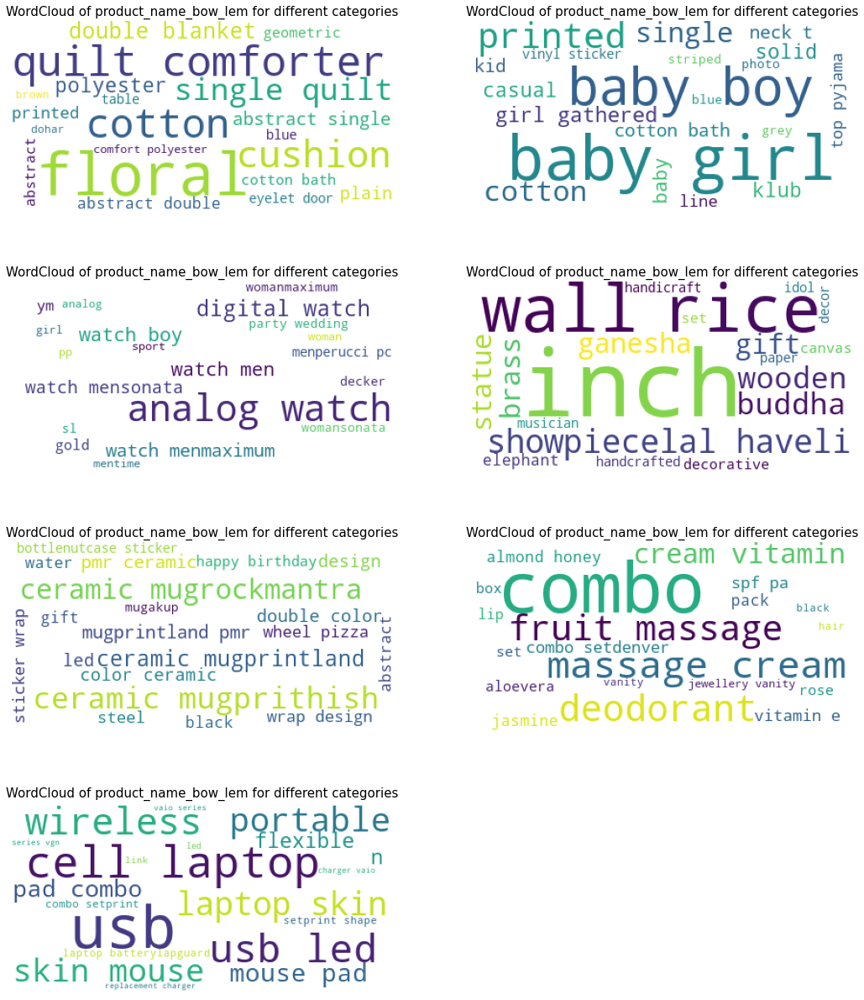

In [39]:
# Comparison of wordclouds of product_name_bow_lem for different categories
list_data_comp = [data_home_furn, data_baby, data_watches, data_home_decor,
                 data_kitchen, data_beauty, data_computers]

plt.figure(figsize = (18,12))
plt.subplots_adjust(top = 1.5)

for index, data_cat in enumerate(list_data_comp):    
    text = data_cat['product_name_bow_lem'].sum()
    plt.subplot(4,2,index+1)
    wordcloud = WordCloud(background_color = 'white', max_words = 20).generate(text)
    plt.imshow(wordcloud)
    plt.title('WordCloud of product_name_bow_lem for different categories', size = 15)
    plt.axis("off")

plt.show()

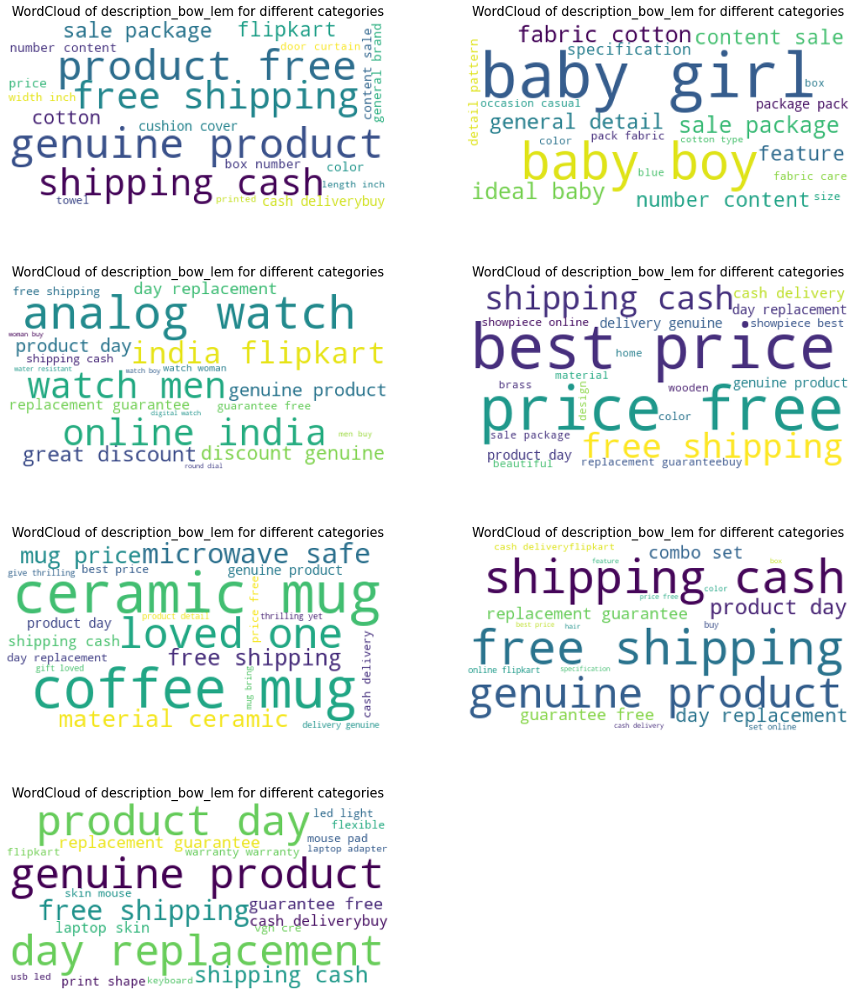

In [40]:
# Comparison of wordclouds of description_bow_lem for different categories
list_data_comp = [data_home_furn, data_baby, data_watches, data_home_decor,
                 data_kitchen, data_beauty, data_computers]

plt.figure(figsize = (18,12))
plt.subplots_adjust(top = 1.5)

for index, data_cat in enumerate(list_data_comp):    
    text = data_cat['description_bow_lem'].sum()
    plt.subplot(4,2,index+1)
    wordcloud = WordCloud(background_color = 'white', max_words = 20).generate(text)
    plt.imshow(wordcloud)
    plt.title('WordCloud of description_bow_lem for different categories', size = 15)
    plt.axis("off")

plt.show()

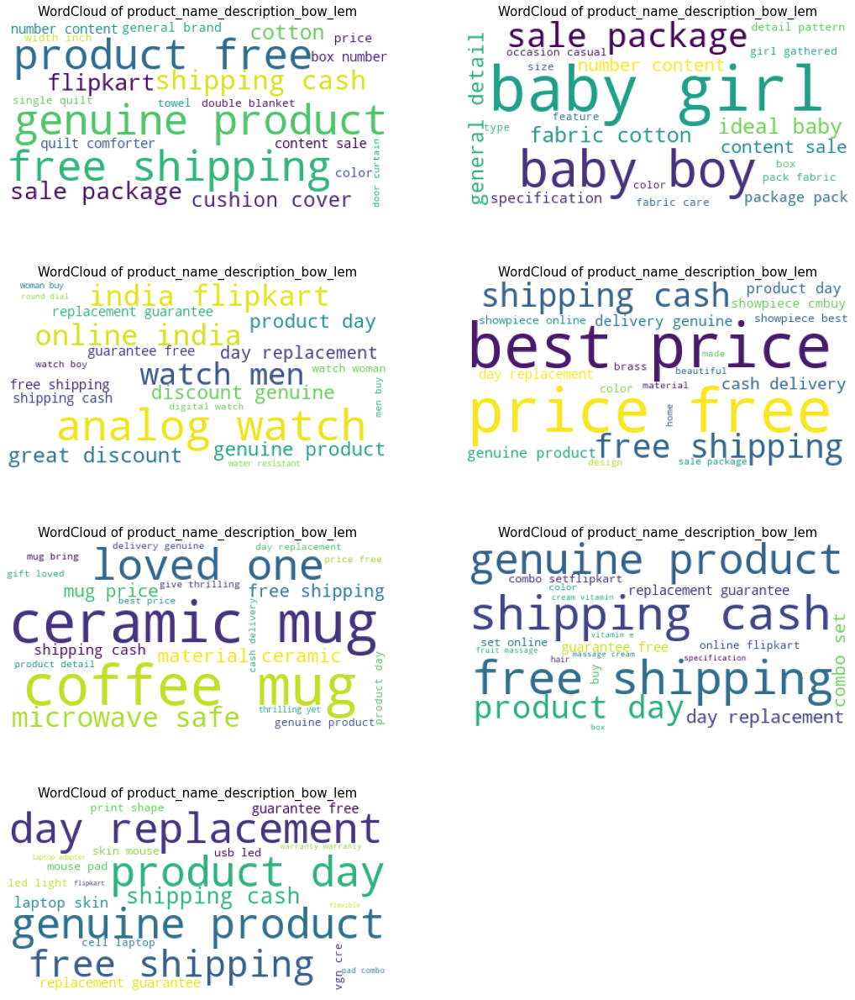

In [41]:
# Comparison of wordclouds of product_name_description_bow_lem for different categories
list_data_comp = [data_home_furn, data_baby, data_watches, data_home_decor,
                 data_kitchen, data_beauty, data_computers]

plt.figure(figsize = (18,12))
plt.subplots_adjust(top = 1.5)

for index, data_cat in enumerate(list_data_comp):    
    text = data_cat['product_name_description_bow_lem'].sum()
    plt.subplot(4,2,index+1)
    wordcloud = WordCloud(background_color = 'white', max_words = 20).generate(text)
    plt.imshow(wordcloud)
    plt.title('WordCloud of product_name_description_bow_lem', size = 15)
    plt.axis("off")

plt.show()

### LDA + CountVectorizer on cleaned descriptions

In [42]:
from sklearn.feature_extraction.text import CountVectorizer

tf_vectorizer = CountVectorizer(max_df = 0.95,
                                min_df = 1,
                                stop_words = 'english')
tf = tf_vectorizer.fit_transform(data['description_bow_lem'])

In [43]:
# Création du modèle LDA
from sklearn.decomposition import LatentDirichletAllocation
n_topics = 10

lda = LatentDirichletAllocation(n_components = n_topics,
                                max_iter = 5,
                                learning_method = 'online',
                                learning_offset = 50,
                                random_state = 0)

# Fitter sur les données
lda.fit(tf)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          max_iter=5, random_state=0)

In [44]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:" % (topic_idx))
        print (" ".join([feature_names[i]
                       for i in topic.argsort()[:-no_top_words -1:-1]]))

display_topics(lda, tf_vectorizer.get_feature_names(), 10)

Topic 0:
cotton baby pack color fabric specification general girl package sale
Topic 1:
surgical sstudio hospital scrub gown quality high viscous iso certified
Topic 2:
bowl singing jewellery play vanity vibration cleaning negative product indian
Topic 3:
laptop skin shape sticker warranty wall inch feature pad mouse
Topic 4:
free product delivery cash shipping buy genuine replacement day guarantee
Topic 5:
mug ceramic coffee perfect gift design material safe tea loved
Topic 6:
warranty adapter usb power light laptop led replacement charger vgn
Topic 7:
hair trait type shampoo ideal oil specification quantity woman brush
Topic 8:
usb fan table lamp otg phone smart mobile android steel
Topic 9:
baby boy jug copper pizza neck girl glass india cutter


### LDA + CountVectorizer on raw descriptions

In [45]:
from sklearn.feature_extraction.text import CountVectorizer

tf_vectorizer = CountVectorizer(max_df = 0.95,
                                min_df = 1,
                                stop_words = 'english')
tf = tf_vectorizer.fit_transform(data['description'])

In [46]:
# Création du modèle LDA
from sklearn.decomposition import LatentDirichletAllocation
n_topics = 10

lda = LatentDirichletAllocation(n_components = n_topics,
                                max_iter = 5,
                                learning_method = 'online',
                                learning_offset = 50,
                                random_state = 0)

# Fitter sur les données
lda.fit(tf)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          max_iter=5, random_state=0)

In [47]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:" % (topic_idx))
        print (" ".join([feature_names[i]
                       for i in topic.argsort()[:-no_top_words -1:-1]]))

display_topics(lda, tf_vectorizer.get_feature_names(), 10)

Topic 0:
scissors casserole chef handi 1500 multifunction cookart scissor pedrini corkscrew
Topic 1:
skin oil traits shampoo men soap extract ml copper jug
Topic 2:
baby fabric details cotton girl dress specifications boy general ideal
Topic 3:
laptop warranty skin shapes mouse pad print combo usb set
Topic 4:
products free rs delivery buy shipping genuine cash 30 day
Topic 5:
beauty lip cream oxyglow eye massage face vitamin care fruit
Topic 6:
cm features color material pack design specifications box model price
Topic 7:
gb masks terracotta 32 drive learning pen 3d bengal west
Topic 8:
mug coffee mugs ceramic perfect tea bring make quality printland
Topic 9:
parrot 47m play belts deep grapefruit burt shea blackled craftcart


### LDA + Tf-idf on raw descriptions

In [48]:
# create bag of words (Tf-idf) for 'description' feature 
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

tfidf = ctf.fit_transform(data['description'])

In [49]:
# Création du modèle LDA
from sklearn.decomposition import LatentDirichletAllocation
n_topics = 10

lda = LatentDirichletAllocation(n_components = n_topics,
                                max_iter = 5,
                                learning_method = 'online',
                                learning_offset = 50,
                                random_state = 0)

# Fitter sur les données
lda.fit(tfidf)

LatentDirichletAllocation(learning_method='online', learning_offset=50,
                          max_iter=5, random_state=0)

In [50]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:" % (topic_idx))
        print (" ".join([feature_names[i]
                       for i in topic.argsort()[:-no_top_words -1:-1]]))

display_topics(lda, ctf.get_feature_names(), 10)

Topic 0:
combo force metallino inlaid 681gm_wht malhar dg0939 looks signer returnfavors
Topic 1:
shadow bluetooth ipad version runway milani andriod itag wet majesty
Topic 2:
baby girl details fabric cotton dress boy neck sleeve pack
Topic 3:
pedrini corkscrew idli waiter knife idlis maker plates plate vatika
Topic 4:
warranty adapter vgn vaio power laptop charger 19 smartpro covered
Topic 5:
mug ceramic rockmantra coffee perfect loved gift dishwasher porcelain thrilling
Topic 6:
hair shampoo traits conditioner ml kerastase nutritive nutrition bain complete
Topic 7:
cranberry everytime overwhelms sweetness excellent taste learning 3d soex arabian
Topic 8:
com flipkart products genuine cash shipping delivery free buy 30
Topic 9:
help belts pine separate timepieces abroad finished intricately sophistication oil


### NMF + Tfidf on raw description

In [51]:
# Une alternative : NMF (Negative Matrix Factorization)
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF

# NMF is able to use tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95,
                                   min_df=2,
                                   stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(data['description'])
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

no_topics = 10

# Run NMF
nmf = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf)

no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic 0:
com flipkart genuine cash shipping delivery products free buy guarantee
Topic 1:
watch analog men discounts india great women sonata dial online
Topic 2:
baby girl details fabric cotton dress boy sleeve neck shirt
Topic 3:
rockmantra mug ceramic stays porcelain crafting permanent thrilling ensuring start
Topic 4:
showpiece cm best prices online 30 kadhai guarantee replacement day
Topic 5:
cm pack design polyester color model package inch features sales
Topic 6:
mug coffee ceramic mugs tea perfect printland prithish presented wardrobe
Topic 7:
laptop skin shapes warranty battery mouse print pad cell inches
Topic 8:
abstract blanket single double com flipkart quilts comforters buy genuine
Topic 9:
usb led light hub portable flexible bulb fan port power


# Bag of word - CountVectorizer

In [52]:
# Create labels for first_category
print("catégories : ", list_categories)
true_labels = true_label.tolist()
print("true_labels : ", true_labels)

catégories :  ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
true_labels :  [4, 0, 0, 4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 4, 3, 5, 5, 4, 0, 4, 0, 1, 5, 5, 5, 2, 5, 1, 5, 2, 5, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 5, 5, 0, 4, 5, 5, 5, 4, 5, 0, 0, 0, 1, 1, 4, 0, 3, 3, 0, 0, 3, 3, 5, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 3, 3, 4, 4, 4, 0, 4, 4, 4, 0, 3, 0, 5, 0, 2, 3, 0, 3, 2, 4, 0, 2, 3, 1, 1, 1, 1, 3, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 3, 3, 3, 3, 5, 3, 5, 3, 3, 0, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 3, 5, 3, 0, 3, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 3, 3, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 3, 5, 3, 5, 5, 5, 3, 5, 3, 3, 3, 5, 3, 5, 3, 3, 3, 3, 5, 5, 5, 3, 3, 3, 3, 5, 5, 0, 6, 6, 6

In [77]:
# create bag of words (CountVectorizer) for 'description_bow_lem' feature
from sklearn.feature_extraction.text import CountVectorizer

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'description_bow_lem'
cv_fit = cvect.fit(data[feat])

cv_transform = cvect.transform(data[feat])

cv_transform

<1050x4574 sparse matrix of type '<class 'numpy.int64'>'
	with 32276 stored elements in Compressed Sparse Row format>

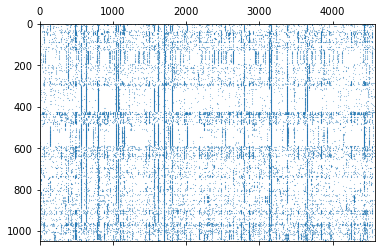

In [78]:
plt.spy(cv_transform, precision = 0.1, aspect = 'auto', markersize = 0.1)

In [73]:
import time

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features, perplexity) :
    time1 = time.time()
    num_labels=len(list_categories)
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(true_labels, cls.labels_),4)
    data['cluster'] = cls.labels_
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

# Calcul PCA, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct_pca(features, n_components) :
    time1 = time.time()
    num_labels=len(list_categories)
    print("Dimensions dataset avant réduction PCA : ", features.shape)
    pca = decomposition.PCA(n_components=0.99)
    feat_pca = pca.fit_transform(features)
    rint("Dimensions dataset après réduction PCA : ", feat_pca.shape)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(feat_pca)
    ARI = np.round(metrics.adjusted_rand_score(true_labels, cls.labels_),4)
    data['cluster'] = cls.labels_
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, feat_pca, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, true_labels, labels, ARI) :
    fig = plt.figure(figsize=(18,7))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=true_labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=list_categories, loc="best", title="Categorie", fontsize = 9)
    plt.title('Représentation des descriptions par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters", fontsize = 10)
    plt.title('Représentation des descriptions par clusters')
    
    plt.show()
    print("ARI : ", ARI)

In [80]:
# Execute countvectorizer model with perplexity from 1 to 50 for 'description_bow_lem' feature
ARI_des_bow_lem = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(cv_transform, perplexity)
    ARI_des_bow_lem.append(ARI)

ARI :  0.1043 time :  5.0
ARI :  0.207 time :  5.0


KeyboardInterrupt: 

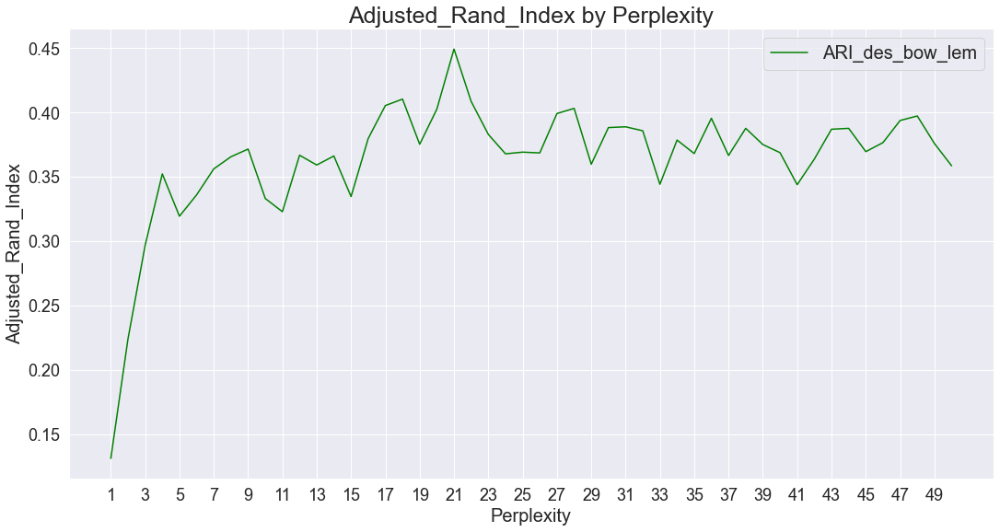

In [143]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

In [144]:
# create bag of words (CountVectorizer) for 'product_name_bow_lem' feature
from sklearn.feature_extraction.text import CountVectorizer

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_bow_lem'
cv_fit = cvect.fit(data[feat])

cv_transform = cvect.transform(data[feat])

In [145]:
# Execute countvectorizer model with perplexity from 1 to 50 for 'product_name_bow_lem' feature
ARI_prod_bow_lem = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(cv_transform, perplexity)
    ARI_prod_bow_lem.append(ARI)

ARI :  0.1368 time :  5.0
ARI :  0.2562 time :  5.0
ARI :  0.325 time :  5.0
ARI :  0.3273 time :  5.0
ARI :  0.3576 time :  5.0
ARI :  0.3759 time :  5.0
ARI :  0.3379 time :  6.0
ARI :  0.3146 time :  5.0
ARI :  0.3765 time :  6.0
ARI :  0.377 time :  6.0
ARI :  0.3525 time :  5.0
ARI :  0.4144 time :  6.0
ARI :  0.3302 time :  6.0
ARI :  0.3457 time :  6.0
ARI :  0.4314 time :  7.0
ARI :  0.3908 time :  6.0
ARI :  0.4134 time :  6.0
ARI :  0.384 time :  6.0
ARI :  0.3783 time :  6.0
ARI :  0.3763 time :  6.0
ARI :  0.3684 time :  6.0
ARI :  0.3726 time :  6.0
ARI :  0.3813 time :  6.0
ARI :  0.386 time :  7.0
ARI :  0.3777 time :  7.0
ARI :  0.3398 time :  8.0
ARI :  0.3872 time :  8.0
ARI :  0.3432 time :  8.0
ARI :  0.3543 time :  8.0
ARI :  0.3384 time :  8.0
ARI :  0.359 time :  8.0
ARI :  0.3762 time :  8.0
ARI :  0.3572 time :  8.0
ARI :  0.3397 time :  9.0
ARI :  0.3806 time :  8.0
ARI :  0.3687 time :  8.0
ARI :  0.3575 time :  8.0
ARI :  0.3608 time :  8.0
ARI :  0.3609 tim

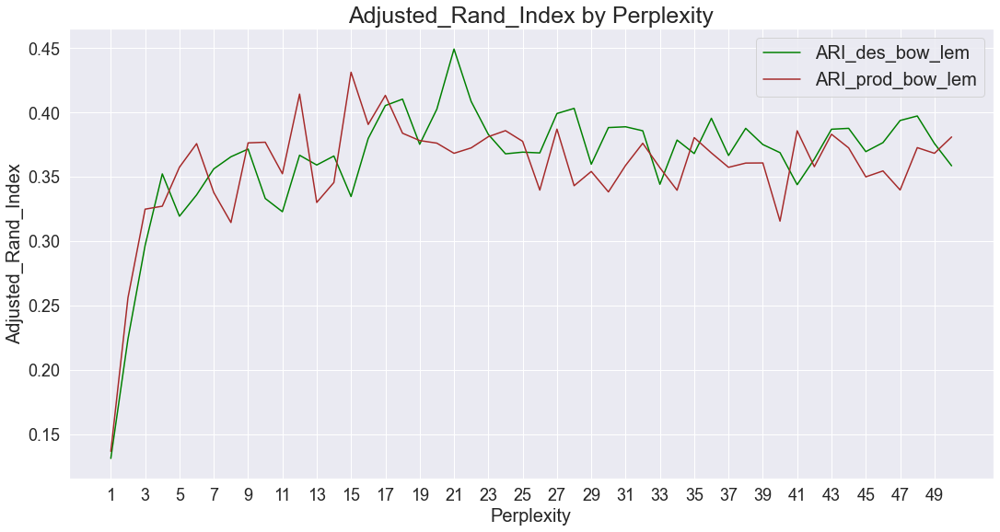

In [147]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

In [148]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature
from sklearn.feature_extraction.text import CountVectorizer

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_description_bow_lem'
cv_fit = cvect.fit(data[feat])

cv_transform = cvect.transform(data[feat])

In [149]:
# Execute countvectorizer model with perplexity from 1 to 50 for 'product_name_description_bow_lem' feature
ARI_prod_des_bow_lem = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(cv_transform, perplexity)
    ARI_prod_des_bow_lem.append(ARI)

ARI :  0.0829 time :  5.0
ARI :  0.2077 time :  5.0
ARI :  0.2919 time :  6.0
ARI :  0.3251 time :  6.0
ARI :  0.3304 time :  6.0
ARI :  0.4214 time :  6.0
ARI :  0.4119 time :  6.0
ARI :  0.3569 time :  6.0
ARI :  0.3814 time :  6.0
ARI :  0.4001 time :  6.0
ARI :  0.3936 time :  6.0
ARI :  0.4612 time :  6.0
ARI :  0.3894 time :  7.0
ARI :  0.4084 time :  6.0
ARI :  0.4087 time :  6.0
ARI :  0.4343 time :  7.0
ARI :  0.3794 time :  6.0
ARI :  0.3874 time :  7.0
ARI :  0.4572 time :  7.0
ARI :  0.3795 time :  7.0
ARI :  0.3959 time :  7.0
ARI :  0.3728 time :  7.0
ARI :  0.3797 time :  8.0
ARI :  0.4456 time :  8.0
ARI :  0.4443 time :  8.0
ARI :  0.3918 time :  8.0
ARI :  0.4307 time :  8.0
ARI :  0.413 time :  8.0
ARI :  0.4211 time :  8.0
ARI :  0.4417 time :  8.0
ARI :  0.4017 time :  9.0
ARI :  0.4351 time :  9.0
ARI :  0.4291 time :  9.0
ARI :  0.4303 time :  9.0
ARI :  0.4328 time :  9.0
ARI :  0.4449 time :  9.0
ARI :  0.3744 time :  9.0
ARI :  0.3831 time :  10.0
ARI :  0.395

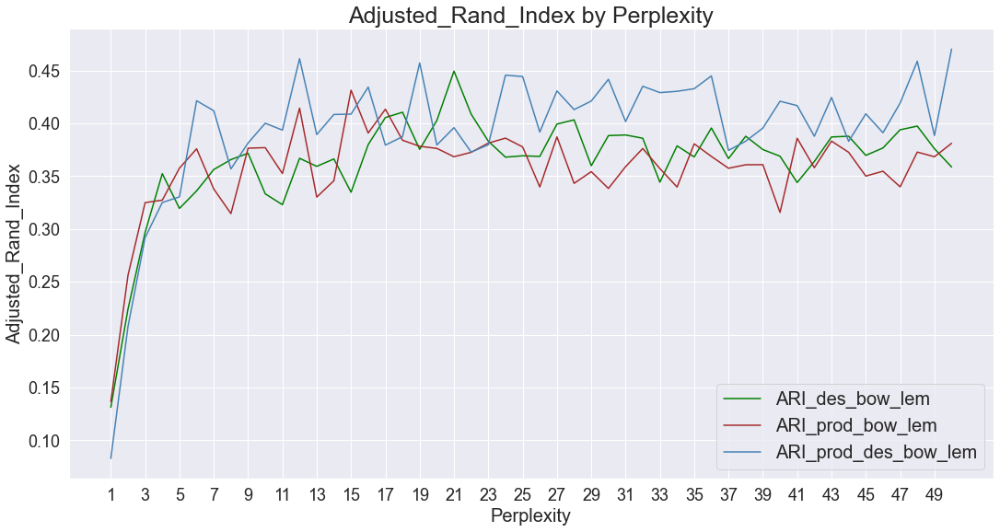

In [150]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem
y3 = ARI_prod_des_bow_lem

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')
ax.plot(x, y3, color = 'steelblue', label = 'ARI_prod_des_bow_lem')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

In [152]:
# create bag of words (CountVectorizer) for 'product_name_description_bow_lem' feature
# fitted on product_name_bow_lem
from sklearn.feature_extraction.text import CountVectorizer

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

cv_fit = cvect.fit(data['product_name_bow_lem'])

cv_transform = cvect.transform(data['product_name_description_bow_lem'])

In [153]:
# Execute countvectorizer model with perplexity from 1 to 50 for 'product_name_description_bow_lem' feature
# fitted on product_name_bow_lem
ARI_prod_des_bow_lem_fit_prod = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(cv_transform, perplexity)
    ARI_prod_des_bow_lem_fit_prod.append(ARI)

ARI :  0.096 time :  5.0
ARI :  0.2407 time :  5.0
ARI :  0.2849 time :  6.0
ARI :  0.3355 time :  5.0
ARI :  0.373 time :  5.0
ARI :  0.3476 time :  6.0
ARI :  0.3658 time :  6.0
ARI :  0.369 time :  6.0
ARI :  0.416 time :  6.0
ARI :  0.3975 time :  6.0
ARI :  0.3893 time :  6.0
ARI :  0.3888 time :  6.0
ARI :  0.4476 time :  6.0
ARI :  0.3747 time :  6.0
ARI :  0.3598 time :  6.0
ARI :  0.428 time :  6.0
ARI :  0.4165 time :  6.0
ARI :  0.4082 time :  7.0
ARI :  0.4287 time :  6.0
ARI :  0.4586 time :  7.0
ARI :  0.4037 time :  6.0
ARI :  0.4085 time :  7.0
ARI :  0.4098 time :  8.0
ARI :  0.4031 time :  8.0
ARI :  0.4201 time :  8.0
ARI :  0.417 time :  8.0
ARI :  0.4184 time :  8.0
ARI :  0.4041 time :  8.0
ARI :  0.3901 time :  8.0
ARI :  0.4017 time :  8.0
ARI :  0.4151 time :  8.0
ARI :  0.4405 time :  8.0
ARI :  0.4232 time :  9.0
ARI :  0.4107 time :  9.0
ARI :  0.3927 time :  9.0
ARI :  0.399 time :  9.0
ARI :  0.3835 time :  10.0
ARI :  0.4183 time :  9.0
ARI :  0.4051 time

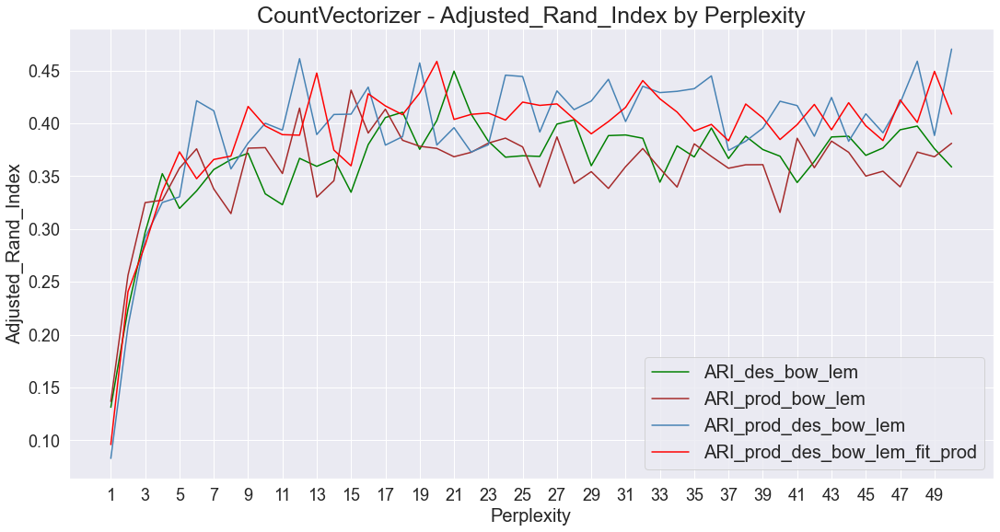

In [171]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem
y3 = ARI_prod_des_bow_lem
y4 = ARI_prod_des_bow_lem_fit_prod

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')
ax.plot(x, y3, color = 'steelblue', label = 'ARI_prod_des_bow_lem')
ax.plot(x, y4, color = 'red', label = 'ARI_prod_des_bow_lem_fit_prod')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('CountVectorizer - Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4703 time :  11.0


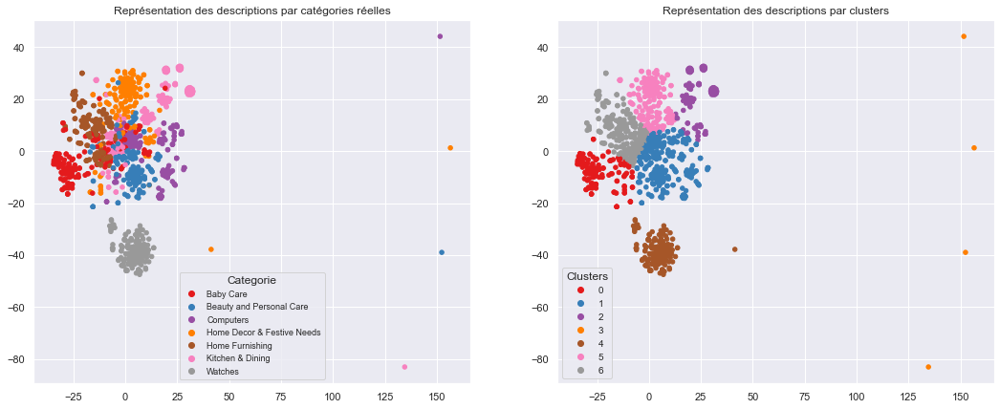

ARI :  0.4703


In [505]:
# DISPLAY BEST RESULTS CLUSTERING for 'product_name_description_bow_lem' and countvectorizer
# create bag of words(countvectorizer) for 'product_name_description_bow_lem' feature 
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_description_bow_lem'
cv_fit = cvect.fit(data[feat])

cv_transform = cvect.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 50 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(cv_transform, 50)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

_Conclusions of product_name_description_bow_lem clustering_

- best perplexity : 50
- ARI = 0.4703
- cluster #1 : 2 categories ('Beauty and Personnal Care' & 'Computers')
- cluster #3 : only 4 goods  

-> not recommended for automatic classification

In [506]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    130
1    283
2    101
3      4
4    151
5    163
6    218
Name: first_category, dtype: int64

In [507]:
# Confusion matrix
conf_mat = confusion_matrix(true_labels, labels)
print(conf_mat)

[[ 90  15   1   0   0   8  36]
 [  5 122   0   1   0  10  12]
 [  3 115  20   1   0   4   7]
 [ 12  15   1   1   1 113   7]
 [ 13   0   0   0   0   0 137]
 [  7  16  79   1   0  28  19]
 [  0   0   0   0 150   0   0]]


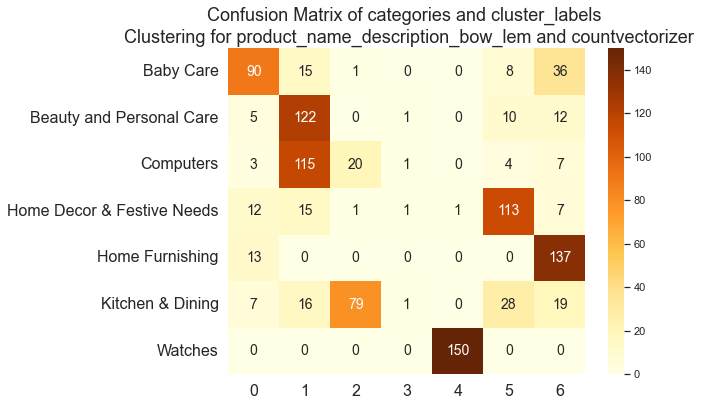

In [508]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [label for label in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for product_name_description_bow_lem and countvectorizer',
          size = 18);

In [509]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 90  15   0   8  36   1   0]
 [  5 123   0  10  12   0   0]
 [  3 116   0   4   7  20   0]
 [ 12  16   0 113   7   1   1]
 [ 13   0   0   0 137   0   0]
 [  7  17   0  28  19  79   0]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.692     0.600     0.643       150
  Beauty and Personal Care      0.429     0.820     0.563       150
                 Computers      0.000     0.000     0.000       150
Home Decor & Festive Needs      0.693     0.753     0.722       150
           Home Furnishing      0.628     0.913     0.745       150
          Kitchen & Dining      0.782     0.527     0.629       150
                   Watches      0.993     1.000     0.997       150

                  accuracy                          0.659      1050
                 macro avg      0.603     0.659     0.614      1050
              weighted avg      0.603     0.659     0.614      1050



C:\Users\33624\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\33624\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\33624\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\33624\anaconda3\lib\site-packages\sklearn\metr

In [511]:
# Create dataframe with categories and metrics
data_metrics_cv_prod_des = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)
data_metrics_cv_prod_des

,precision,recall,f1-score
Baby Care,0.692,0.600,0.643
Beauty and Personal Care,0.429,0.820,0.563
Computers,0.000,0.000,0.000
Home Decor & Festive Needs,0.693,0.753,0.722
Home Furnishing,0.628,0.913,0.745
Kitchen & Dining,0.782,0.527,0.629
Watches,0.993,1.000,0.997


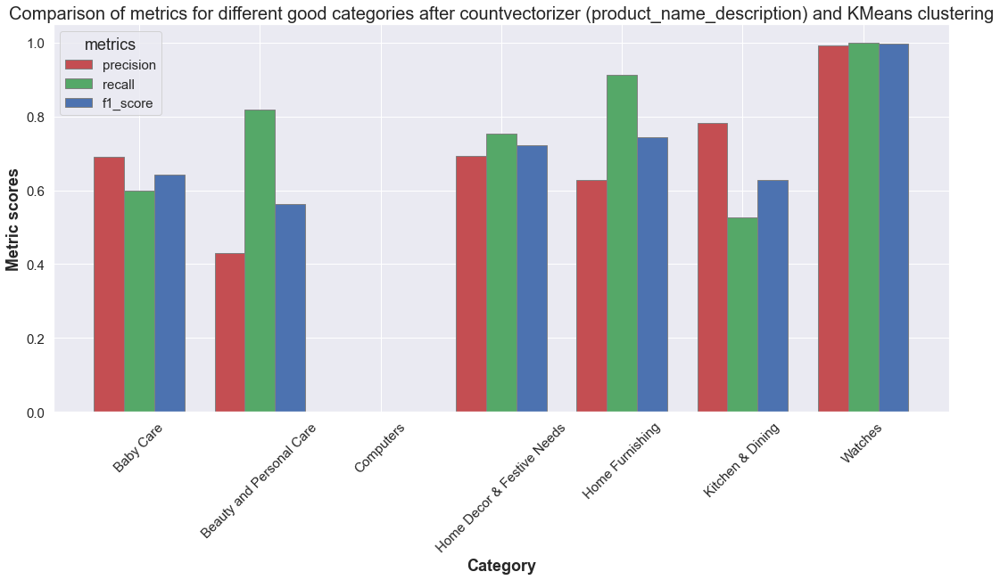

In [513]:
sns.set_theme(context='notebook', style='darkgrid')

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_cv_prod_des['precision'].values
recall = data_metrics_cv_prod_des['recall'].values
f1_score = data_metrics_cv_prod_des['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metric scores', fontweight ='bold', fontsize = 18)
plt.xticks([r + barWidth for r in range(len(precision))],
           list_categories, 
           size = 15,
           rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after countvectorizer (product_name_description) and KMeans clustering',
         size = 20)
plt.show()

# Bag of word - Tf-idf

In [437]:
# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', min_df=1)

feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

len(ctf.idf_)

AttributeError: 'list' object has no attribute 'lower'

In [379]:
ctf_transform

<1050x1758 sparse matrix of type '<class 'numpy.float64'>'
	with 5346 stored elements in Compressed Sparse Row format>

In [380]:
print(ctf_transform)

  (0, 1194)	0.3578477240554045
  (0, 1023)	0.3350409299765048
  (0, 526)	0.3648562202811703
  (0, 483)	0.5043581945843847
  (0, 445)	0.37680681471231187
  (0, 383)	0.3612685061236901
  (0, 9)	0.3157483532436593
  (1, 1594)	0.4239902589558366
  (1, 1366)	0.6808901947920618
  (1, 354)	0.368561449814368
  (1, 126)	0.4698757927977583
  (2, 1594)	0.3504090275394451
  (2, 1565)	0.5313164253544057
  (2, 529)	0.43066881537439117
  (2, 509)	0.5627253597896492
  (2, 354)	0.3045995904151959
  (3, 1436)	0.3828016970205792
  (3, 1361)	0.4136055855063974
  (3, 1333)	0.3718073133351309
  (3, 1228)	0.27475473086291863
  (3, 827)	0.33525601513910475
  (3, 539)	0.354459462978992
  (3, 447)	0.2559178626320504
  (3, 354)	0.23711687786548358
  (3, 140)	0.3300090411638644
  :	:
  (1045, 1103)	0.43471375137006607
  (1045, 857)	0.3597458223269377
  (1045, 524)	0.3932343893874289
  (1045, 492)	0.43471375137006607
  (1045, 25)	0.3798810174072152
  (1046, 1681)	0.4137921200024227
  (1046, 1666)	0.413792120002422

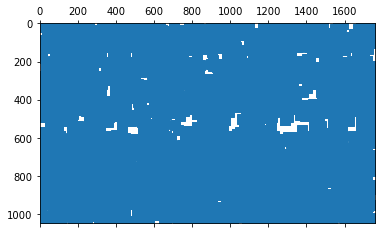

In [381]:
plt.spy(ctf_transform)

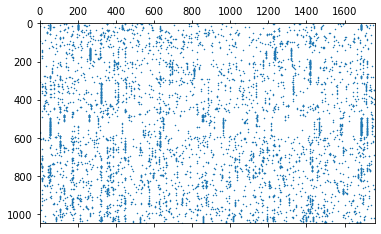

In [382]:
plt.spy(ctf_transform, precision = 0, markersize = 0.5)

In [383]:
# Execute TfidfVectorizer model with perplexity from 1 to 50 for 'product_name_bow_lem' feature
ARI_prod_bow_lem_tf = []

for perplexity in range(10, 51):
    ARI, X_tsne, labels = ARI_fct(ctf_transform, perplexity)
    ARI_prod_bow_lem_tf.append(ARI)

ARI :  0.3854 time :  7.0
ARI :  0.4415 time :  7.0
ARI :  0.4157 time :  6.0
ARI :  0.3894 time :  6.0
ARI :  0.4404 time :  6.0
ARI :  0.4742 time :  6.0
ARI :  0.3566 time :  6.0
ARI :  0.4569 time :  7.0


KeyboardInterrupt: 

In [157]:
# Execute TfidfVectorizer model with perplexity from 1 to 50 for 'product_name_bow_lem' feature
ARI_prod_bow_lem_tf = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(ctf_transform, perplexity)
    ARI_prod_bow_lem_tf.append(ARI)

ARI :  0.0507 time :  5.0
ARI :  0.2058 time :  5.0
ARI :  0.2681 time :  5.0
ARI :  0.363 time :  5.0
ARI :  0.3787 time :  5.0
ARI :  0.332 time :  5.0
ARI :  0.4483 time :  5.0
ARI :  0.4359 time :  6.0
ARI :  0.443 time :  6.0
ARI :  0.407 time :  6.0
ARI :  0.5224 time :  6.0
ARI :  0.5755 time :  7.0
ARI :  0.5239 time :  5.0
ARI :  0.5986 time :  5.0
ARI :  0.4591 time :  7.0
ARI :  0.501 time :  7.0
ARI :  0.5044 time :  6.0
ARI :  0.6004 time :  6.0
ARI :  0.5183 time :  5.0
ARI :  0.5447 time :  6.0
ARI :  0.5627 time :  6.0
ARI :  0.4967 time :  6.0
ARI :  0.4289 time :  7.0
ARI :  0.4315 time :  6.0
ARI :  0.5351 time :  6.0
ARI :  0.5138 time :  6.0
ARI :  0.37 time :  6.0
ARI :  0.4821 time :  6.0
ARI :  0.4455 time :  6.0
ARI :  0.4108 time :  7.0
ARI :  0.4523 time :  7.0
ARI :  0.502 time :  7.0
ARI :  0.472 time :  7.0
ARI :  0.4582 time :  7.0
ARI :  0.4289 time :  7.0
ARI :  0.4251 time :  7.0
ARI :  0.493 time :  8.0
ARI :  0.4059 time :  8.0
ARI :  0.4669 time :  

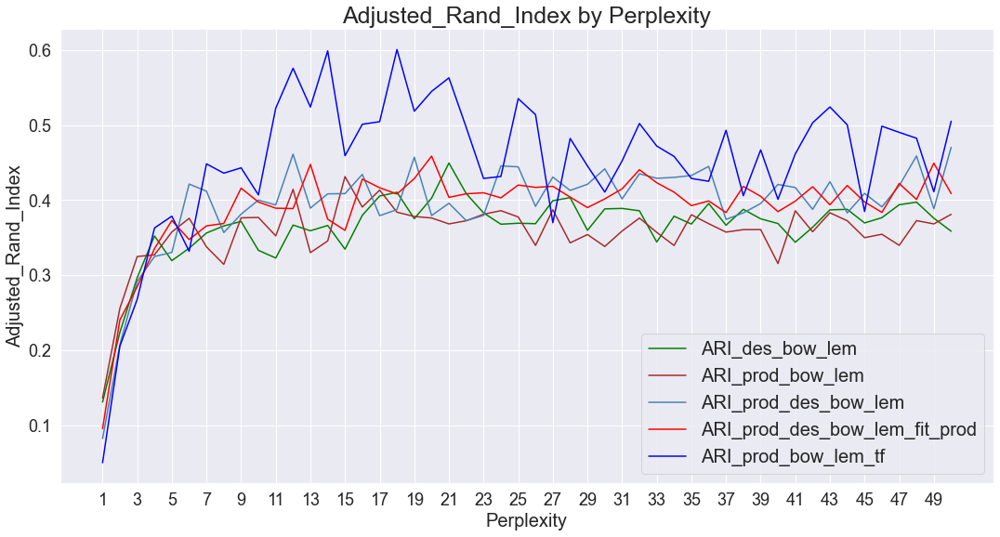

In [158]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem
y3 = ARI_prod_des_bow_lem
y4 = ARI_prod_des_bow_lem_fit_prod
y5 = ARI_prod_bow_lem_tf

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')
ax.plot(x, y3, color = 'steelblue', label = 'ARI_prod_des_bow_lem')
ax.plot(x, y4, color = 'red', label = 'ARI_prod_des_bow_lem_fit_prod')
ax.plot(x, y5, color = 'blue', label = 'ARI_prod_bow_lem_tf')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

In [159]:
# create bag of words (Tf-idf) for 'description_bow_lem' feature 
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

In [160]:
# Execute TfidfVectorizer model with perplexity from 1 to 50 for 'product_name_bow_lem' feature
ARI_des_bow_lem_tf = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(ctf_transform, perplexity)
    ARI_des_bow_lem_tf.append(ARI)

ARI :  0.0606 time :  6.0
ARI :  0.2838 time :  7.0
ARI :  0.2921 time :  6.0
ARI :  0.3711 time :  6.0
ARI :  0.3835 time :  6.0
ARI :  0.3804 time :  5.0
ARI :  0.4396 time :  5.0
ARI :  0.4925 time :  5.0
ARI :  0.5028 time :  5.0
ARI :  0.5471 time :  6.0
ARI :  0.5681 time :  5.0
ARI :  0.4638 time :  5.0
ARI :  0.5318 time :  6.0
ARI :  0.5537 time :  5.0
ARI :  0.5695 time :  6.0
ARI :  0.5281 time :  6.0
ARI :  0.5776 time :  6.0
ARI :  0.51 time :  6.0
ARI :  0.5698 time :  6.0
ARI :  0.5592 time :  6.0
ARI :  0.5446 time :  6.0
ARI :  0.5591 time :  6.0
ARI :  0.5193 time :  6.0
ARI :  0.5001 time :  6.0
ARI :  0.5211 time :  7.0
ARI :  0.5202 time :  6.0
ARI :  0.5156 time :  7.0
ARI :  0.5122 time :  6.0
ARI :  0.4686 time :  6.0
ARI :  0.4158 time :  8.0
ARI :  0.4281 time :  8.0
ARI :  0.4502 time :  9.0
ARI :  0.3938 time :  8.0
ARI :  0.3821 time :  8.0
ARI :  0.3724 time :  8.0
ARI :  0.4372 time :  8.0
ARI :  0.4669 time :  8.0
ARI :  0.4471 time :  7.0
ARI :  0.398 t

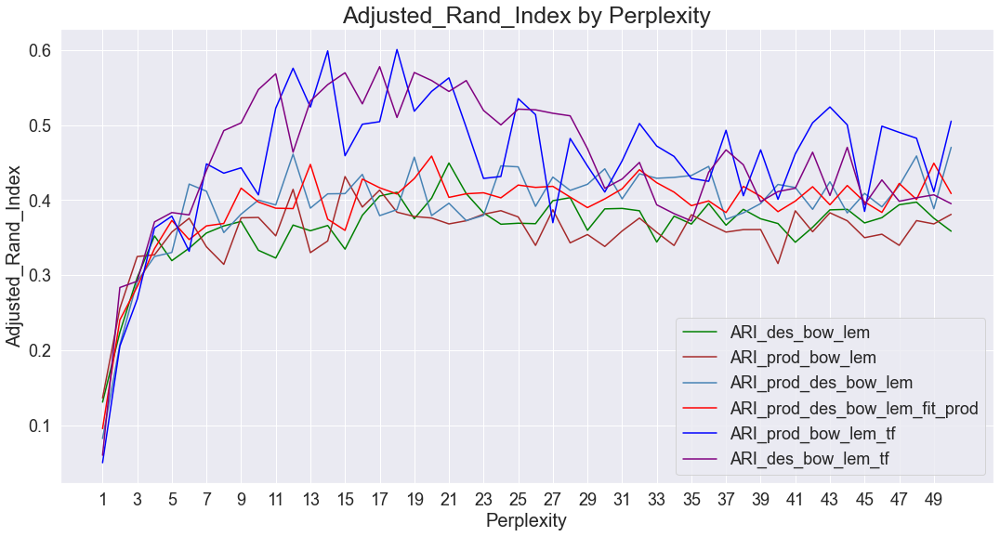

In [161]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem
y3 = ARI_prod_des_bow_lem
y4 = ARI_prod_des_bow_lem_fit_prod
y5 = ARI_prod_bow_lem_tf
y6 = ARI_des_bow_lem_tf

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')
ax.plot(x, y3, color = 'steelblue', label = 'ARI_prod_des_bow_lem')
ax.plot(x, y4, color = 'red', label = 'ARI_prod_des_bow_lem_fit_prod')
ax.plot(x, y5, color = 'blue', label = 'ARI_prod_bow_lem_tf')
ax.plot(x, y6, color = 'purple', label = 'ARI_des_bow_lem_tf')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 18)

plt.show()

In [162]:
# create bag of words (Tf-idf) for 'product_name_description_bow_lem' feature 
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

In [163]:
# Execute TfidfVectorizer model with perplexity from 1 to 50 for 'product_name_description_bow_lem' feature
ARI_prod_des_bow_lem_tf = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(ctf_transform, perplexity)
    ARI_prod_des_bow_lem_tf.append(ARI)

ARI :  0.0512 time :  5.0
ARI :  0.2335 time :  6.0
ARI :  0.4075 time :  5.0
ARI :  0.3635 time :  5.0
ARI :  0.3921 time :  6.0
ARI :  0.4139 time :  5.0
ARI :  0.489 time :  5.0
ARI :  0.461 time :  6.0
ARI :  0.4707 time :  5.0
ARI :  0.507 time :  5.0
ARI :  0.4545 time :  6.0
ARI :  0.577 time :  6.0
ARI :  0.4926 time :  5.0
ARI :  0.5399 time :  6.0
ARI :  0.5189 time :  6.0
ARI :  0.524 time :  5.0
ARI :  0.4786 time :  6.0
ARI :  0.5133 time :  6.0
ARI :  0.5513 time :  6.0
ARI :  0.5325 time :  6.0
ARI :  0.5101 time :  6.0
ARI :  0.4743 time :  6.0
ARI :  0.5657 time :  6.0
ARI :  0.5455 time :  6.0
ARI :  0.5666 time :  6.0
ARI :  0.5527 time :  6.0
ARI :  0.572 time :  6.0
ARI :  0.5214 time :  6.0
ARI :  0.5243 time :  6.0
ARI :  0.5019 time :  6.0
ARI :  0.5214 time :  7.0
ARI :  0.5386 time :  7.0
ARI :  0.4678 time :  8.0
ARI :  0.4937 time :  7.0
ARI :  0.5129 time :  7.0
ARI :  0.4866 time :  8.0
ARI :  0.4739 time :  8.0
ARI :  0.5298 time :  7.0
ARI :  0.4978 time

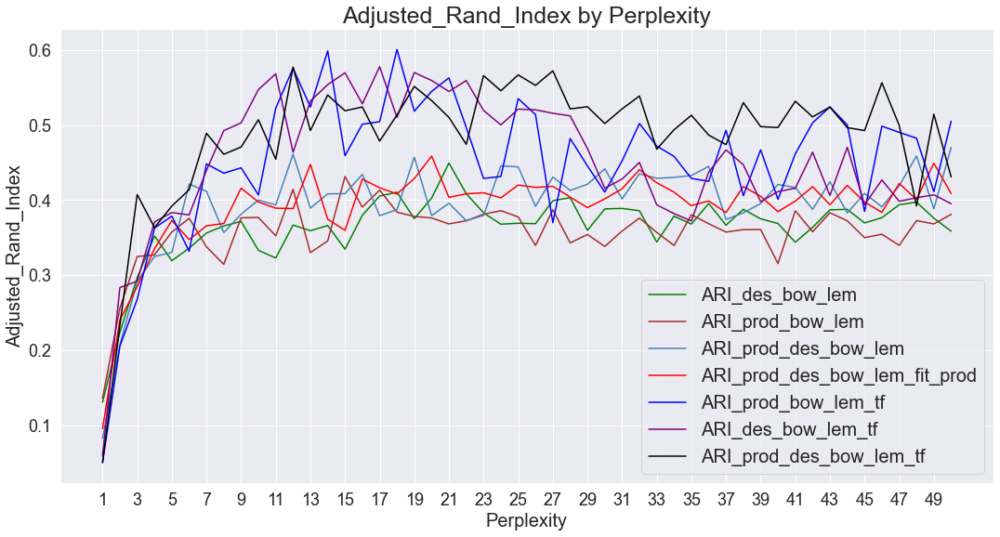

In [164]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem
y3 = ARI_prod_des_bow_lem
y4 = ARI_prod_des_bow_lem_fit_prod
y5 = ARI_prod_bow_lem_tf
y6 = ARI_des_bow_lem_tf
y7 = ARI_prod_des_bow_lem_tf

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')
ax.plot(x, y3, color = 'steelblue', label = 'ARI_prod_des_bow_lem')
ax.plot(x, y4, color = 'red', label = 'ARI_prod_des_bow_lem_fit_prod')
ax.plot(x, y5, color = 'blue', label = 'ARI_prod_bow_lem_tf')
ax.plot(x, y6, color = 'purple', label = 'ARI_des_bow_lem_tf')
ax.plot(x, y7, color = 'black', label = 'ARI_prod_des_bow_lem_tf')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

In [165]:
# create bag of words (Tf-idf) for 'product_name_description_bow_lem' feature
# fit on product_name_bow_lem
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

ctf_fit = ctf.fit(data['product_name_bow_lem'])

ctf_transform = ctf.transform(data['product_name_description_bow_lem'])

In [166]:
# Execute TfidfVectorizer model with perplexity from 1 to 50 for 'product_name_description_bow_lem' feature
# Fit on product_name_bow_lem
ARI_prod_des_bow_lem_tf_fit_prod = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(ctf_transform, perplexity)
    ARI_prod_des_bow_lem_tf_fit_prod.append(ARI)

ARI :  0.0897 time :  5.0
ARI :  0.2391 time :  5.0
ARI :  0.3326 time :  5.0
ARI :  0.3743 time :  5.0
ARI :  0.3637 time :  5.0
ARI :  0.3627 time :  6.0
ARI :  0.4533 time :  5.0
ARI :  0.4555 time :  5.0
ARI :  0.5497 time :  6.0
ARI :  0.5375 time :  6.0
ARI :  0.5284 time :  6.0
ARI :  0.538 time :  6.0
ARI :  0.489 time :  6.0
ARI :  0.5054 time :  6.0
ARI :  0.5224 time :  6.0
ARI :  0.5511 time :  6.0
ARI :  0.5484 time :  6.0
ARI :  0.5418 time :  6.0
ARI :  0.524 time :  6.0
ARI :  0.5282 time :  6.0
ARI :  0.5461 time :  6.0
ARI :  0.4997 time :  6.0
ARI :  0.54 time :  6.0
ARI :  0.5147 time :  6.0
ARI :  0.5178 time :  6.0
ARI :  0.5254 time :  6.0
ARI :  0.5367 time :  6.0
ARI :  0.5171 time :  7.0
ARI :  0.4643 time :  7.0
ARI :  0.4836 time :  7.0
ARI :  0.4759 time :  7.0
ARI :  0.4284 time :  7.0
ARI :  0.5139 time :  8.0
ARI :  0.5117 time :  7.0
ARI :  0.5396 time :  7.0
ARI :  0.4492 time :  8.0
ARI :  0.4602 time :  8.0
ARI :  0.4444 time :  7.0
ARI :  0.4963 tim

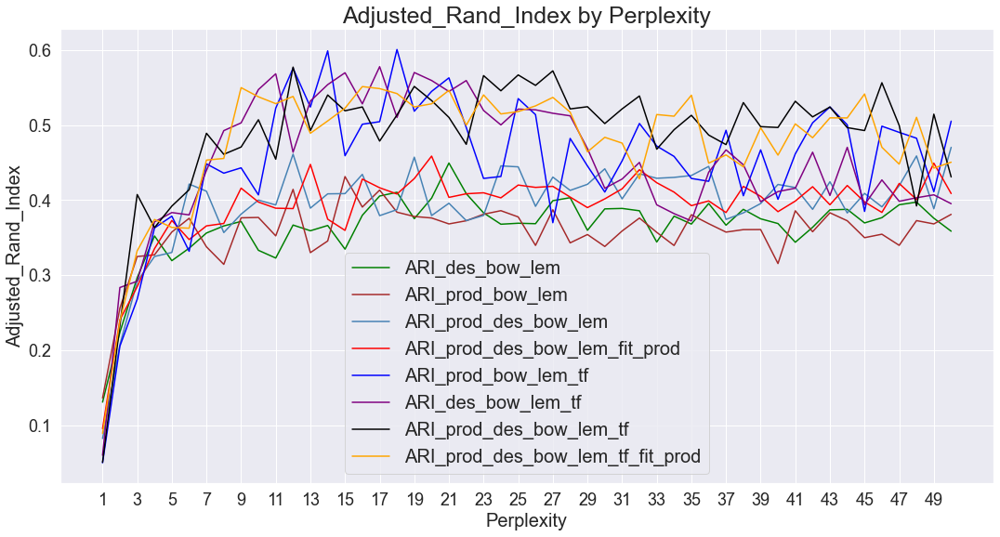

In [168]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem
y2 = ARI_prod_bow_lem
y3 = ARI_prod_des_bow_lem
y4 = ARI_prod_des_bow_lem_fit_prod
y5 = ARI_prod_bow_lem_tf
y6 = ARI_des_bow_lem_tf
y7 = ARI_prod_des_bow_lem_tf
y8 = ARI_prod_des_bow_lem_tf_fit_prod

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem')
ax.plot(x, y2, color = 'brown', label = 'ARI_prod_bow_lem')
ax.plot(x, y3, color = 'steelblue', label = 'ARI_prod_des_bow_lem')
ax.plot(x, y4, color = 'red', label = 'ARI_prod_des_bow_lem_fit_prod')
ax.plot(x, y5, color = 'blue', label = 'ARI_prod_bow_lem_tf')
ax.plot(x, y6, color = 'purple', label = 'ARI_des_bow_lem_tf')
ax.plot(x, y7, color = 'black', label = 'ARI_prod_des_bow_lem_tf')
ax.plot(x, y8, color = 'orange', label = 'ARI_prod_des_bow_lem_tf_fit_prod')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

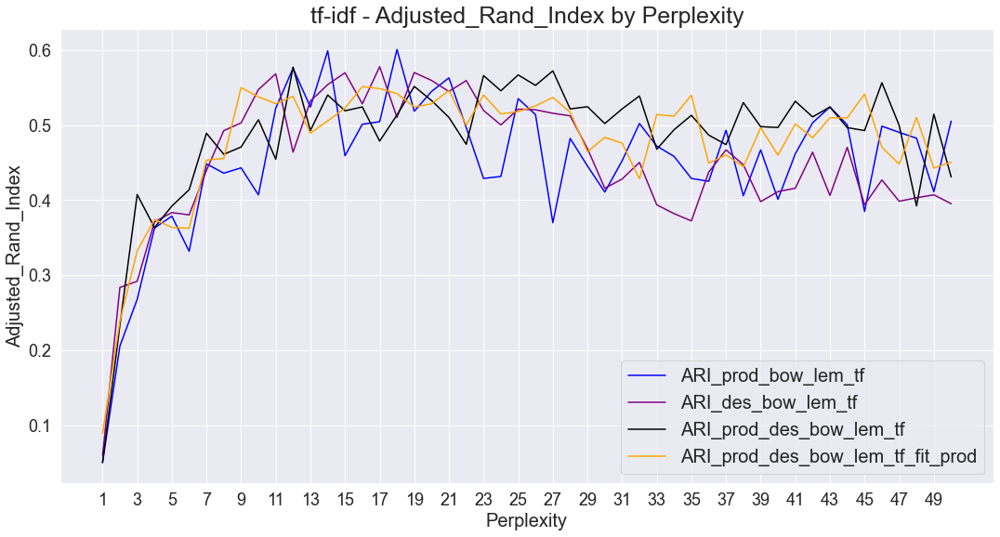

In [170]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y5 = ARI_prod_bow_lem_tf
y6 = ARI_des_bow_lem_tf
y7 = ARI_prod_des_bow_lem_tf
y8 = ARI_prod_des_bow_lem_tf_fit_prod

# Plot the different metrics
ax.plot(x, y5, color = 'blue', label = 'ARI_prod_bow_lem_tf')
ax.plot(x, y6, color = 'purple', label = 'ARI_des_bow_lem_tf')
ax.plot(x, y7, color = 'black', label = 'ARI_prod_des_bow_lem_tf')
ax.plot(x, y8, color = 'orange', label = 'ARI_prod_des_bow_lem_tf_fit_prod')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('tf-idf - Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.6004 time :  6.0


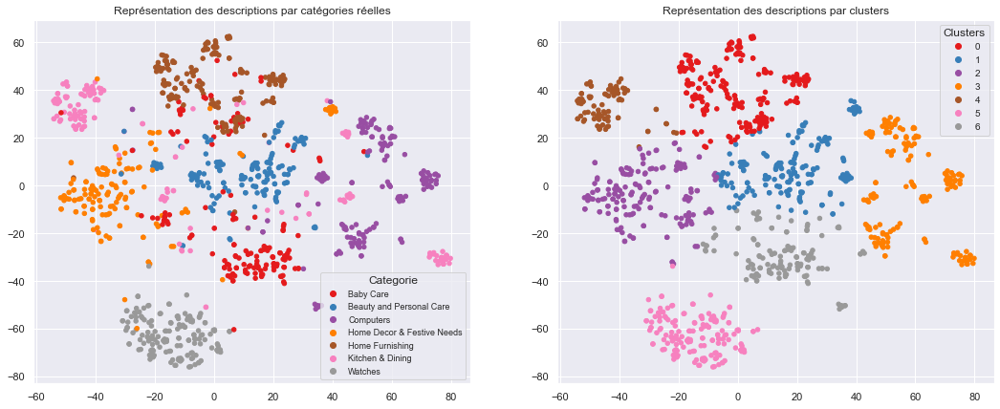

ARI :  0.6004


In [451]:
# DISPLAY BEST RESULTS CLUSTERING for 'product_name_bow_lem' and tf-idf
# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 18 (argmax) for 'product_name_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(ctf_transform, 18)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [452]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    188
1    168
2    169
3    156
4     84
5    155
6    130
Name: first_category, dtype: int64

In [453]:
# View of confusion matrix without cluster_label reattribution
conf_mat = confusion_matrix(true_labels, labels)
print(conf_mat)

[[ 30  10  13   1   1   1  94]
 [  5 120  13   1   1   0  10]
 [  0  15   1 116   2   0  16]
 [  3  12 127   0   4   2   2]
 [146   2   1   0   0   0   1]
 [  4   9  14  38  76   2   7]
 [  0   0   0   0   0 150   0]]


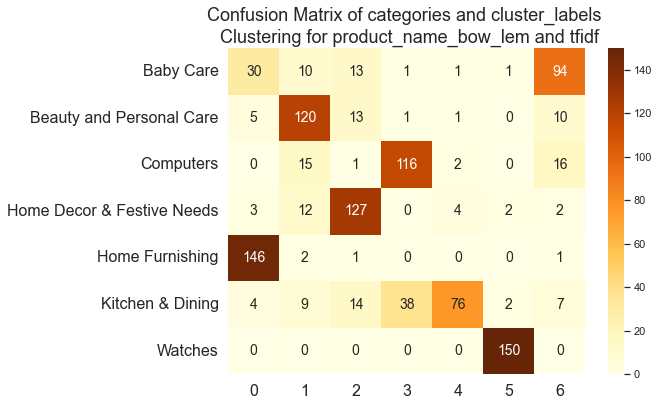

In [454]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for product_name_bow_lem and tfidf',
          size = 18);

In [ ]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true, y_pred) :
    conf_mat = confusion_matrix(y_true, y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
dict_classification = metrics.classification_report(true_labels, labels_transform, 
                                                    digits = 3, output_dict = True)

In [460]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 94  10   1  13  30   1   1]
 [ 10 120   1  13   5   1   0]
 [ 16  15 116   1   0   2   0]
 [  2  12   0 127   3   4   2]
 [  1   2   0   1 146   0   0]
 [  7   9  38  14   4  76   2]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.723     0.627     0.671       150
  Beauty and Personal Care      0.714     0.800     0.755       150
                 Computers      0.744     0.773     0.758       150
Home Decor & Festive Needs      0.751     0.847     0.796       150
           Home Furnishing      0.777     0.973     0.864       150
          Kitchen & Dining      0.905     0.507     0.650       150
                   Watches      0.968     1.000     0.984       150

                  accuracy                          0.790      1050
                 macro avg      0.797     0.790     0.783      1050
              weighted avg      0.797     0.790     0.783      1050



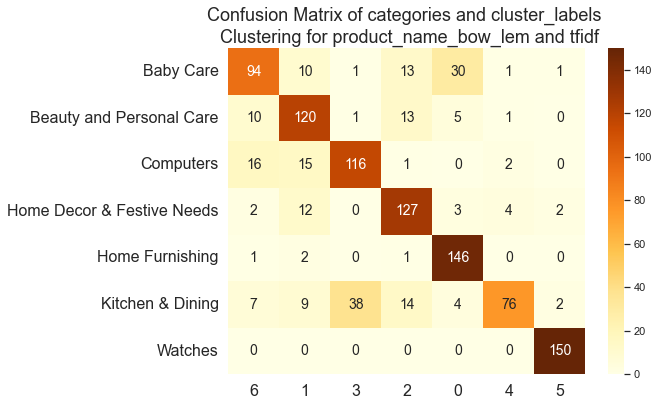

In [458]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = ['6', '1', '3', '2', '0', '4', '5'])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for product_name_bow_lem and tfidf',
          size = 18);

In [461]:
# Create dataframe with categories and metrics
data_metrics_tfidf_prod = pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3]
data_metrics_tfidf_prod

,precision,recall,f1-score
Baby Care,0.723077,0.626667,0.671429
Beauty and Personal Care,0.714286,0.800000,0.754717
Computers,0.743590,0.773333,0.758170
Home Decor & Festive Needs,0.751479,0.846667,0.796238
Home Furnishing,0.776596,0.973333,0.863905
Kitchen & Dining,0.904762,0.506667,0.649573
Watches,0.967742,1.000000,0.983607


In [462]:
# Same dataframe with rounded values
data_metrics_tfidf_prod = round(data_metrics_tfidf_prod, 3)
data_metrics_tfidf_prod

,precision,recall,f1-score
Baby Care,0.723,0.627,0.671
Beauty and Personal Care,0.714,0.800,0.755
Computers,0.744,0.773,0.758
Home Decor & Festive Needs,0.751,0.847,0.796
Home Furnishing,0.777,0.973,0.864
Kitchen & Dining,0.905,0.507,0.650
Watches,0.968,1.000,0.984


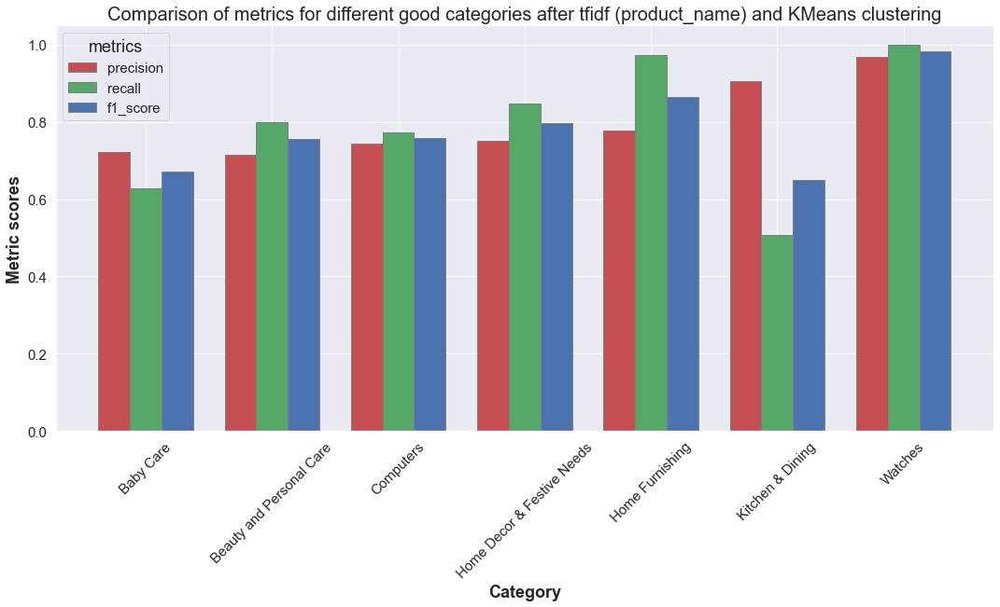

In [463]:
sns.set_theme(context='notebook', style='darkgrid')

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_tfidf_prod['precision'].values
recall = data_metrics_tfidf_prod['recall'].values
f1_score = data_metrics_tfidf_prod['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metric scores', fontweight ='bold', fontsize = 18)
plt.xticks([r + barWidth for r in range(len(precision))],
           list_categories, 
           size = 15,
           rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after tfidf (product_name) and KMeans clustering',
         size = 20)
plt.show()

ARI :  0.5776 time :  5.0


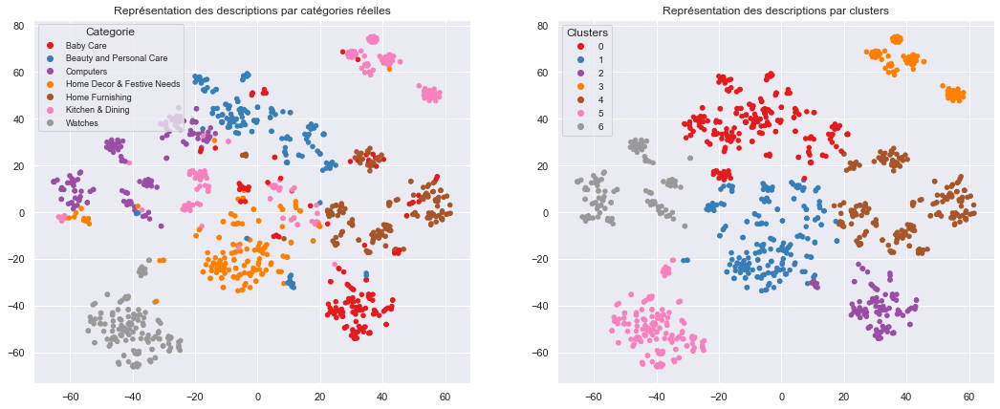

ARI :  0.5776


In [464]:
# DISPLAY BEST RESULTS CLUSTERING for 'description_bow_lem' and tf-idf

# create bag of words (Tf-idf) for 'description_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 17 (argmax) for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(ctf_transform, 17)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [465]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    213
1    195
2    102
3     77
4    191
5    151
6    121
Name: first_category, dtype: int64

In [466]:
# View of confusion matrix without cluster_label reattribution
conf_mat = confusion_matrix(true_labels, labels)
print(conf_mat)

[[ 13  16  92   2  27   0   0]
 [124   4   9   0  11   0   2]
 [ 51   0   0   0   0   0  99]
 [  2 132   0   1   3   1  11]
 [  4   1   0   0 145   0   0]
 [ 19  42   1  74   5   0   9]
 [  0   0   0   0   0 150   0]]


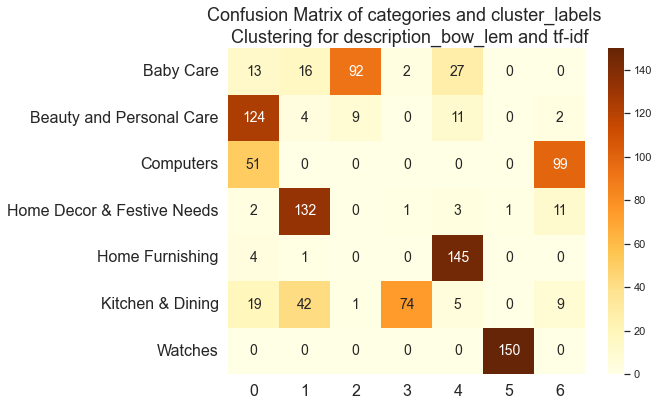

In [467]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_bow_lem and tf-idf',
          size = 18);

In [468]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 92  13   0  16  27   2   0]
 [  9 124   2   4  11   0   0]
 [  0  51  99   0   0   0   0]
 [  0   2  11 132   3   1   1]
 [  0   4   0   1 145   0   0]
 [  1  19   9  42   5  74   0]
 [  0   0   0   0   0   0 150]]

                            precision    recall  f1-score   support

                 Baby Care      0.902     0.613     0.730       150
  Beauty and Personal Care      0.582     0.827     0.683       150
                 Computers      0.818     0.660     0.731       150
Home Decor & Festive Needs      0.677     0.880     0.765       150
           Home Furnishing      0.759     0.967     0.850       150
          Kitchen & Dining      0.961     0.493     0.652       150
                   Watches      0.993     1.000     0.997       150

                  accuracy                          0.777      1050
                 macro avg      0.813     0.777     0.773      1050
              weighted avg      0.813     0.777     0.773      1050



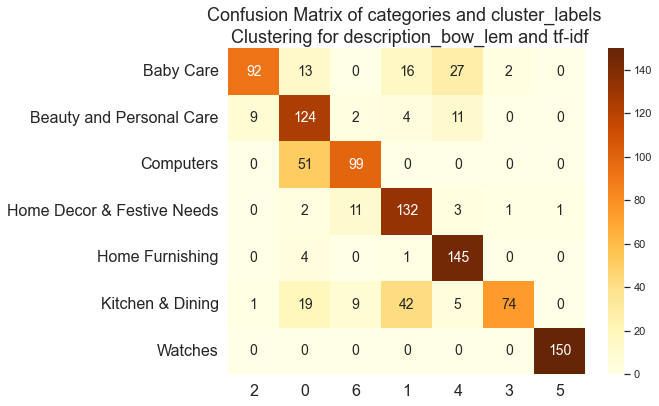

In [469]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = ['2', '0', '6', '1', '4', '3', '5'])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_bow_lem and tf-idf',
          size = 18);

In [470]:
# Create dataframe with categories and metrics
data_metrics_tfidf_des = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 2)
data_metrics_tfidf_des

,precision,recall,f1-score
Baby Care,0.90,0.61,0.73
Beauty and Personal Care,0.58,0.83,0.68
Computers,0.82,0.66,0.73
Home Decor & Festive Needs,0.68,0.88,0.77
Home Furnishing,0.76,0.97,0.85
Kitchen & Dining,0.96,0.49,0.65
Watches,0.99,1.00,1.00


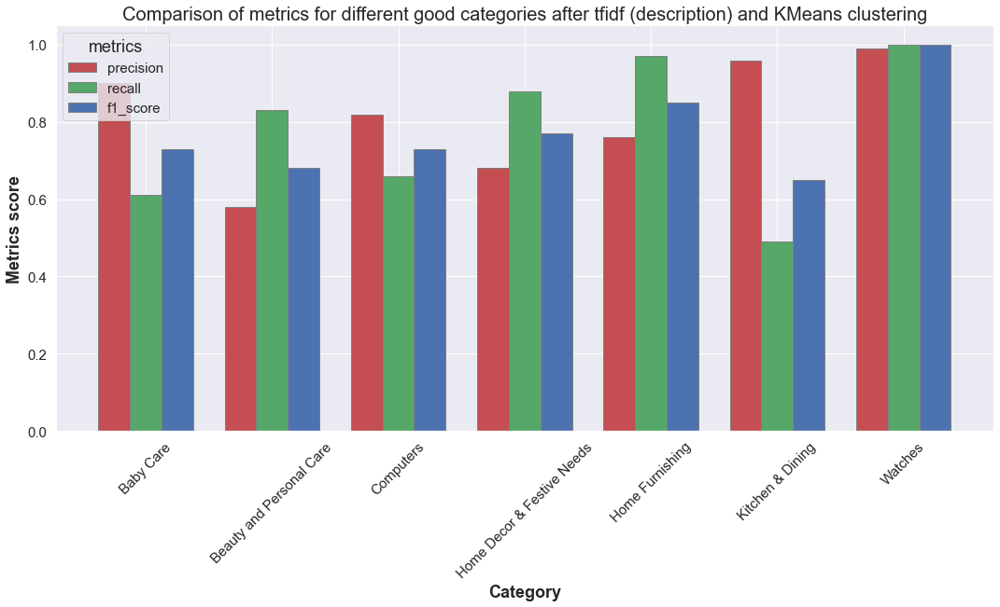

In [471]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_tfidf_des['precision'].values
recall = data_metrics_tfidf_des['recall'].values
f1_score = data_metrics_tfidf_des['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 18)
plt.xticks([r + barWidth for r in range(len(precision))],
           list_categories, 
           size = 15,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after tfidf (description) and KMeans clustering',
         size = 20)

plt.show()

In [174]:
# Create dataframe with results
dict_results = {'perplexity': range(1,51),
                'ARI_des_bow_lem': ARI_des_bow_lem,
                'ARI_prod_bow_lem': ARI_prod_bow_lem,
                'ARI_prod_des_bow_lem': ARI_prod_des_bow_lem,
                "ARI_prod_des_bow_lem_fit_prod": ARI_prod_des_bow_lem_fit_prod,
                'ARI_prod_bow_lem_tf': ARI_prod_bow_lem_tf,
               'ARI_des_bow_lem_tf' : ARI_des_bow_lem_tf,
               'ARI_prod_des_bow_lem_tf' : ARI_prod_des_bow_lem_tf,
               'ARI_prod_des_bow_lem_tf_fit_prod' : ARI_prod_des_bow_lem_tf_fit_prod}
df_results = pd.DataFrame(dict_results)
df_results

,perplexity,ARI_des_bow_lem,ARI_prod_bow_lem,ARI_prod_des_bow_lem,ARI_prod_des_bow_lem_fit_prod,ARI_prod_bow_lem_tf,ARI_des_bow_lem_tf,ARI_prod_des_bow_lem_tf,ARI_prod_des_bow_lem_tf_fit_prod
0,1,0.1313,0.1368,0.0829,0.0960,0.0507,0.0606,0.0512,0.0897
1,2,0.2242,0.2562,0.2077,0.2407,0.2058,0.2838,0.2335,0.2391
2,3,0.2969,0.3250,0.2919,0.2849,0.2681,0.2921,0.4075,0.3326
3,4,0.3524,0.3273,0.3251,0.3355,0.3630,0.3711,0.3635,0.3743
4,5,0.3195,0.3576,0.3304,0.3730,0.3787,0.3835,0.3921,0.3637
5,6,0.3361,0.3759,0.4214,0.3476,0.3320,0.3804,0.4139,0.3627
6,7,0.3563,0.3379,0.4119,0.3658,0.4483,0.4396,0.4890,0.4533
7,8,0.3657,0.3146,0.3569,0.3690,0.4359,0.4925,0.4610,0.4555
8,9,0.3717,0.3765,0.3814,0.4160,0.4430,0.5028,0.4707,0.5497
9,10,0.3333,0.3770,0.4001,0.3975,0.4070,0.5471,0.5070,0.5375


### Tf-idf with 62 clusters (second categories)

In [190]:
# Create labels for first_category
l_cat_2 = list(set(data['second_category']))
print("sous-catégories : ", l_cat_2)
y_cat_num_2 = [(61-l_cat_2.index(data.iloc[i]['second_category'])) for i in range(len(data))]

sous-catégories :  ['Kitchen & Dining >> Dinnerware & Crockery', 'Kitchen & Dining >> Kitchen Tools', "Beauty and Personal Care >> Men's Grooming", 'Beauty and Personal Care >> Health Care', 'Baby Care >> Baby Grooming', 'Kitchen & Dining >> Consumables & Disposables', 'Beauty and Personal Care >> Hair Care', 'Beauty and Personal Care >> Makeup', 'Home Furnishing >> Bath Linen', 'Computers >> Software', 'Computers >> Computer Peripherals', 'Beauty and Personal Care >> Eye Care', 'Home Furnishing >> Cushions, Pillows & Covers', 'Baby Care >> Baby Bath & Skin', 'Kitchen & Dining >> Containers & Bottles', 'Home Furnishing >> JMD Home Furnishing', 'Computers >> Laptops', 'Kitchen & Dining >> Lighting', 'Computers >> Tablet Accessories', 'Home Decor & Festive Needs >> Decorative Lighting & Lamps', 'Baby Care >> Baby & Kids Gifts', 'Baby Care >> Diapering & Potty Training', 'Kitchen & Dining >> Coffee Mugs', 'Computers >> Network Components', 'Kitchen & Dining >> Bar & Glassware', 'Baby Care

In [191]:
y_cat_num_2

[13,
 48,
 48,
 18,
 18,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 0,
 18,
 53,
 22,
 8,
 44,
 46,
 2,
 14,
 2,
 55,
 39,
 39,
 39,
 38,
 39,
 55,
 39,
 43,
 7,
 32,
 32,
 32,
 54,
 24,
 24,
 24,
 24,
 24,
 54,
 6,
 39,
 39,
 19,
 10,
 47,
 47,
 56,
 10,
 47,
 2,
 2,
 2,
 54,
 54,
 0,
 2,
 26,
 33,
 19,
 2,
 27,
 26,
 7,
 52,
 10,
 4,
 4,
 4,
 4,
 4,
 4,
 33,
 33,
 33,
 54,
 54,
 54,
 33,
 33,
 18,
 18,
 18,
 30,
 18,
 18,
 18,
 2,
 42,
 2,
 47,
 57,
 51,
 33,
 2,
 4,
 32,
 49,
 2,
 28,
 26,
 58,
 31,
 31,
 31,
 33,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 39,
 60,
 4,
 4,
 4,
 4,
 60,
 4,
 60,
 4,
 4,
 2,
 4,
 60,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,


In [200]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_2_fct(features, perplexity) :
    time1 = time.time()
    num_labels=len(l_cat_2)
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num_2, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_2_visu_fct(X_tsne, y_cat_num_2, labels, ARI) :
    fig = plt.figure(figsize=(18,7))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_cat_num_2, cmap='hsv')
    plt.title('Représentation des descriptions par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='hsv')
    plt.title('Représentation des descriptions par clusters')
    
    plt.show()
    print("ARI : ", ARI)

ARI :  0.3246 time :  8.0


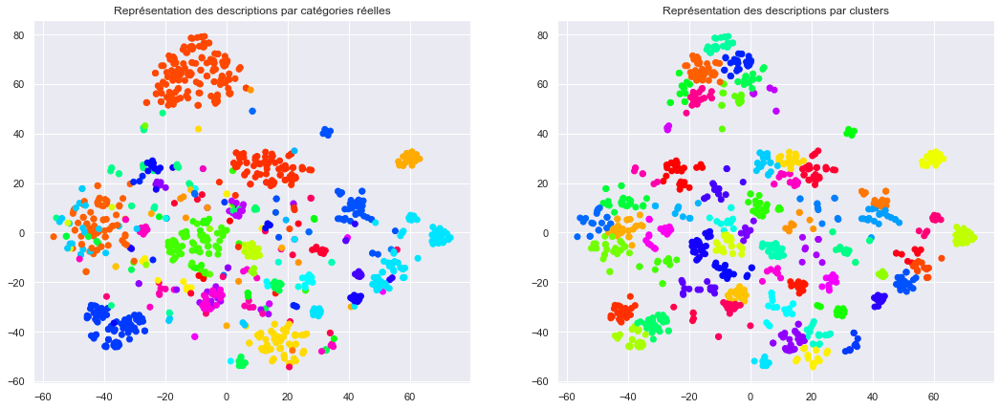

ARI :  0.3246


In [201]:
# DISPLAY BEST RESULTS CLUSTERING

# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 20 for 'product_name_bow_lem' feature
ARI, X_tsne, labels = ARI_2_fct(ctf_transform, 20)

# tSNE vizualisation
TSNE_2_visu_fct(X_tsne, y_cat_num_2, labels, ARI)

ARI :  0.3135 time :  10.0


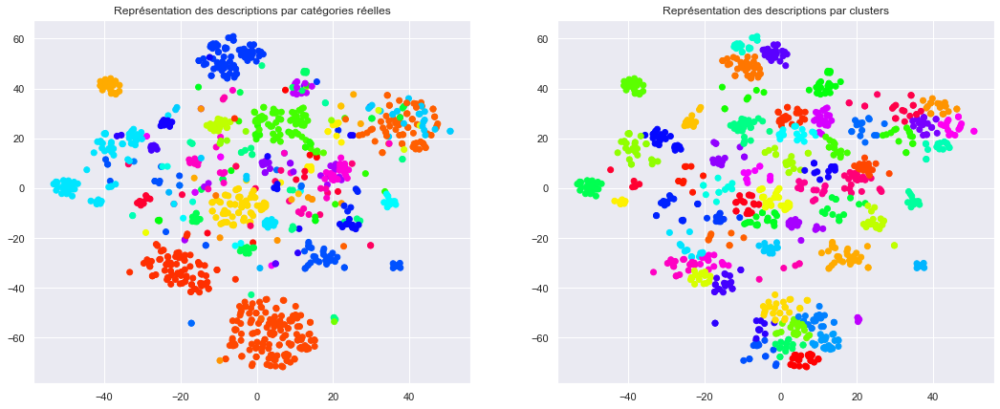

ARI :  0.3135


In [202]:
# DISPLAY BEST RESULTS CLUSTERING

# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 30 for 'product_name_bow_lem' feature
ARI, X_tsne, labels = ARI_2_fct(ctf_transform, 30)

# tSNE vizualisation
TSNE_2_visu_fct(X_tsne, y_cat_num_2, labels, ARI)

ARI :  0.3041 time :  12.0


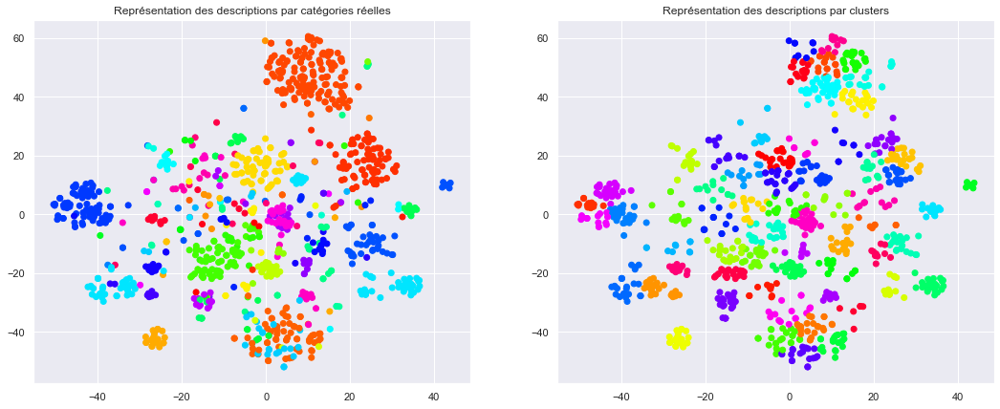

ARI :  0.3041


In [203]:
# DISPLAY BEST RESULTS CLUSTERING

# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 40 for 'product_name_bow_lem' feature
ARI, X_tsne, labels = ARI_2_fct(ctf_transform, 40)

# tSNE vizualisation
TSNE_2_visu_fct(X_tsne, y_cat_num_2, labels, ARI)

ARI :  0.3173 time :  9.0


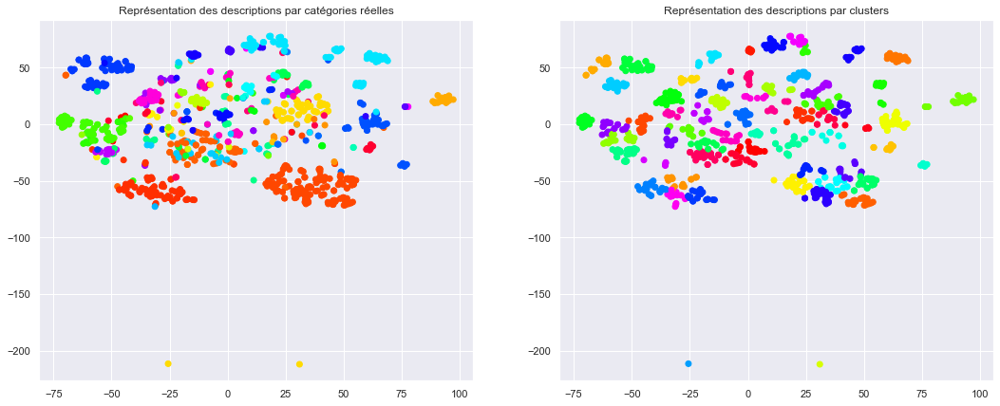

ARI :  0.3173


In [204]:
# DISPLAY BEST RESULTS CLUSTERING

# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'product_name_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

# Execute TfidfVectorizer model with perplexity 10 for 'product_name_bow_lem' feature
ARI, X_tsne, labels = ARI_2_fct(ctf_transform, 10)

# tSNE vizualisation
TSNE_2_visu_fct(X_tsne, y_cat_num_2, labels, ARI)

## Word2Vec

In [126]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

In [278]:
# create bag of words (Tf-idf) for 'product_name_bow_lem' feature 
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', min_df=1)

feat = 'description_bow_lem'
ctf_fit = ctf.fit(data[feat])

ctf_transform = ctf.transform(data[feat])

len(ctf.idf_)

4530

In [310]:
ctf.idf_

array([7.26435019, 7.26435019, 7.26435019, ..., 7.26435019, 7.26435019,
       6.57120301])

In [308]:
data[feat]

0       key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interior curtain made high quality polyester fabric feature eyelet style stitch metal ring make room environmen...
1       specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model asvtwl color red yellow blue size mediam ...
2       key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa export...
3       key feature santosh royal fashion cotton printed king sized double b

## Create Word2Vec model

In [311]:
from nltk.tokenize import sent_tokenize, word_tokenize

data['length_bow_lem'] = data['description_bow_lem'].apply(lambda x : len(word_tokenize(x)))
print("max length bow lem : ", data['length_bow_lem'].max())

max length bow lem :  357


In [312]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 1
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()

In [313]:
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]
descriptions

[['key',
  'feature',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'elegance',
  'polyester',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'pack',
  'price',
  'curtain',
  'enhances',
  'look',
  'interior',
  'curtain',
  'made',
  'high',
  'quality',
  'polyester',
  'fabric',
  'feature',
  'eyelet',
  'style',
  'stitch',
  'metal',
  'ring',
  'make',
  'room',
  'environment',
  'romantic',
  'loving',
  'curtain',
  'ant',
  'wrinkle',
  'anti',
  'shrinkage',
  'elegant',
  'apparance',
  'give',
  'home',
  'bright',
  'modernistic',
  'appeal',
  'design',
  'surreal',
  'attention',
  'sure',
  'steal',
  'heart',
  'contemporary',
  'eyelet',
  'valance',
  'curtain',
  'slide',
  'smoothly',
  'draw',
  'apart',
  'first',
  'thing',
  'morning',
  'welcome',
  'bright',
  'sun',
  'ray',
  'want',
  'wish',
  'good',
  'morning',
  'whole',
  'world',
  'draw',


In [314]:
len(descriptions)

1050

In [315]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4631
Word2Vec trained


In [316]:
w2v_model.corpus_count

1050

In [320]:
w2v_words.sort()
w2v_words

['aaa',
 'aapno',
 'aari',
 'aarika',
 'ability',
 'abkl_pl_pl_pnk',
 'abkl_pl_pnk_pnk',
 'able',
 'abode',
 'abrasion',
 'abroad',
 'absolute',
 'absorbency',
 'absorbent',
 'absorber',
 'absorbing',
 'absorbs',
 'abstract',
 'abstrcts',
 'ac',
 'accent',
 'access',
 'accessory',
 'accident',
 'accidental',
 'accommodate',
 'accomplishes',
 'according',
 'acer',
 'ache',
 'aching',
 'aci',
 'acid',
 'acl',
 'acne',
 'across',
 'acrylic',
 'act',
 'active',
 'actu',
 'actual',
 'actx',
 'acu',
 'ad',
 'adaa',
 'adapter',
 'adaptor',
 'add',
 'added',
 'addiction',
 'adding',
 'addition',
 'additional',
 'additionally',
 'adf',
 'adhesive',
 'adi',
 'adidas',
 'adino',
 'adjust',
 'adjustable',
 'adjusted',
 'adjusts',
 'admiration',
 'admired',
 'adorable',
 'adorn',
 'adorned',
 'adorning',
 'adsl',
 'advance',
 'advice',
 'advisable',
 'aero',
 'affect',
 'affordable',
 'afternoon',
 'agarwood',
 'age',
 'ageless',
 'aging',
 'agrasen',
 'agrees',
 'agromech',
 'aid',
 'aiding',
 'ai

In [295]:
w2v_model.wv.most_similar(positive='chakra', topn=10)

[('vaishnava', 0.8963941335678101),
 ('shankha', 0.8878283500671387),
 ('symbol', 0.8283911943435669),
 ('programmed', 0.7860934138298035),
 ('adi', 0.7795088887214661),
 ('vajrasattva', 0.7760705351829529),
 ('blessing', 0.7746595740318298),
 ('exotic', 0.774527370929718),
 ('buddhist', 0.7677001953125),
 ('rajo', 0.7513959407806396)]

In [299]:
w2v_model.wv.similarity(w1 = 'chakra', w2 = 'chair')

0.23005493

In [307]:
len(w2v_words)

4631

In [300]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [306]:
x_descriptions

array([[  41,   15,  723, ...,    0,    0,    0],
       [  17, 1800,   25, ...,    0,    0,    0],
       [  41,   15, 1113, ...,    0,    0,    0],
       ...,
       [   3, 1794,  702, ...,    0,    0,    0],
       [   3,  541,  343, ...,    0,    0,    0],
       [   3, 1794,  381, ...,    0,    0,    0]])

## Création de la matrice d'embedding

In [301]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4632, 100)


In [302]:
embedding_matrix

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.1023044 ,  1.16206706,  2.16954398, ..., -1.48205447,
        -2.46465015, -1.806952  ],
       [ 0.73047394,  1.07676637,  0.48838535, ..., -0.3852163 ,
        -1.94574058,  0.3763769 ],
       ...,
       [ 0.03444768, -0.11395784,  0.0613764 , ...,  0.26942593,
        -0.36985001, -0.41116583],
       [-0.09285613, -0.02623126,  0.05593501, ...,  0.14067991,
        -0.3879841 , -0.56405026],
       [ 0.02640209, -0.07812899, -0.04028222, ..., -0.03191975,
        -0.06095293,  0.02558666]])

## Création du modèle d'embedding

In [145]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 357)]             0         
                                                                 
 embedding_2 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_2   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


## Exécution du modèle

In [304]:
x_descriptions

array([[  41,   15,  723, ...,    0,    0,    0],
       [  17, 1800,   25, ...,    0,    0,    0],
       [  41,   15, 1113, ...,    0,    0,    0],
       ...,
       [   3, 1794,  702, ...,    0,    0,    0],
       [   3,  541,  343, ...,    0,    0,    0],
       [   3, 1794,  381, ...,    0,    0,    0]])

In [305]:
len(x_descriptions)

1050

In [133]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [303]:
embeddings

array([[ 0.04878572, -0.00682836, -0.01307968, ...,  0.15376589,
        -0.00295593,  0.13830322],
       [ 0.0672124 , -0.07446257, -0.04142456, ...,  0.08192166,
        -0.02918971,  0.00463572],
       [-0.03290069,  0.00267777,  0.00893482, ..., -0.02851054,
        -0.00810812,  0.00899633],
       ...,
       [ 0.01313388, -0.01306975,  0.00315687, ..., -0.02629484,
        -0.07839637, -0.02698735],
       [-0.02409201,  0.01303961,  0.03519523, ..., -0.04252556,
        -0.02828   ,  0.0036956 ],
       [-0.04656087,  0.03339536,  0.03239461, ..., -0.04334607,
        -0.03309367,  0.02105037]], dtype=float32)

In [68]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec.append(ARI)

ARI :  0.0404 time :  5.0
ARI :  0.1485 time :  6.0
ARI :  0.1546 time :  5.0
ARI :  0.2614 time :  5.0
ARI :  0.2185 time :  6.0
ARI :  0.1638 time :  5.0
ARI :  0.2589 time :  5.0
ARI :  0.3496 time :  6.0
ARI :  0.2889 time :  6.0
ARI :  0.3562 time :  5.0
ARI :  0.2892 time :  5.0
ARI :  0.3363 time :  5.0
ARI :  0.3295 time :  5.0
ARI :  0.332 time :  6.0
ARI :  0.3267 time :  5.0
ARI :  0.3218 time :  6.0
ARI :  0.3041 time :  6.0
ARI :  0.3206 time :  5.0
ARI :  0.3284 time :  6.0
ARI :  0.406 time :  6.0
ARI :  0.3258 time :  6.0
ARI :  0.3859 time :  6.0
ARI :  0.3216 time :  7.0
ARI :  0.4086 time :  6.0
ARI :  0.3992 time :  7.0
ARI :  0.3176 time :  6.0
ARI :  0.3511 time :  6.0
ARI :  0.3207 time :  8.0
ARI :  0.3186 time :  7.0
ARI :  0.3764 time :  8.0
ARI :  0.3296 time :  8.0
ARI :  0.3852 time :  8.0
ARI :  0.3403 time :  8.0
ARI :  0.3993 time :  9.0
ARI :  0.3852 time :  9.0
ARI :  0.4059 time :  8.0
ARI :  0.3661 time :  8.0
ARI :  0.4042 time :  8.0
ARI :  0.3285 

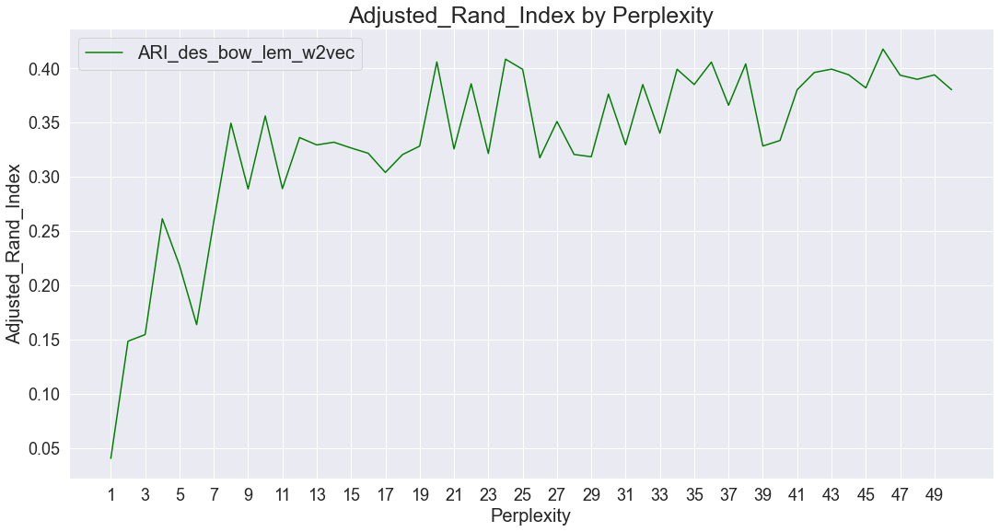

In [78]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4179 time :  8.0


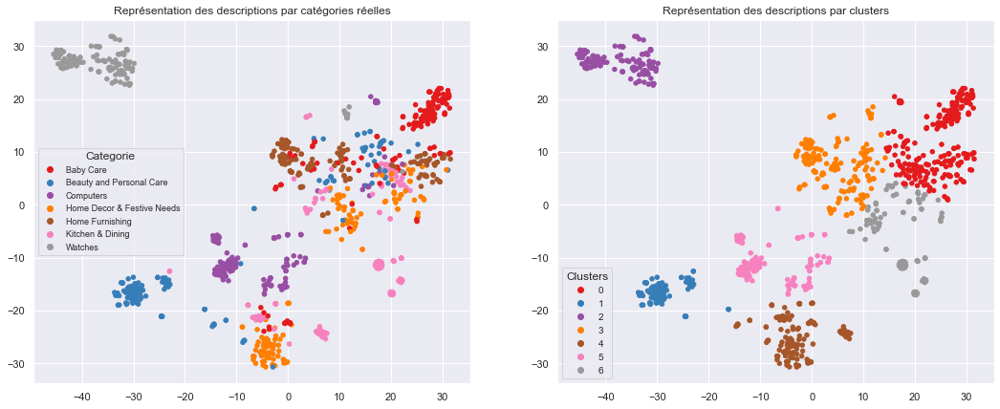

ARI :  0.4179


In [79]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute word2vec model with perplexity 46 for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(embeddings, 46)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [80]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    235
1     91
2    138
3    190
4    152
5    129
6    115
Name: first_category, dtype: int64

In [81]:
# View of confusion matrix without cluster_label reattribution
conf_mat = metrics.confusion_matrix(true_labels, labels)
print(conf_mat)

[[102   0   0  30  14   0   4]
 [ 29  89   0  12  14   3   3]
 [ 16   0   0   1   0 126   7]
 [ 19   0   0  12  76   0  43]
 [ 47   0   0 103   0   0   0]
 [ 21   2   0  21  48   0  58]
 [  1   0 138  11   0   0   0]]


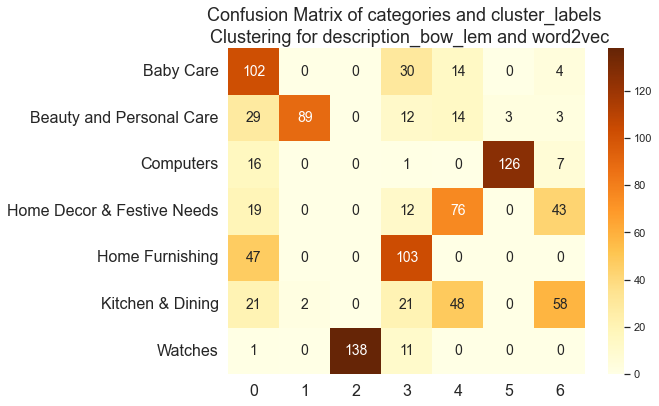

In [82]:
# Confusion Matrix with category names
conf_mat = metrics.confusion_matrix(true_labels, labels)
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_bow_lem and word2vec',
          size = 18);

In [83]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[102   0   0  14  30   4   0]
 [ 29  89   3  14  12   3   0]
 [ 16   0 126   0   1   7   0]
 [ 19   0   0  76  12  43   0]
 [ 47   0   0   0 103   0   0]
 [ 21   2   0  48  21  58   0]
 [  1   0   0   0  11   0 138]]

                            precision    recall  f1-score   support

                 Baby Care      0.434     0.680     0.530       150
  Beauty and Personal Care      0.978     0.593     0.739       150
                 Computers      0.977     0.840     0.903       150
Home Decor & Festive Needs      0.500     0.507     0.503       150
           Home Furnishing      0.542     0.687     0.606       150
          Kitchen & Dining      0.504     0.387     0.438       150
                   Watches      1.000     0.920     0.958       150

                  accuracy                          0.659      1050
                 macro avg      0.705     0.659     0.668      1050
              weighted avg      0.705     0.659     0.668      1050



In [84]:
# Create dataframe with categories and metrics
data_metrics_w2vec = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)
data_metrics_w2vec

,precision,recall,f1-score
Baby Care,0.434,0.680,0.530
Beauty and Personal Care,0.978,0.593,0.739
Computers,0.977,0.840,0.903
Home Decor & Festive Needs,0.500,0.507,0.503
Home Furnishing,0.542,0.687,0.606
Kitchen & Dining,0.504,0.387,0.438
Watches,1.000,0.920,0.958


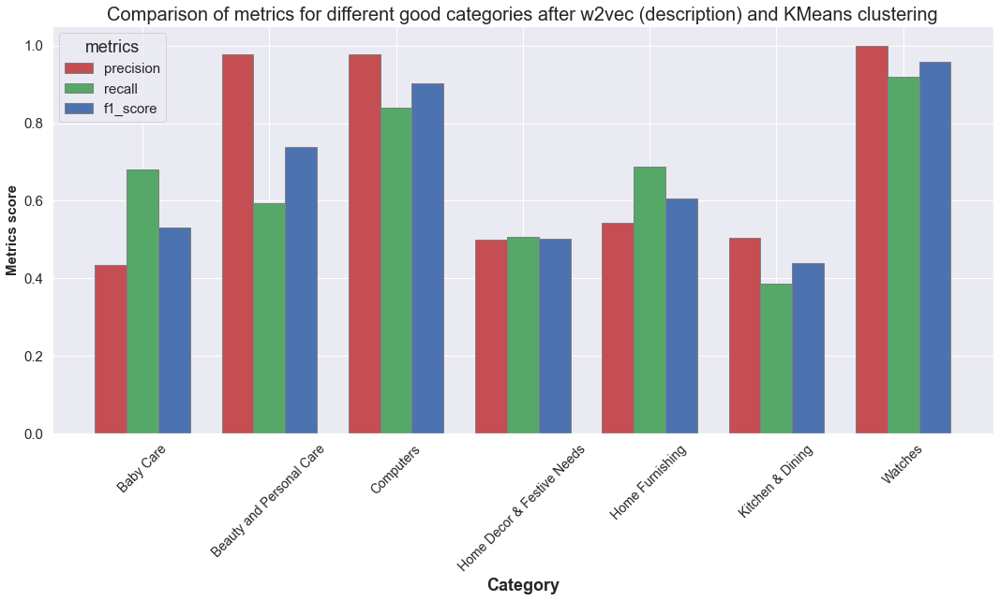

In [85]:
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_w2vec['precision'].values
recall = data_metrics_w2vec['recall'].values
f1_score = data_metrics_w2vec['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(precision))],
           [category for category in list_categories], 
           size = 14,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after w2vec (description) and KMeans clustering',
         size = 20)
plt.show()

## Create Word2Vec model with min_count = 2

In [86]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 2
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [87]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 3271
Word2Vec trained


In [88]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [89]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.7063
Embedding matrix: (4632, 100)


In [90]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 357)]             0         
                                                                 
 embedding_1 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_1   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [91]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [92]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature (min_count = 2)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount2 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount2.append(ARI)

ARI :  0.0554 time :  5.0
ARI :  0.1622 time :  6.0
ARI :  0.1945 time :  5.0
ARI :  0.176 time :  5.0
ARI :  0.2544 time :  6.0
ARI :  0.2612 time :  5.0
ARI :  0.2443 time :  5.0
ARI :  0.2445 time :  5.0
ARI :  0.3087 time :  6.0
ARI :  0.3159 time :  5.0
ARI :  0.3269 time :  5.0
ARI :  0.3353 time :  5.0
ARI :  0.3826 time :  5.0
ARI :  0.4012 time :  5.0
ARI :  0.3376 time :  5.0
ARI :  0.3472 time :  6.0
ARI :  0.3476 time :  5.0
ARI :  0.3296 time :  5.0
ARI :  0.328 time :  6.0
ARI :  0.3122 time :  6.0
ARI :  0.3152 time :  6.0
ARI :  0.3767 time :  6.0
ARI :  0.3706 time :  6.0
ARI :  0.366 time :  6.0
ARI :  0.3762 time :  6.0
ARI :  0.3686 time :  6.0
ARI :  0.3279 time :  6.0
ARI :  0.3353 time :  6.0
ARI :  0.3672 time :  7.0
ARI :  0.3782 time :  7.0
ARI :  0.3945 time :  7.0
ARI :  0.3235 time :  7.0
ARI :  0.3735 time :  7.0
ARI :  0.401 time :  8.0
ARI :  0.3387 time :  8.0
ARI :  0.3319 time :  9.0
ARI :  0.3852 time :  8.0
ARI :  0.3958 time :  9.0
ARI :  0.3821 ti

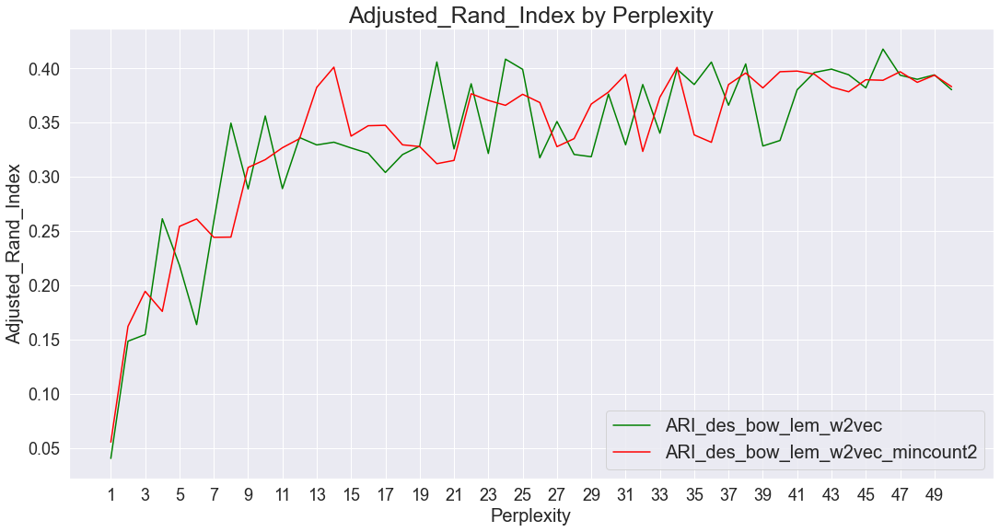

In [93]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y2, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount2')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 3

In [94]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 3
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [95]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 2212
Word2Vec trained


In [96]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [97]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.4777
Embedding matrix: (4632, 100)


In [98]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 357)]             0         
                                                                 
 embedding_2 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_2   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [99]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [100]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature (min_count = 3)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount3 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount3.append(ARI)

ARI :  0.0359 time :  6.0
ARI :  0.1174 time :  5.0
ARI :  0.107 time :  6.0
ARI :  0.2313 time :  6.0
ARI :  0.2314 time :  5.0
ARI :  0.2705 time :  6.0
ARI :  0.244 time :  5.0
ARI :  0.2775 time :  5.0
ARI :  0.3012 time :  5.0
ARI :  0.335 time :  5.0
ARI :  0.3096 time :  5.0
ARI :  0.3401 time :  5.0
ARI :  0.3111 time :  6.0
ARI :  0.3086 time :  5.0
ARI :  0.3232 time :  6.0
ARI :  0.333 time :  6.0
ARI :  0.3209 time :  5.0
ARI :  0.3201 time :  5.0
ARI :  0.3173 time :  5.0
ARI :  0.3885 time :  5.0
ARI :  0.3272 time :  6.0
ARI :  0.4065 time :  6.0
ARI :  0.3677 time :  5.0
ARI :  0.3674 time :  6.0
ARI :  0.3954 time :  6.0
ARI :  0.3205 time :  6.0
ARI :  0.377 time :  6.0
ARI :  0.39 time :  6.0
ARI :  0.3227 time :  6.0
ARI :  0.3863 time :  7.0
ARI :  0.3677 time :  7.0
ARI :  0.3369 time :  7.0
ARI :  0.3958 time :  7.0
ARI :  0.336 time :  7.0
ARI :  0.4027 time :  7.0
ARI :  0.3798 time :  7.0
ARI :  0.3729 time :  8.0
ARI :  0.3877 time :  8.0
ARI :  0.3819 time :

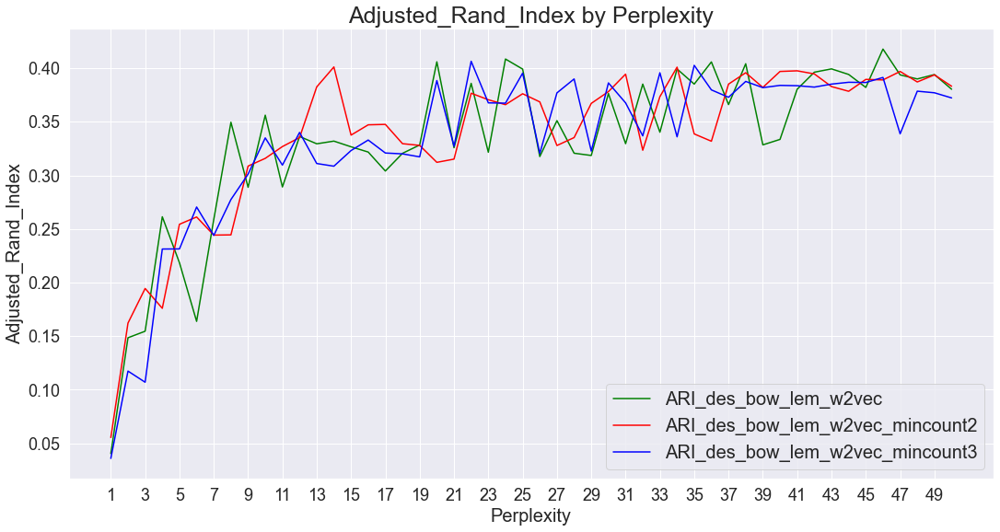

In [102]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y2, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount2')
ax.plot(x, y3, color = 'blue', label = 'ARI_des_bow_lem_w2vec_mincount3')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5

In [83]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [84]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained


In [85]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [86]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)


In [87]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 357)]             0         
                                                                 
 embedding (Embedding)       (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d (G  (None, 100)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [88]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [109]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature (min_count = 5)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5.append(ARI)

ARI :  0.0403 time :  6.0
ARI :  0.1274 time :  6.0
ARI :  0.2126 time :  5.0
ARI :  0.2059 time :  5.0
ARI :  0.2397 time :  5.0
ARI :  0.2244 time :  5.0
ARI :  0.2591 time :  5.0
ARI :  0.2991 time :  5.0
ARI :  0.3055 time :  5.0
ARI :  0.3471 time :  5.0
ARI :  0.3299 time :  5.0
ARI :  0.3196 time :  5.0
ARI :  0.3595 time :  5.0
ARI :  0.3668 time :  5.0
ARI :  0.3903 time :  5.0
ARI :  0.3461 time :  5.0
ARI :  0.3885 time :  6.0
ARI :  0.3551 time :  5.0
ARI :  0.3077 time :  5.0
ARI :  0.4442 time :  5.0
ARI :  0.409 time :  5.0
ARI :  0.3915 time :  5.0
ARI :  0.3996 time :  6.0
ARI :  0.4146 time :  6.0
ARI :  0.3457 time :  6.0
ARI :  0.3463 time :  6.0
ARI :  0.3795 time :  7.0
ARI :  0.3578 time :  7.0
ARI :  0.3883 time :  7.0
ARI :  0.3458 time :  8.0
ARI :  0.3405 time :  7.0
ARI :  0.3465 time :  7.0
ARI :  0.3984 time :  8.0
ARI :  0.353 time :  8.0
ARI :  0.3517 time :  8.0
ARI :  0.3547 time :  9.0
ARI :  0.3441 time :  8.0
ARI :  0.3455 time :  9.0
ARI :  0.382 t

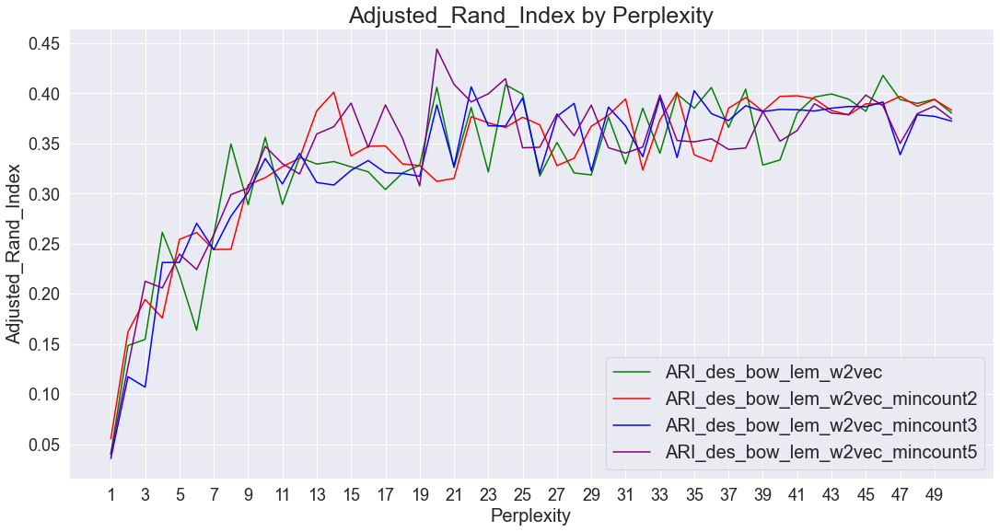

In [110]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y2, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount2')
ax.plot(x, y3, color = 'blue', label = 'ARI_des_bow_lem_w2vec_mincount3')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 10

In [111]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 10
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [112]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 833
Word2Vec trained


In [113]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [114]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.1799
Embedding matrix: (4632, 100)


In [115]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_4 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_4   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [116]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [117]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature (min_count = 10)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount10 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount10.append(ARI)

ARI :  0.0336 time :  5.0
ARI :  0.1368 time :  5.0
ARI :  0.1606 time :  5.0
ARI :  0.1917 time :  5.0
ARI :  0.2814 time :  5.0
ARI :  0.1981 time :  5.0
ARI :  0.2863 time :  5.0
ARI :  0.2149 time :  5.0
ARI :  0.3214 time :  5.0
ARI :  0.2963 time :  5.0
ARI :  0.315 time :  5.0
ARI :  0.3143 time :  5.0
ARI :  0.2915 time :  5.0
ARI :  0.3117 time :  5.0
ARI :  0.3504 time :  5.0
ARI :  0.3264 time :  5.0
ARI :  0.3269 time :  6.0
ARI :  0.3627 time :  5.0
ARI :  0.421 time :  5.0
ARI :  0.3968 time :  6.0
ARI :  0.406 time :  5.0
ARI :  0.336 time :  5.0
ARI :  0.3917 time :  6.0
ARI :  0.3761 time :  5.0
ARI :  0.3884 time :  5.0
ARI :  0.4059 time :  6.0
ARI :  0.3434 time :  6.0
ARI :  0.3847 time :  6.0
ARI :  0.3511 time :  6.0
ARI :  0.3471 time :  7.0
ARI :  0.3653 time :  7.0
ARI :  0.4003 time :  7.0
ARI :  0.3883 time :  7.0
ARI :  0.3913 time :  7.0
ARI :  0.4275 time :  8.0
ARI :  0.3931 time :  8.0
ARI :  0.3982 time :  8.0
ARI :  0.398 time :  8.0
ARI :  0.3996 tim

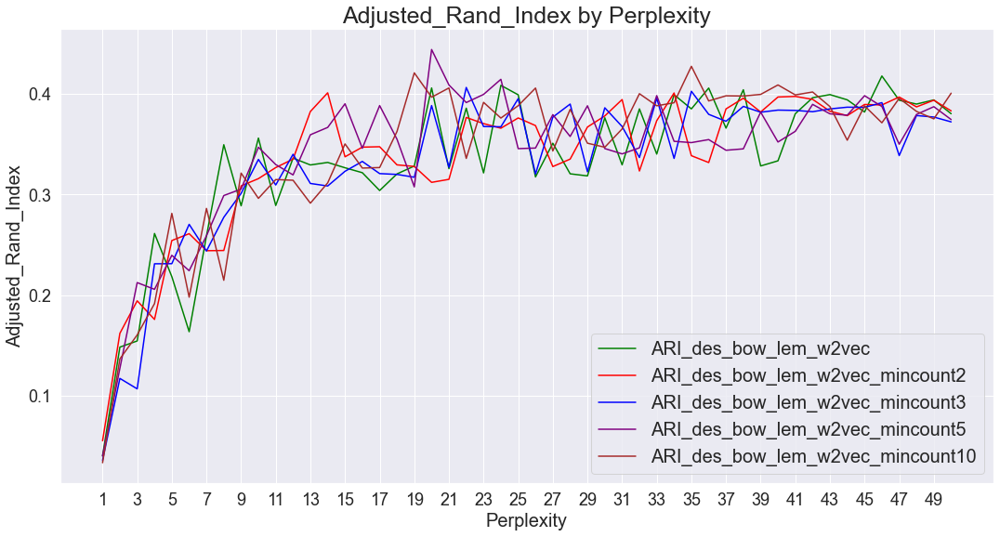

In [118]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y2, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount2')
ax.plot(x, y3, color = 'blue', label = 'ARI_des_bow_lem_w2vec_mincount3')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y5, color = 'brown', label = 'ARI_des_bow_lem_w2vec_mincount10')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5 and window = 2

In [120]:
w2v_size = 100
w2v_window = 2
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [121]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained


In [122]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [123]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)


In [124]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_5 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_5   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [125]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [126]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 10, window = 2)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_2 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_2.append(ARI)

ARI :  0.0376 time :  6.0
ARI :  0.1691 time :  6.0
ARI :  0.2256 time :  5.0
ARI :  0.2484 time :  6.0
ARI :  0.3296 time :  5.0
ARI :  0.3907 time :  5.0
ARI :  0.3464 time :  6.0
ARI :  0.3355 time :  5.0
ARI :  0.3211 time :  6.0
ARI :  0.3433 time :  6.0
ARI :  0.3869 time :  6.0
ARI :  0.3169 time :  5.0
ARI :  0.3259 time :  6.0
ARI :  0.3476 time :  5.0
ARI :  0.3443 time :  5.0
ARI :  0.3298 time :  6.0
ARI :  0.3374 time :  6.0
ARI :  0.3333 time :  5.0
ARI :  0.3984 time :  6.0
ARI :  0.3165 time :  6.0
ARI :  0.345 time :  6.0
ARI :  0.3283 time :  5.0
ARI :  0.3112 time :  5.0
ARI :  0.4013 time :  6.0
ARI :  0.3148 time :  7.0
ARI :  0.3161 time :  7.0
ARI :  0.2985 time :  7.0
ARI :  0.2996 time :  8.0
ARI :  0.3156 time :  7.0
ARI :  0.302 time :  7.0
ARI :  0.3227 time :  8.0
ARI :  0.3189 time :  8.0
ARI :  0.3142 time :  8.0
ARI :  0.314 time :  9.0
ARI :  0.3183 time :  9.0
ARI :  0.3189 time :  9.0
ARI :  0.3203 time :  7.0
ARI :  0.3189 time :  9.0
ARI :  0.3208 t

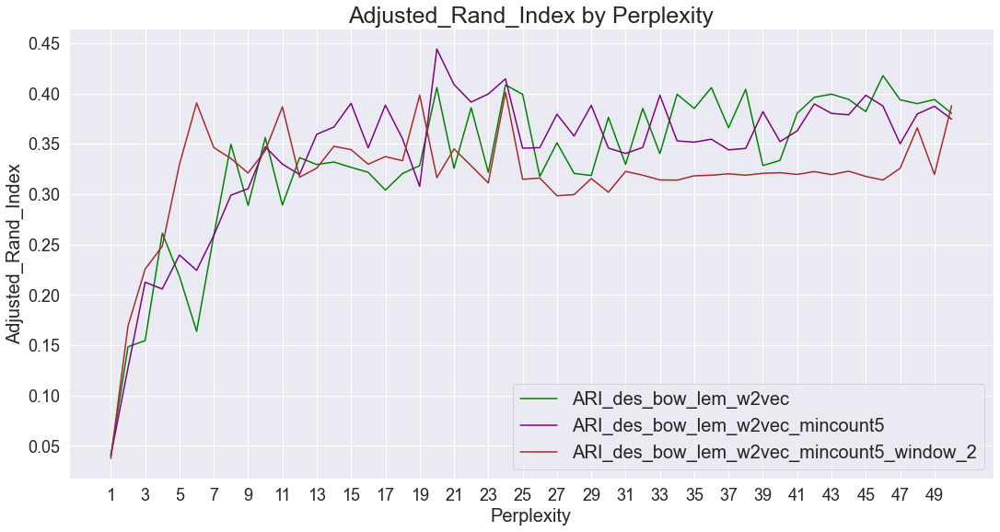

In [127]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y6, color = 'brown', label = 'ARI_des_bow_lem_w2vec_mincount5_window_2')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5 and window = 10

In [128]:
w2v_size = 100
w2v_window = 10
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [129]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained


In [130]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [131]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)


In [132]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_6 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_6   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [133]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [134]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 10)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_10 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_10.append(ARI)

ARI :  0.0605 time :  6.0
ARI :  0.1584 time :  6.0
ARI :  0.1801 time :  5.0
ARI :  0.27 time :  6.0
ARI :  0.2672 time :  6.0
ARI :  0.3133 time :  5.0
ARI :  0.2391 time :  6.0
ARI :  0.2708 time :  5.0
ARI :  0.3191 time :  5.0
ARI :  0.2945 time :  6.0
ARI :  0.3305 time :  6.0
ARI :  0.303 time :  6.0
ARI :  0.3261 time :  6.0
ARI :  0.3161 time :  6.0
ARI :  0.3259 time :  6.0
ARI :  0.3268 time :  6.0
ARI :  0.3296 time :  6.0
ARI :  0.3971 time :  6.0
ARI :  0.3411 time :  6.0
ARI :  0.3905 time :  7.0
ARI :  0.3901 time :  7.0
ARI :  0.3891 time :  7.0
ARI :  0.4123 time :  6.0
ARI :  0.3869 time :  6.0
ARI :  0.3972 time :  6.0
ARI :  0.4026 time :  6.0
ARI :  0.3659 time :  7.0
ARI :  0.4214 time :  7.0
ARI :  0.3604 time :  8.0
ARI :  0.354 time :  8.0
ARI :  0.3447 time :  8.0
ARI :  0.3836 time :  7.0
ARI :  0.3919 time :  8.0
ARI :  0.3968 time :  7.0
ARI :  0.3588 time :  8.0
ARI :  0.3628 time :  7.0
ARI :  0.3668 time :  7.0
ARI :  0.3788 time :  8.0
ARI :  0.3742 ti

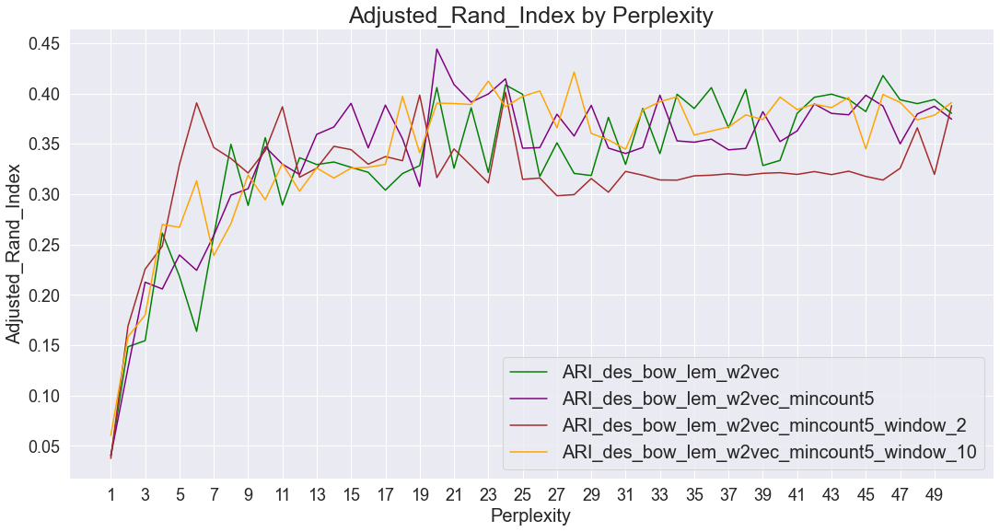

In [135]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y6, color = 'brown', label = 'ARI_des_bow_lem_w2vec_mincount5_window_2')
ax.plot(x, y7, color = 'orange', label = 'ARI_des_bow_lem_w2vec_mincount5_window_10')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5 and window = 20

In [136]:
w2v_size = 100
w2v_window = 20
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [137]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained


In [138]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [139]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)


In [140]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_7 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_7   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [141]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [142]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 20)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_20 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_20.append(ARI)

ARI :  0.0432 time :  6.0
ARI :  0.1213 time :  5.0
ARI :  0.1635 time :  5.0
ARI :  0.1537 time :  6.0
ARI :  0.1995 time :  5.0
ARI :  0.2071 time :  5.0
ARI :  0.2357 time :  5.0
ARI :  0.3185 time :  5.0
ARI :  0.3498 time :  5.0
ARI :  0.2665 time :  5.0
ARI :  0.2565 time :  5.0
ARI :  0.3353 time :  5.0
ARI :  0.3207 time :  5.0
ARI :  0.3204 time :  5.0
ARI :  0.3201 time :  5.0
ARI :  0.3183 time :  5.0
ARI :  0.3562 time :  5.0
ARI :  0.319 time :  5.0
ARI :  0.3566 time :  6.0
ARI :  0.3768 time :  5.0
ARI :  0.3811 time :  5.0
ARI :  0.3819 time :  6.0
ARI :  0.3333 time :  6.0
ARI :  0.3481 time :  5.0
ARI :  0.3731 time :  5.0
ARI :  0.3543 time :  6.0
ARI :  0.3681 time :  7.0
ARI :  0.3693 time :  6.0
ARI :  0.374 time :  7.0
ARI :  0.3741 time :  7.0
ARI :  0.3793 time :  7.0
ARI :  0.3608 time :  7.0
ARI :  0.3537 time :  7.0
ARI :  0.374 time :  7.0
ARI :  0.3668 time :  7.0
ARI :  0.3481 time :  7.0
ARI :  0.3484 time :  7.0
ARI :  0.3556 time :  7.0
ARI :  0.3489 t

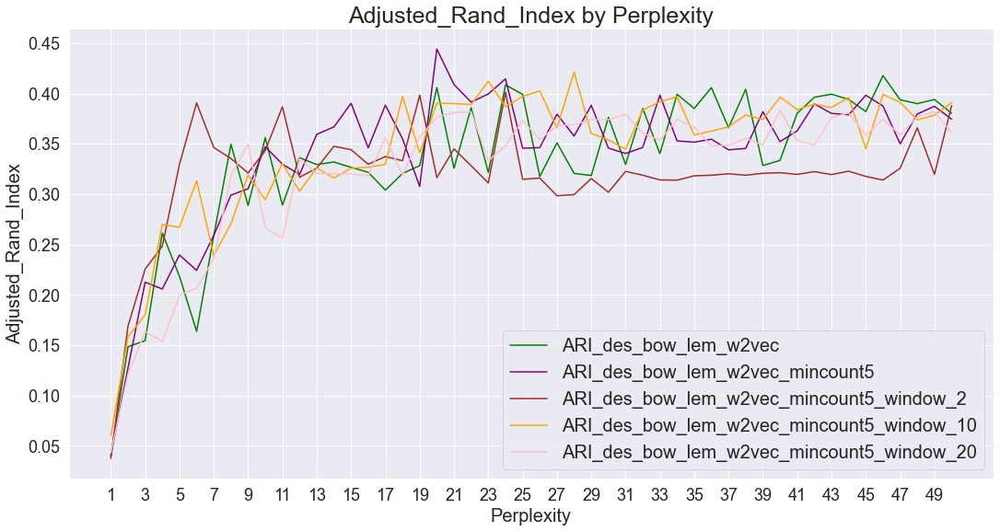

In [143]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y6, color = 'brown', label = 'ARI_des_bow_lem_w2vec_mincount5_window_2')
ax.plot(x, y7, color = 'orange', label = 'ARI_des_bow_lem_w2vec_mincount5_window_10')
ax.plot(x, y8, color = 'pink', label = 'ARI_des_bow_lem_w2vec_mincount5_window_20')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5, window = 5, epochs = 10

In [144]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 10
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

In [145]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained


In [146]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4632


In [147]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)


In [148]:
# Création du modèle

input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_8 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_8   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [149]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

(1050, 100)

In [150]:
# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 10)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10.append(ARI)

ARI :  0.0171 time :  6.0
ARI :  0.0839 time :  6.0
ARI :  0.1849 time :  5.0
ARI :  0.1382 time :  5.0
ARI :  0.1935 time :  5.0
ARI :  0.1917 time :  5.0
ARI :  0.2774 time :  5.0
ARI :  0.2347 time :  5.0
ARI :  0.2805 time :  5.0
ARI :  0.275 time :  5.0
ARI :  0.1944 time :  5.0
ARI :  0.2632 time :  5.0
ARI :  0.2695 time :  5.0
ARI :  0.2673 time :  5.0
ARI :  0.2993 time :  5.0
ARI :  0.309 time :  5.0
ARI :  0.3018 time :  5.0
ARI :  0.2625 time :  5.0
ARI :  0.2979 time :  5.0
ARI :  0.293 time :  5.0
ARI :  0.2898 time :  5.0
ARI :  0.2976 time :  5.0
ARI :  0.2816 time :  5.0
ARI :  0.3111 time :  5.0
ARI :  0.3149 time :  5.0
ARI :  0.3127 time :  6.0
ARI :  0.313 time :  5.0
ARI :  0.312 time :  5.0
ARI :  0.314 time :  6.0
ARI :  0.3145 time :  5.0
ARI :  0.316 time :  6.0
ARI :  0.3176 time :  6.0
ARI :  0.3121 time :  6.0
ARI :  0.3213 time :  6.0
ARI :  0.3173 time :  6.0
ARI :  0.316 time :  6.0
ARI :  0.315 time :  7.0
ARI :  0.3134 time :  7.0
ARI :  0.3223 time : 

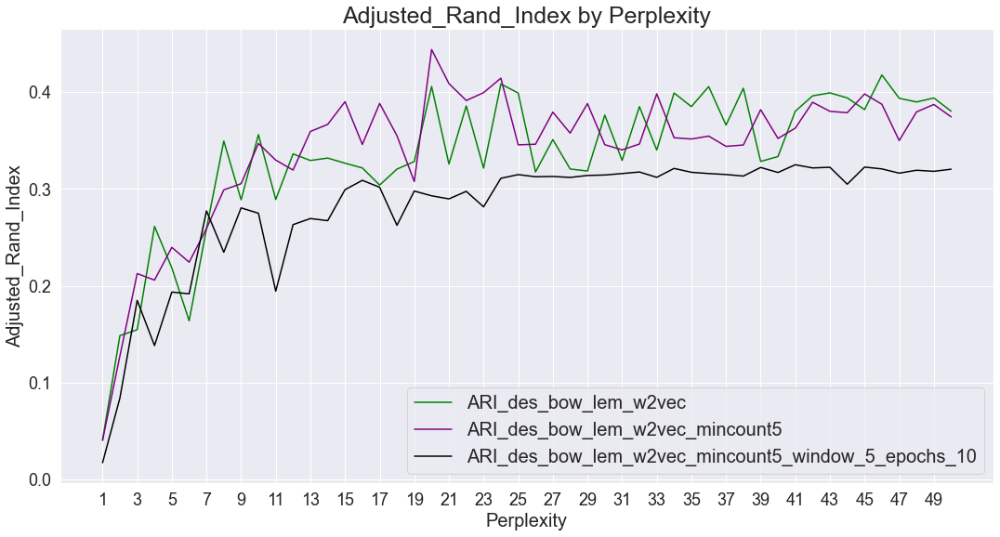

In [151]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10


# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y9, color = 'black', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5, window = 5, epochs = 50

In [152]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 50
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle
input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4632
Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_9 (Embedding)     (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_9   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [153]:
embeddings = embed_model.predict(x_descriptions)

# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 50)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50.append(ARI)

ARI :  0.041 time :  6.0
ARI :  0.1571 time :  5.0
ARI :  0.2446 time :  5.0
ARI :  0.2072 time :  5.0
ARI :  0.2741 time :  5.0
ARI :  0.2897 time :  6.0
ARI :  0.3113 time :  5.0
ARI :  0.3202 time :  5.0
ARI :  0.3365 time :  5.0
ARI :  0.2921 time :  5.0
ARI :  0.3477 time :  5.0
ARI :  0.2631 time :  5.0
ARI :  0.3561 time :  5.0
ARI :  0.3097 time :  5.0
ARI :  0.3302 time :  5.0
ARI :  0.4228 time :  6.0
ARI :  0.3452 time :  5.0
ARI :  0.3138 time :  6.0
ARI :  0.4345 time :  6.0
ARI :  0.3627 time :  7.0
ARI :  0.3809 time :  7.0
ARI :  0.3384 time :  6.0
ARI :  0.3203 time :  6.0
ARI :  0.3787 time :  7.0
ARI :  0.337 time :  7.0
ARI :  0.364 time :  6.0
ARI :  0.3665 time :  7.0
ARI :  0.3378 time :  7.0
ARI :  0.3627 time :  7.0
ARI :  0.371 time :  7.0
ARI :  0.3657 time :  7.0
ARI :  0.3508 time :  7.0
ARI :  0.3439 time :  7.0
ARI :  0.3704 time :  7.0
ARI :  0.366 time :  7.0
ARI :  0.3774 time :  7.0
ARI :  0.3846 time :  7.0
ARI :  0.3815 time :  8.0
ARI :  0.3735 tim

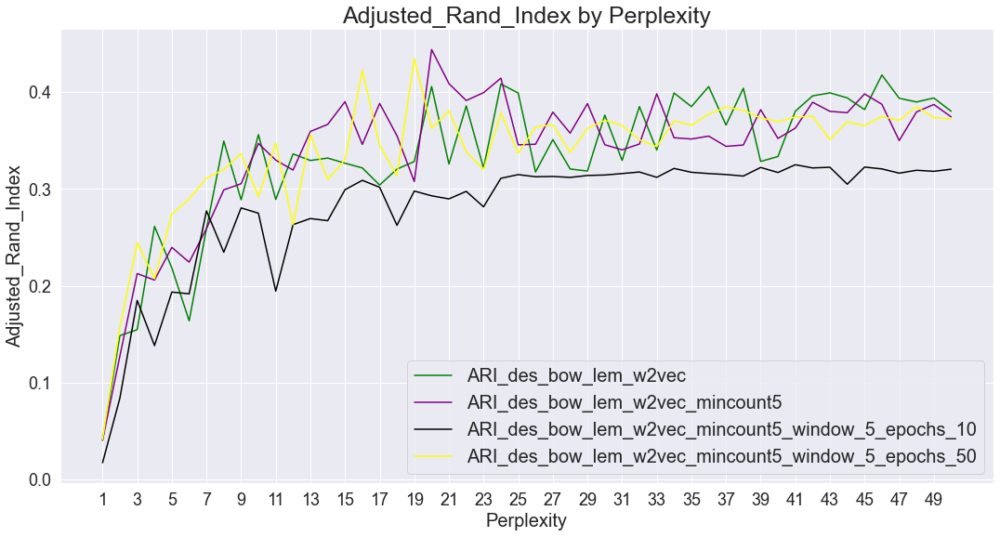

In [154]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10
y10 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50


# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y9, color = 'black', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10')
ax.plot(x, y10, color = 'yellow', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5, window = 5, epochs = 200

In [155]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 200
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle
input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4632
Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)
Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_10 (Embedding)    (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_10  (None, 100)              0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [156]:
embeddings = embed_model.predict(x_descriptions)

# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 200)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200.append(ARI)

ARI :  0.0335 time :  5.0
ARI :  0.2 time :  5.0
ARI :  0.2457 time :  5.0
ARI :  0.2453 time :  5.0
ARI :  0.2474 time :  5.0
ARI :  0.2753 time :  5.0
ARI :  0.2417 time :  5.0
ARI :  0.3142 time :  5.0
ARI :  0.3451 time :  5.0
ARI :  0.3401 time :  5.0
ARI :  0.378 time :  5.0
ARI :  0.3851 time :  5.0
ARI :  0.4015 time :  5.0
ARI :  0.3702 time :  5.0
ARI :  0.4377 time :  5.0
ARI :  0.3669 time :  5.0
ARI :  0.3094 time :  5.0
ARI :  0.3608 time :  5.0
ARI :  0.3651 time :  5.0
ARI :  0.4126 time :  5.0
ARI :  0.3906 time :  5.0
ARI :  0.32 time :  6.0
ARI :  0.3532 time :  6.0
ARI :  0.356 time :  6.0
ARI :  0.3605 time :  5.0
ARI :  0.3537 time :  6.0
ARI :  0.3445 time :  6.0
ARI :  0.3343 time :  6.0
ARI :  0.3691 time :  7.0
ARI :  0.3402 time :  6.0
ARI :  0.3603 time :  6.0
ARI :  0.3838 time :  7.0
ARI :  0.3399 time :  7.0
ARI :  0.3692 time :  7.0
ARI :  0.351 time :  7.0
ARI :  0.3438 time :  7.0
ARI :  0.3989 time :  7.0
ARI :  0.3771 time :  7.0
ARI :  0.3456 time :

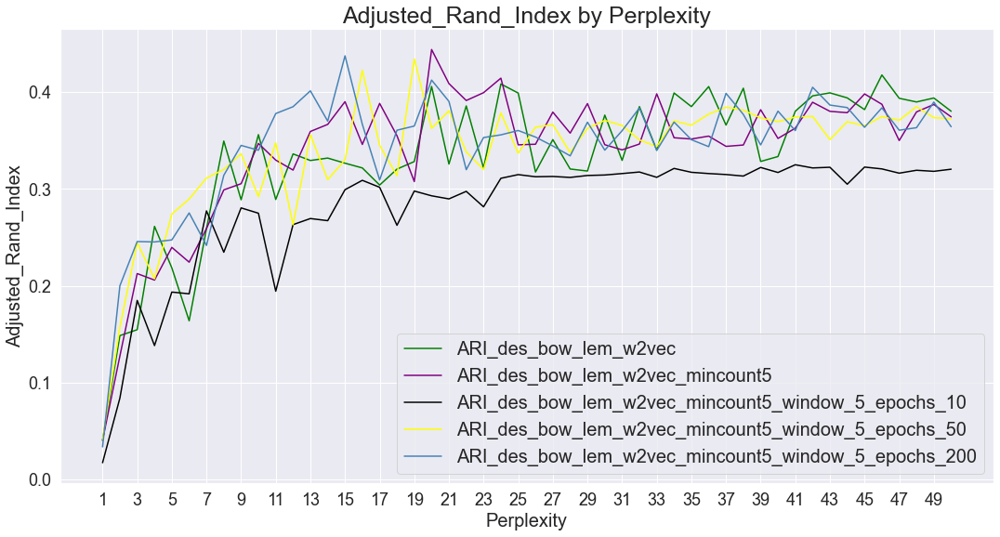

In [158]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10
y10 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50
y11 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200


# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y9, color = 'black', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10')
ax.plot(x, y10, color = 'yellow', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50')
ax.plot(x, y11, color = 'steelblue', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5, window = 5, epochs = 100, vector_size = 10

In [159]:
w2v_size = 10
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle
input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4632
Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 10)
Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_11 (Embedding)    (None, 357, 10)           46320     
                                                                 
 global_average_pooling1d_11  (None, 10)               0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 46,320
Trainable params: 46,320
Non-trainable params: 0
_________________________________________________________________


In [160]:
embeddings = embed_model.predict(x_descriptions)

# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 100, vector_size = 10)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10.append(ARI)

ARI :  0.0288 time :  5.0
ARI :  0.1677 time :  5.0
ARI :  0.2197 time :  5.0
ARI :  0.2553 time :  5.0
ARI :  0.2817 time :  5.0
ARI :  0.3639 time :  5.0
ARI :  0.2759 time :  5.0
ARI :  0.2727 time :  5.0
ARI :  0.3631 time :  5.0
ARI :  0.3386 time :  5.0
ARI :  0.3216 time :  5.0
ARI :  0.3674 time :  6.0
ARI :  0.3929 time :  5.0
ARI :  0.3482 time :  6.0
ARI :  0.3384 time :  6.0
ARI :  0.3135 time :  5.0
ARI :  0.3862 time :  6.0
ARI :  0.3503 time :  6.0
ARI :  0.3772 time :  6.0
ARI :  0.3861 time :  5.0
ARI :  0.4016 time :  5.0
ARI :  0.3802 time :  6.0
ARI :  0.3433 time :  5.0
ARI :  0.3663 time :  6.0
ARI :  0.3645 time :  6.0
ARI :  0.3555 time :  6.0
ARI :  0.3753 time :  6.0
ARI :  0.3743 time :  7.0
ARI :  0.3753 time :  7.0
ARI :  0.3841 time :  7.0
ARI :  0.3804 time :  6.0
ARI :  0.3817 time :  8.0
ARI :  0.3618 time :  7.0
ARI :  0.3613 time :  7.0
ARI :  0.3768 time :  7.0
ARI :  0.3746 time :  8.0
ARI :  0.3624 time :  8.0
ARI :  0.3765 time :  8.0
ARI :  0.362

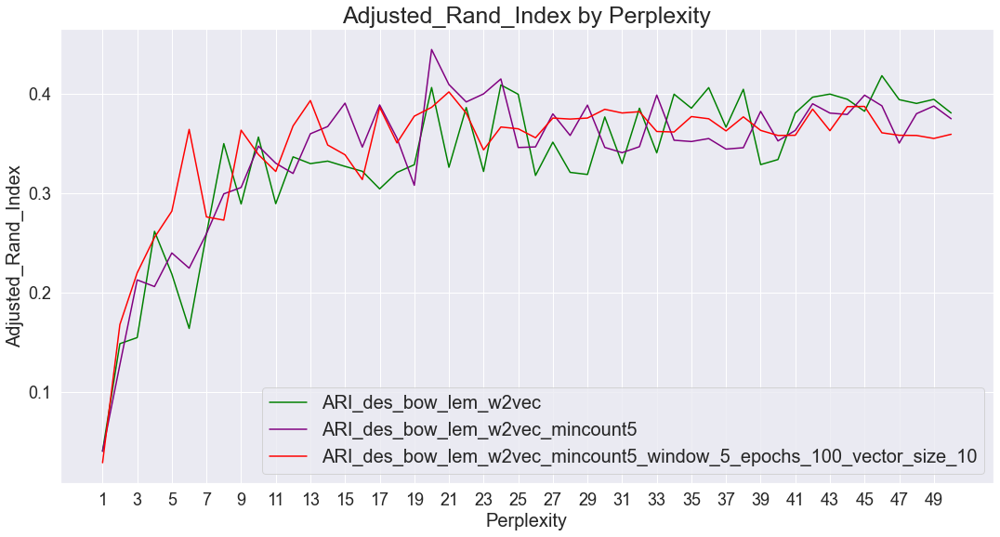

In [163]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10
y10 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50
y11 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200
y12 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10


# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y12, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5, window = 5, epochs = 100, vector_size = 50

In [164]:
w2v_size = 50
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle
input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4632
Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 50)
Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_26 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_12 (Embedding)    (None, 357, 50)           231600    
                                                                 
 global_average_pooling1d_12  (None, 50)               0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 231,600
Trainable params: 231,600
Non-trainable params: 0
_________________________________________________________________


In [165]:
embeddings = embed_model.predict(x_descriptions)

# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 100, vector_size = 50)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50.append(ARI)

ARI :  0.0459 time :  6.0
ARI :  0.128 time :  5.0
ARI :  0.2002 time :  5.0
ARI :  0.2418 time :  5.0
ARI :  0.2663 time :  5.0
ARI :  0.239 time :  5.0
ARI :  0.3071 time :  5.0
ARI :  0.2947 time :  5.0
ARI :  0.321 time :  6.0
ARI :  0.3074 time :  5.0
ARI :  0.3172 time :  6.0
ARI :  0.3398 time :  6.0
ARI :  0.315 time :  6.0
ARI :  0.374 time :  6.0
ARI :  0.3439 time :  6.0
ARI :  0.3585 time :  6.0
ARI :  0.3329 time :  5.0
ARI :  0.3605 time :  6.0
ARI :  0.3514 time :  6.0
ARI :  0.35 time :  6.0
ARI :  0.4292 time :  6.0
ARI :  0.357 time :  6.0
ARI :  0.4125 time :  7.0
ARI :  0.3467 time :  7.0
ARI :  0.3741 time :  6.0
ARI :  0.37 time :  7.0
ARI :  0.3704 time :  7.0
ARI :  0.3649 time :  8.0
ARI :  0.369 time :  8.0
ARI :  0.3623 time :  7.0
ARI :  0.3869 time :  8.0
ARI :  0.3618 time :  6.0
ARI :  0.36 time :  7.0
ARI :  0.3636 time :  7.0
ARI :  0.3771 time :  7.0
ARI :  0.3697 time :  7.0
ARI :  0.363 time :  9.0
ARI :  0.3637 time :  8.0
ARI :  0.3784 time :  7.0


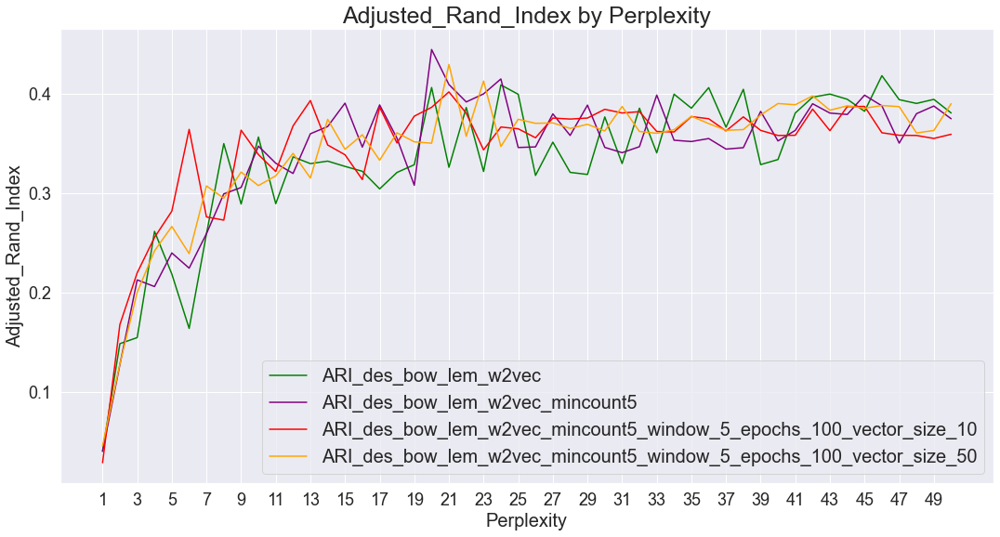

In [166]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10
y10 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50
y11 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200
y12 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10
y13 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y12, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10')
ax.plot(x, y13, color = 'orange', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

## Create Word2Vec model with min_count = 5, window = 5, epochs = 100, vector_size = 500

In [167]:
w2v_size = 500
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle
input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4632
Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 500)
Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_28 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_13 (Embedding)    (None, 357, 500)          2316000   
                                                                 
 global_average_pooling1d_13  (None, 500)              0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 2,316,000
Trainable params: 2,316,000
Non-trainable params: 0
_________________________________________________________________


In [168]:
embeddings = embed_model.predict(x_descriptions)

# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 100, vector_size = 500)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_500 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_500.append(ARI)

ARI :  0.0335 time :  5.0
ARI :  0.1625 time :  5.0
ARI :  0.1575 time :  5.0
ARI :  0.2285 time :  6.0
ARI :  0.2403 time :  7.0
ARI :  0.2538 time :  6.0
ARI :  0.3561 time :  5.0
ARI :  0.3298 time :  5.0
ARI :  0.4105 time :  5.0
ARI :  0.3351 time :  5.0
ARI :  0.3453 time :  5.0
ARI :  0.3438 time :  5.0
ARI :  0.3234 time :  6.0
ARI :  0.3798 time :  5.0
ARI :  0.352 time :  5.0
ARI :  0.3226 time :  5.0
ARI :  0.3303 time :  5.0
ARI :  0.4374 time :  6.0
ARI :  0.4207 time :  5.0
ARI :  0.3133 time :  5.0
ARI :  0.384 time :  7.0
ARI :  0.3143 time :  6.0
ARI :  0.3519 time :  6.0
ARI :  0.3862 time :  6.0
ARI :  0.3912 time :  7.0
ARI :  0.3885 time :  7.0
ARI :  0.348 time :  7.0
ARI :  0.3618 time :  8.0
ARI :  0.3995 time :  7.0
ARI :  0.3577 time :  7.0
ARI :  0.3587 time :  7.0
ARI :  0.3938 time :  7.0
ARI :  0.3824 time :  8.0
ARI :  0.3529 time :  8.0
ARI :  0.3672 time :  8.0
ARI :  0.3781 time :  7.0
ARI :  0.3681 time :  7.0
ARI :  0.3456 time :  8.0
ARI :  0.345 ti

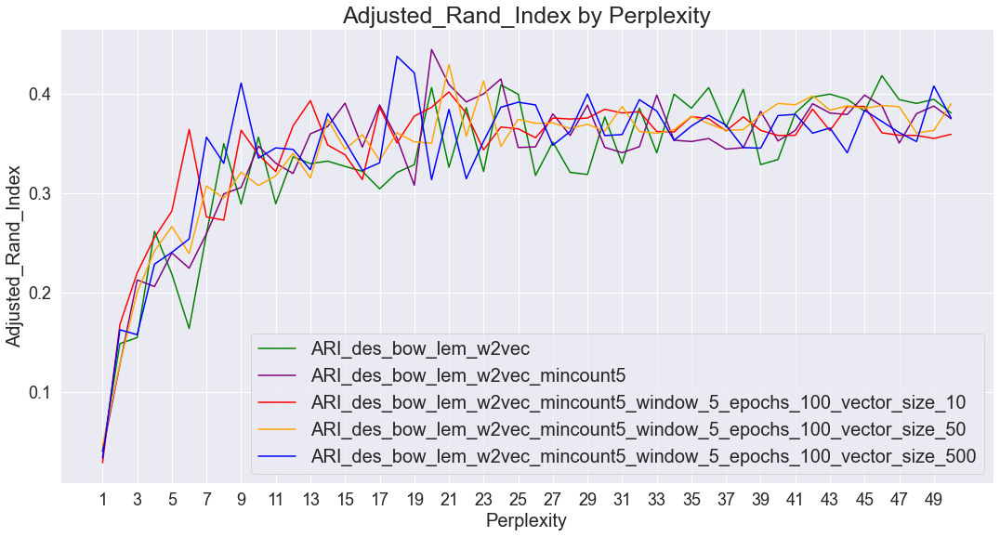

In [169]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10
y10 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50
y11 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200
y12 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10
y13 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50
y14 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_500

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y12, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10')
ax.plot(x, y13, color = 'orange', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50')
ax.plot(x, y14, color = 'blue', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_500')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

In [171]:
help(gensim.models.Word2Vec)

Help on class Word2Vec in module gensim.models.word2vec:

class Word2Vec(gensim.utils.SaveLoad)
 |  Word2Vec(sentences=None, corpus_file=None, vector_size=100, alpha=0.025, window=5, min_count=5, max_vocab_size=None, sample=0.001, seed=1, workers=3, min_alpha=0.0001, sg=0, hs=0, negative=5, ns_exponent=0.75, cbow_mean=1, hashfxn=<built-in function hash>, epochs=5, null_word=0, trim_rule=None, sorted_vocab=1, batch_words=10000, compute_loss=False, callbacks=(), comment=None, max_final_vocab=None, shrink_windows=True)
 |  
 |  Method resolution order:
 |      Word2Vec
 |      gensim.utils.SaveLoad
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, sentences=None, corpus_file=None, vector_size=100, alpha=0.025, window=5, min_count=5, max_vocab_size=None, sample=0.001, seed=1, workers=3, min_alpha=0.0001, sg=0, hs=0, negative=5, ns_exponent=0.75, cbow_mean=1, hashfxn=<built-in function hash>, epochs=5, null_word=0, trim_rule=None, sorted_vocab=1, batch_words=100

In [172]:
w2v_size = 100
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 100
maxlen = 357 # adapt to length of sentences
descriptions = data['description_bow_lem'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   epochs = 10,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

# Préparation des sentences (tokenization)
print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

# Création du modèle
input = Input(shape = (len(x_descriptions),maxlen),dtype = 'float64')
word_input = Input(shape = (maxlen,),dtype = 'float64')  
word_embedding = Embedding(input_dim = vocab_size,
                         output_dim = w2v_size,
                         weights = [embedding_matrix],
                         input_length = maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Build & train Word2Vec model ...
Vocabulary size: 1466
Word2Vec trained
Fit Tokenizer ...
Number of unique words: 4632
Create Embedding matrix ...
Word embedding rate :  0.3166
Embedding matrix: (4632, 100)
Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_30 (InputLayer)       [(None, 357)]             0         
                                                                 
 embedding_14 (Embedding)    (None, 357, 100)          463200    
                                                                 
 global_average_pooling1d_14  (None, 100)              0         
  (GlobalAveragePooling1D)                                       
                                                                 
Total params: 463,200
Trainable params: 463,200
Non-trainable params: 0
_________________________________________________________________


In [173]:
embeddings = embed_model.predict(x_descriptions)

# Execute Word2Vec embedding model with perplexity from 1 to 50 for 'description_bow_lem' feature 
# (min_count = 5, window = 5, epochs = 10 et 100, vector_size = 100)
# fitted on description_bow_lem
ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10_100_vector_size_100 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(embeddings, perplexity)
    ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10_100_vector_size_100.append(ARI)

ARI :  0.0403 time :  5.0
ARI :  0.1274 time :  5.0
ARI :  0.2126 time :  5.0
ARI :  0.2059 time :  5.0
ARI :  0.2397 time :  5.0
ARI :  0.2244 time :  5.0
ARI :  0.2591 time :  5.0
ARI :  0.2991 time :  5.0
ARI :  0.3055 time :  5.0
ARI :  0.3471 time :  5.0
ARI :  0.3299 time :  5.0
ARI :  0.3196 time :  5.0
ARI :  0.3595 time :  5.0
ARI :  0.3668 time :  5.0
ARI :  0.3903 time :  5.0
ARI :  0.3461 time :  5.0
ARI :  0.3885 time :  6.0
ARI :  0.3551 time :  5.0
ARI :  0.3077 time :  6.0
ARI :  0.4442 time :  6.0
ARI :  0.409 time :  6.0
ARI :  0.3915 time :  6.0
ARI :  0.3996 time :  6.0
ARI :  0.4146 time :  6.0
ARI :  0.3457 time :  7.0
ARI :  0.3463 time :  8.0
ARI :  0.3795 time :  8.0
ARI :  0.3578 time :  8.0
ARI :  0.3883 time :  7.0
ARI :  0.3458 time :  8.0
ARI :  0.3405 time :  8.0
ARI :  0.3465 time :  8.0
ARI :  0.3984 time :  8.0
ARI :  0.353 time :  8.0
ARI :  0.3517 time :  8.0
ARI :  0.3547 time :  9.0
ARI :  0.3441 time :  8.0
ARI :  0.3455 time :  9.0
ARI :  0.382 t

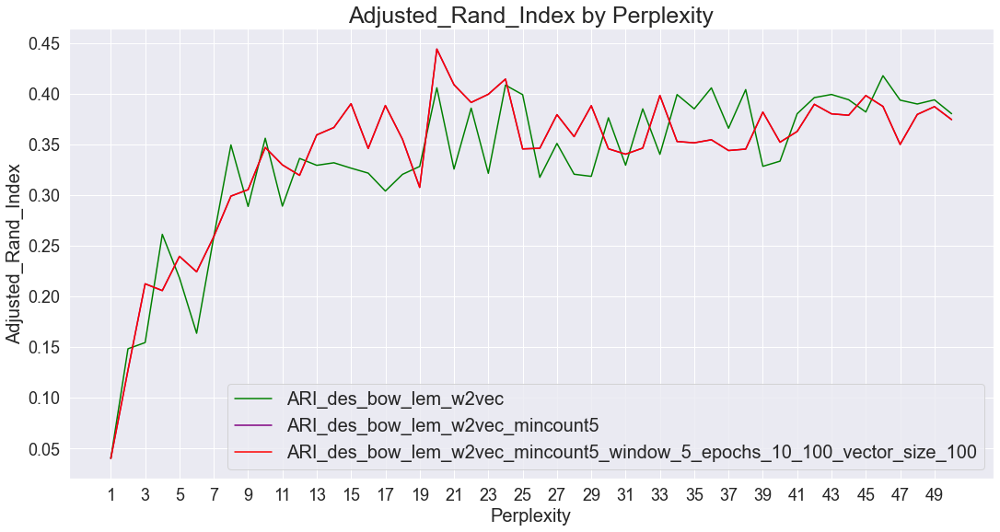

In [174]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_bow_lem_w2vec
y2 = ARI_des_bow_lem_w2vec_mincount2
y3 = ARI_des_bow_lem_w2vec_mincount3
y4 = ARI_des_bow_lem_w2vec_mincount5
y5 = ARI_des_bow_lem_w2vec_mincount10
y6 = ARI_des_bow_lem_w2vec_mincount5_window_2
y7 = ARI_des_bow_lem_w2vec_mincount5_window_10
y8 = ARI_des_bow_lem_w2vec_mincount5_window_20
y9 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10
y10 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_50
y11 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_200
y12 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_10
y13 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_50
y14 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_100_vector_size_500
y15 = ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10_100_vector_size_100

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_bow_lem_w2vec')
ax.plot(x, y4, color = 'purple', label = 'ARI_des_bow_lem_w2vec_mincount5')
ax.plot(x, y15, color = 'red', label = 'ARI_des_bow_lem_w2vec_mincount5_window_5_epochs_10_100_vector_size_100')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4442 time :  6.0


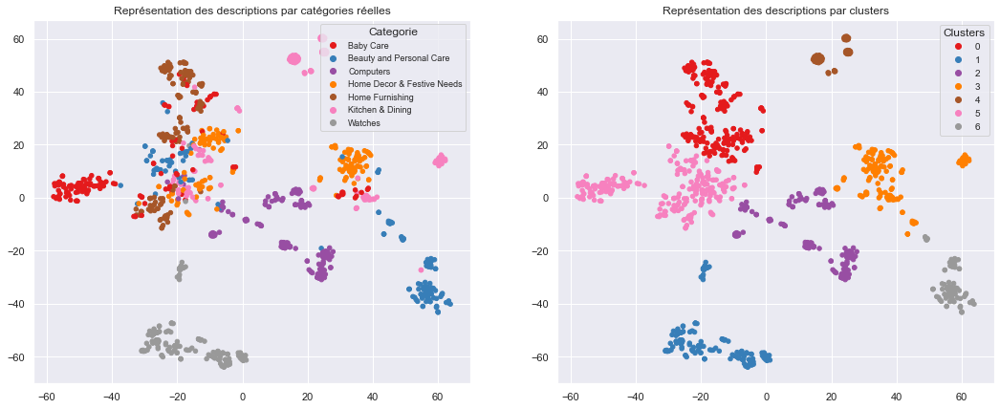

ARI :  0.4442


In [175]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute word2vec model with perplexity 20 for 'description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(embeddings, 20)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [176]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    210
1    148
2    148
3    155
4     52
5    249
6     88
Name: first_category, dtype: int64

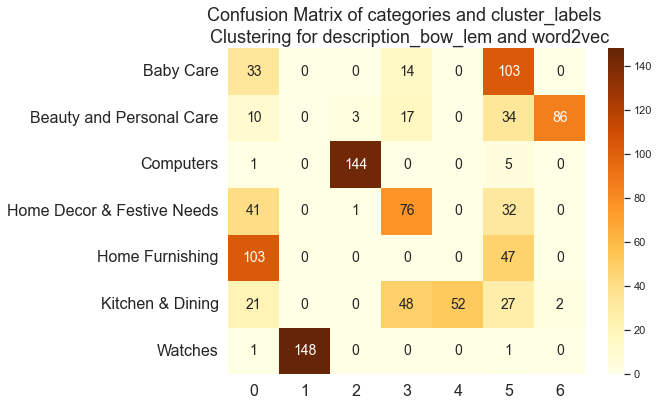

In [177]:
# Confusion Matrix with category names
conf_mat = metrics.confusion_matrix(true_labels, labels)
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_bow_lem and word2vec',
          size = 18);

In [178]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[103   0   0  14  33   0   0]
 [ 34  86   3  17  10   0   0]
 [  5   0 144   0   1   0   0]
 [ 32   0   1  76  41   0   0]
 [ 47   0   0   0 103   0   0]
 [ 27   2   0  48  21  52   0]
 [  1   0   0   0   1   0 148]]

                            precision    recall  f1-score   support

                 Baby Care      0.414     0.687     0.516       150
  Beauty and Personal Care      0.977     0.573     0.723       150
                 Computers      0.973     0.960     0.966       150
Home Decor & Festive Needs      0.490     0.507     0.498       150
           Home Furnishing      0.490     0.687     0.572       150
          Kitchen & Dining      1.000     0.347     0.515       150
                   Watches      1.000     0.987     0.993       150

                  accuracy                          0.678      1050
                 macro avg      0.764     0.678     0.683      1050
              weighted avg      0.764     0.678     0.683      1050



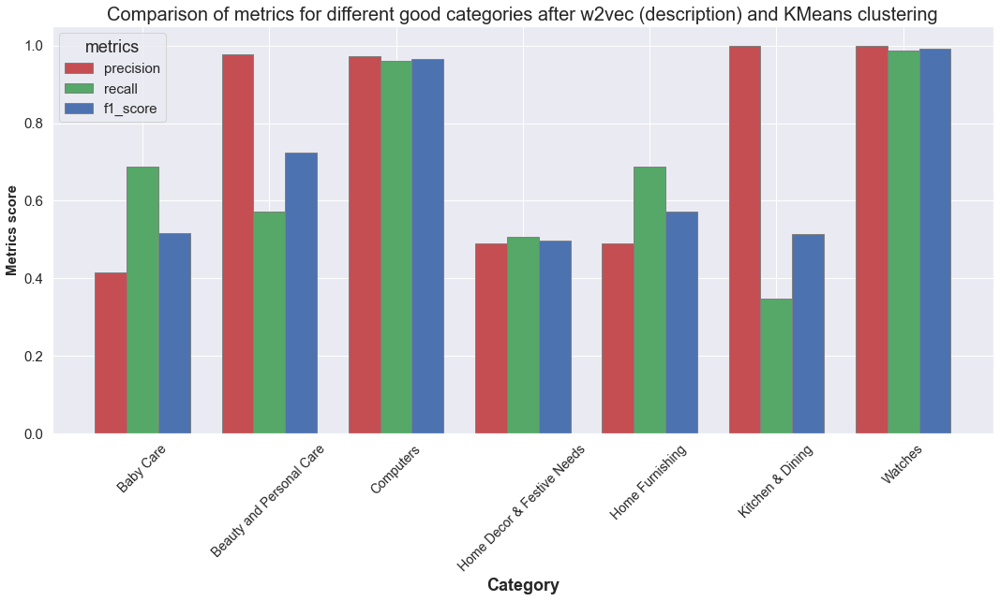

In [179]:
# Create dataframe with categories and metrics
data_metrics_w2vec = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)
data_metrics_w2vec

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_w2vec['precision'].values
recall = data_metrics_w2vec['recall'].values
f1_score = data_metrics_w2vec['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(precision))],
           [category for category in list_categories], 
           size = 14,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after w2vec (description) and KMeans clustering',
         size = 20)
plt.show()

# BERT

In [180]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import TFAutoModel, AutoTokenizer

os.environ["TF_KERAS"]='1'

In [181]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.8.0
2.8.0
Num GPUs Available:  0
True


In [182]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step == 0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

## BERT HuggingFace

In [183]:
data['length_dl'] = data['description_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", data['length_dl'].max())

max length dl :  636


### 'bert-base-uncased'

In [184]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
descriptions = data['description_dl'].to_list()

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [185]:
# Création des features
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions, 
                                                         max_length, batch_size, mode='HF')

temps traitement :  76.0


In [210]:
# Execute bert_uncased embedding model with perplexity from 1 to 50 for 'description_dl' feature
ARI_des_dl_bert_uncased = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity)
    ARI_des_dl_bert_uncased.append(ARI)

ARI :  0.058 time :  5.0
ARI :  0.2107 time :  5.0
ARI :  0.2556 time :  5.0
ARI :  0.315 time :  5.0
ARI :  0.3532 time :  5.0
ARI :  0.3374 time :  6.0
ARI :  0.3314 time :  6.0
ARI :  0.3476 time :  7.0
ARI :  0.2932 time :  6.0
ARI :  0.3347 time :  5.0
ARI :  0.2928 time :  6.0
ARI :  0.3044 time :  6.0
ARI :  0.3036 time :  6.0
ARI :  0.3322 time :  5.0
ARI :  0.3465 time :  6.0
ARI :  0.3976 time :  5.0
ARI :  0.3832 time :  6.0
ARI :  0.3758 time :  6.0
ARI :  0.3994 time :  6.0
ARI :  0.3726 time :  6.0
ARI :  0.3458 time :  7.0
ARI :  0.3498 time :  6.0
ARI :  0.3263 time :  7.0
ARI :  0.3216 time :  7.0
ARI :  0.3305 time :  7.0
ARI :  0.3225 time :  6.0
ARI :  0.3246 time :  6.0
ARI :  0.3202 time :  6.0
ARI :  0.3218 time :  6.0
ARI :  0.3178 time :  6.0
ARI :  0.3217 time :  7.0
ARI :  0.3226 time :  7.0
ARI :  0.3261 time :  7.0
ARI :  0.3232 time :  7.0
ARI :  0.3271 time :  8.0
ARI :  0.321 time :  7.0
ARI :  0.3184 time :  8.0
ARI :  0.3225 time :  7.0
ARI :  0.3249 t

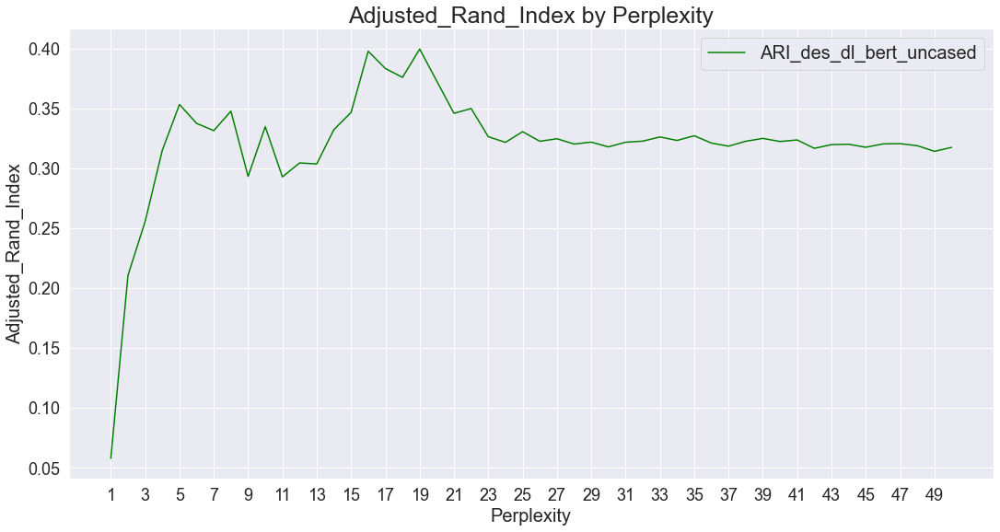

In [211]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_dl_bert_uncased

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_dl_bert_uncased')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.3994 time :  6.0


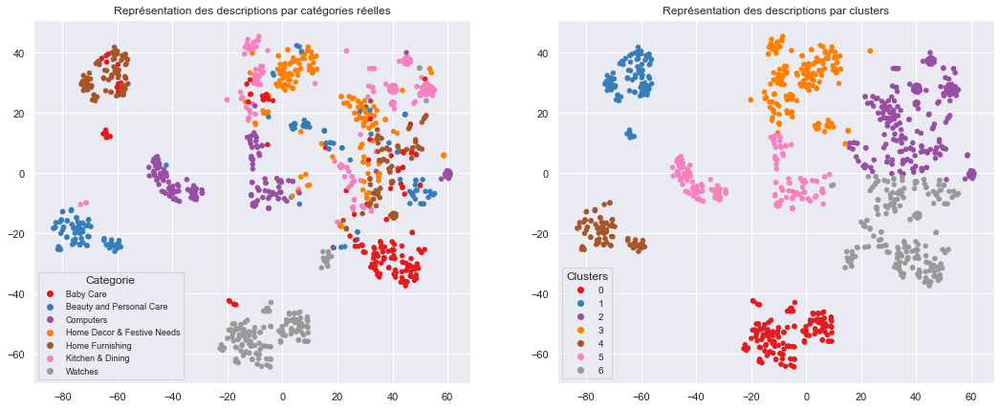

ARI :  0.3994


In [488]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute bert_uncased model with perplexity 19 for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_bert, 19)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [489]:
# View of confusion matrix without cluster_label reattribution
conf_mat = metrics.confusion_matrix(true_labels, labels)
print(conf_mat)

[[  5  20  13  13   0   1  98]
 [  0   0  17  24  79   3  27]
 [  0   0  13   2   0 135   0]
 [  0   0  56  77   0   4  13]
 [  0  74  46   0   0   0  30]
 [  0   0  75  52   3   1  19]
 [135   0   3   0   0   0  12]]


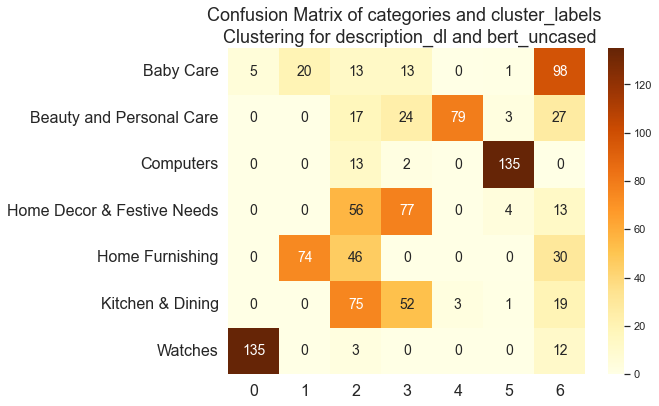

In [490]:
# Confusion Matrix with category names
conf_mat = metrics.confusion_matrix(true_labels, labels)
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_dl and bert_uncased',
          size = 18);

In [491]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 98   0   1  13  20  13   5]
 [ 27  79   3  24   0  17   0]
 [  0   0 135   2   0  13   0]
 [ 13   0   4  77   0  56   0]
 [ 30   0   0   0  74  46   0]
 [ 19   3   1  52   0  75   0]
 [ 12   0   0   0   0   3 135]]

                            precision    recall  f1-score   support

                 Baby Care      0.492     0.653     0.562       150
  Beauty and Personal Care      0.963     0.527     0.681       150
                 Computers      0.938     0.900     0.918       150
Home Decor & Festive Needs      0.458     0.513     0.484       150
           Home Furnishing      0.787     0.493     0.607       150
          Kitchen & Dining      0.336     0.500     0.402       150
                   Watches      0.964     0.900     0.931       150

                  accuracy                          0.641      1050
                 macro avg      0.706     0.641     0.655      1050
              weighted avg      0.706     0.641     0.655      1050



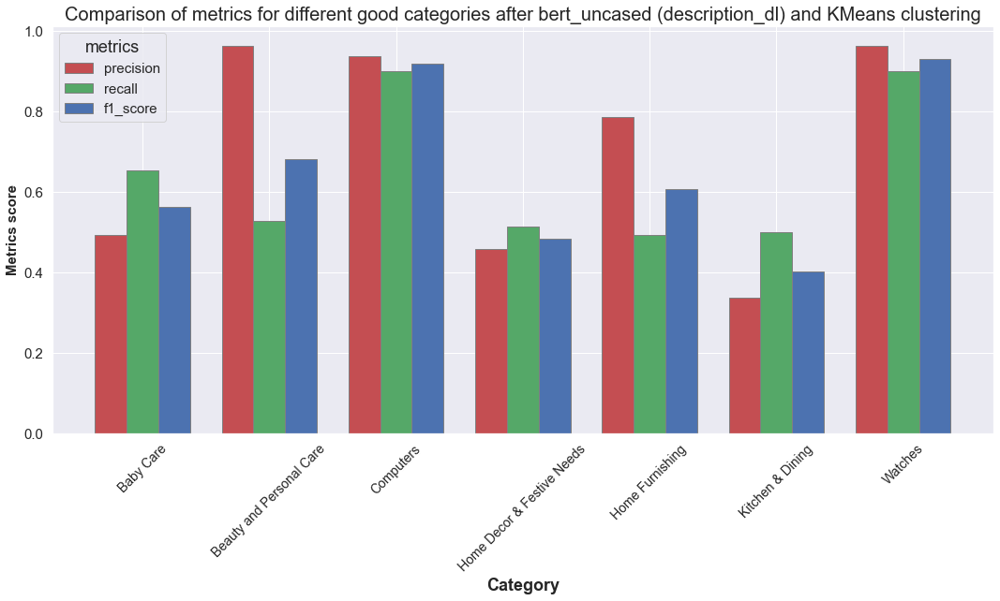

In [492]:
# Create dataframe with categories and metrics
data_metrics_w2vec = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_w2vec['precision'].values
recall = data_metrics_w2vec['recall'].values
f1_score = data_metrics_w2vec['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(precision))],
           [category for category in list_categories], 
           size = 14,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after bert_uncased (description_dl) and KMeans clustering',
         size = 20)
plt.show()

### 'bert-large-uncased'

In [186]:
max_length = 64
batch_size = 10
model_type = 'bert-large-uncased'
model = TFAutoModel.from_pretrained(model_type)
descriptions = data['description_dl'].to_list()

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Some layers from the model checkpoint at bert-large-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-large-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [187]:
# Création des features
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions, 
                                                         max_length, batch_size, mode='HF')

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

temps traitement :  226.0


In [188]:
# Execute bert_large_uncased embedding model with perplexity from 1 to 50 for 'description_dl' feature
ARI_des_dl_bert_large_uncased = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity)
    ARI_des_dl_bert_large_uncased.append(ARI)

ARI :  0.0792 time :  5.0
ARI :  0.1955 time :  5.0
ARI :  0.2022 time :  6.0
ARI :  0.316 time :  6.0
ARI :  0.3471 time :  6.0
ARI :  0.3327 time :  6.0
ARI :  0.356 time :  5.0
ARI :  0.3346 time :  5.0
ARI :  0.3309 time :  6.0
ARI :  0.3274 time :  5.0
ARI :  0.3409 time :  5.0
ARI :  0.3339 time :  5.0
ARI :  0.3371 time :  5.0
ARI :  0.3345 time :  5.0
ARI :  0.3457 time :  6.0
ARI :  0.3509 time :  6.0
ARI :  0.3321 time :  6.0
ARI :  0.3354 time :  6.0
ARI :  0.3344 time :  5.0
ARI :  0.3327 time :  5.0
ARI :  0.335 time :  6.0
ARI :  0.3285 time :  6.0
ARI :  0.3279 time :  6.0
ARI :  0.3354 time :  5.0
ARI :  0.3188 time :  6.0
ARI :  0.3169 time :  6.0
ARI :  0.3297 time :  6.0
ARI :  0.345 time :  6.0
ARI :  0.3168 time :  6.0
ARI :  0.3209 time :  7.0
ARI :  0.3225 time :  7.0
ARI :  0.328 time :  7.0
ARI :  0.3329 time :  7.0
ARI :  0.3253 time :  7.0
ARI :  0.3272 time :  9.0
ARI :  0.3232 time :  9.0
ARI :  0.3275 time :  9.0
ARI :  0.3355 time :  8.0
ARI :  0.3237 tim

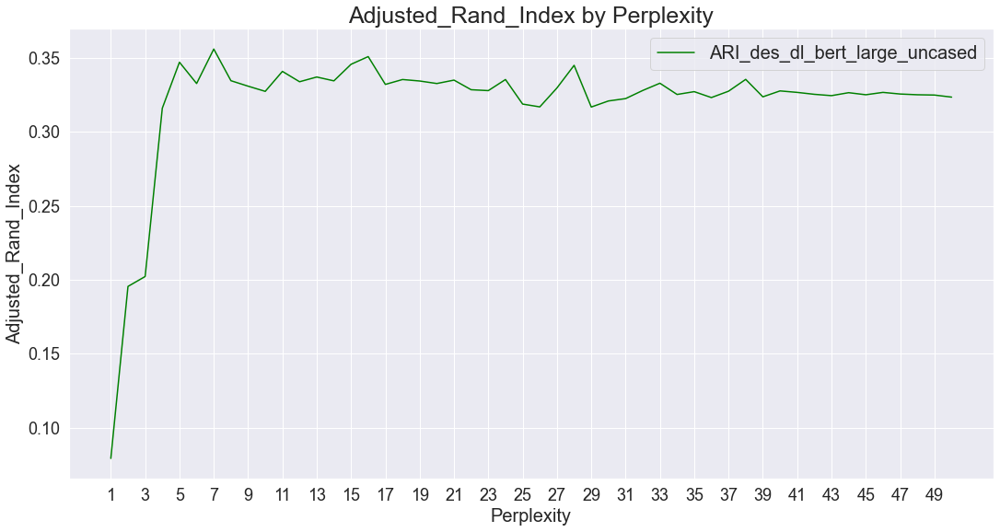

In [190]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y2 = ARI_des_dl_bert_large_uncased

# Plot the different metrics
ax.plot(x, y2, color = 'green', label = 'ARI_des_dl_bert_large_uncased')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

### 'cardiffnlp/twitter-roberta-base-sentiment'
* Modèle pré-entraîné sur des tweets pour l'analyse de sentiment

In [529]:
max_length = 64
batch_size = 10
model_type = 'cardiffnlp/twitter-roberta-base-sentiment'
model = TFAutoModel.from_pretrained(model_type)
descriptions = data['description_dl'].to_list()

Some layers from the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment were not used when initializing TFRobertaModel: ['classifier']
- This IS expected if you are initializing TFRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFRobertaModel were initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFRobertaModel for predictions without further training.


In [530]:
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions, 
                                                         max_length, batch_size, mode='HF')

temps traitement :  83.0


In [495]:
# Execute bert_roberta_based_sentiments embedding model with perplexity from 1 to 50 for 'description_dl' feature
ARI_des_dl_bert_roberta = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity)
    ARI_des_dl_bert_roberta.append(ARI)

ARI :  0.0478 time :  5.0
ARI :  0.1384 time :  6.0
ARI :  0.1776 time :  5.0
ARI :  0.2097 time :  6.0
ARI :  0.1905 time :  5.0
ARI :  0.2054 time :  5.0
ARI :  0.141 time :  5.0
ARI :  0.1556 time :  6.0
ARI :  0.2157 time :  5.0
ARI :  0.1478 time :  6.0
ARI :  0.2082 time :  6.0
ARI :  0.1501 time :  5.0
ARI :  0.1464 time :  6.0
ARI :  0.189 time :  6.0
ARI :  0.1494 time :  5.0
ARI :  0.2219 time :  6.0
ARI :  0.2228 time :  6.0
ARI :  0.2218 time :  7.0
ARI :  0.227 time :  6.0
ARI :  0.2215 time :  6.0
ARI :  0.2214 time :  6.0
ARI :  0.2259 time :  6.0
ARI :  0.221 time :  6.0
ARI :  0.2258 time :  7.0
ARI :  0.224 time :  6.0
ARI :  0.2217 time :  7.0
ARI :  0.2249 time :  7.0
ARI :  0.2214 time :  7.0
ARI :  0.2254 time :  7.0
ARI :  0.2191 time :  6.0
ARI :  0.2203 time :  6.0
ARI :  0.2192 time :  7.0
ARI :  0.2208 time :  7.0
ARI :  0.223 time :  7.0
ARI :  0.224 time :  7.0
ARI :  0.2207 time :  8.0
ARI :  0.2199 time :  7.0
ARI :  0.2217 time :  7.0
ARI :  0.22 time : 

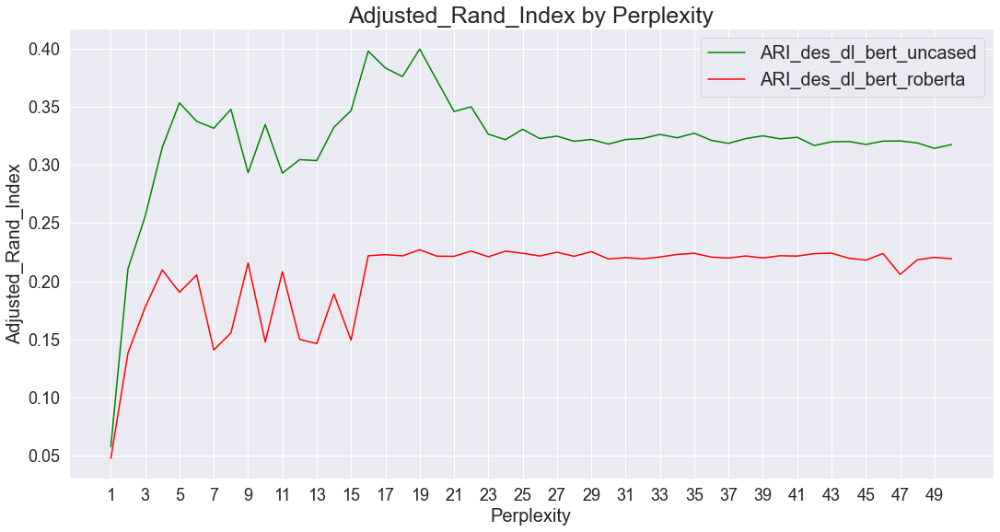

In [496]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_dl_bert_uncased
y2 = ARI_des_dl_bert_roberta

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_dl_bert_uncased')
ax.plot(x, y2, color = 'red', label = 'ARI_des_dl_bert_roberta')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.227 time :  6.0


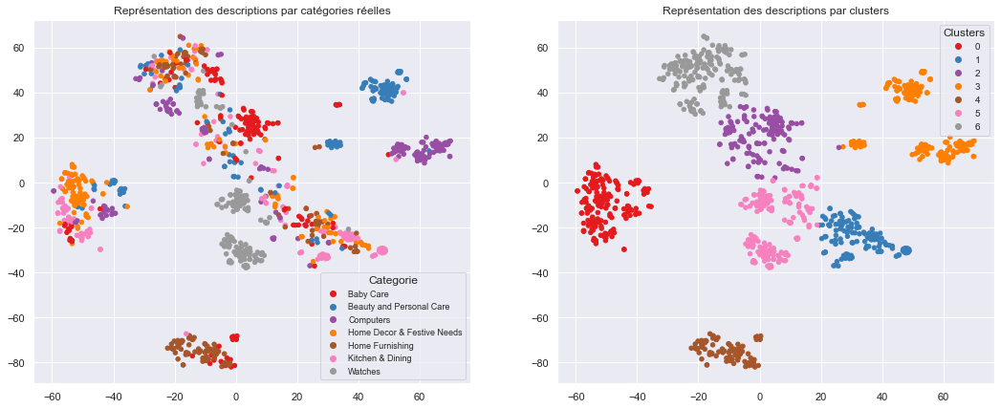

ARI :  0.227


In [531]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute bert_roberta_based_sentiments model with perplexity 19 for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_bert, 19)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

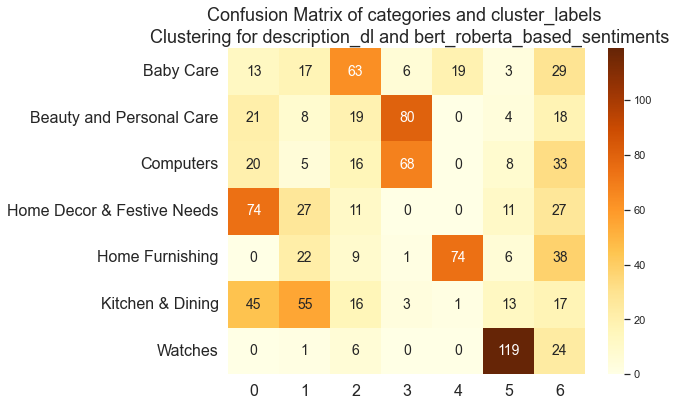

In [532]:
# Confusion Matrix with category names
conf_mat = metrics.confusion_matrix(true_labels, labels)
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_dl and bert_roberta_based_sentiments',
          size = 18);

In [533]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 63   6   0  13  48  17   3]
 [ 19  80   0  21  18   8   4]
 [ 16  68   0  20  33   5   8]
 [ 11   0   0  74  27  27  11]
 [  9   1   0   0 112  22   6]
 [ 16   3   0  45  18  55  13]
 [  6   0   0   0  24   1 119]]

                            precision    recall  f1-score   support

                 Baby Care      0.450     0.420     0.434       150
  Beauty and Personal Care      0.506     0.533     0.519       150
                 Computers      0.000     0.000     0.000       150
Home Decor & Festive Needs      0.428     0.493     0.458       150
           Home Furnishing      0.400     0.747     0.521       150
          Kitchen & Dining      0.407     0.367     0.386       150
                   Watches      0.726     0.793     0.758       150

                  accuracy                          0.479      1050
                 macro avg      0.417     0.479     0.440      1050
              weighted avg      0.417     0.479     0.440      1050



C:\Users\33624\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\33624\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\33624\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\33624\anaconda3\lib\site-packages\sklearn\metr

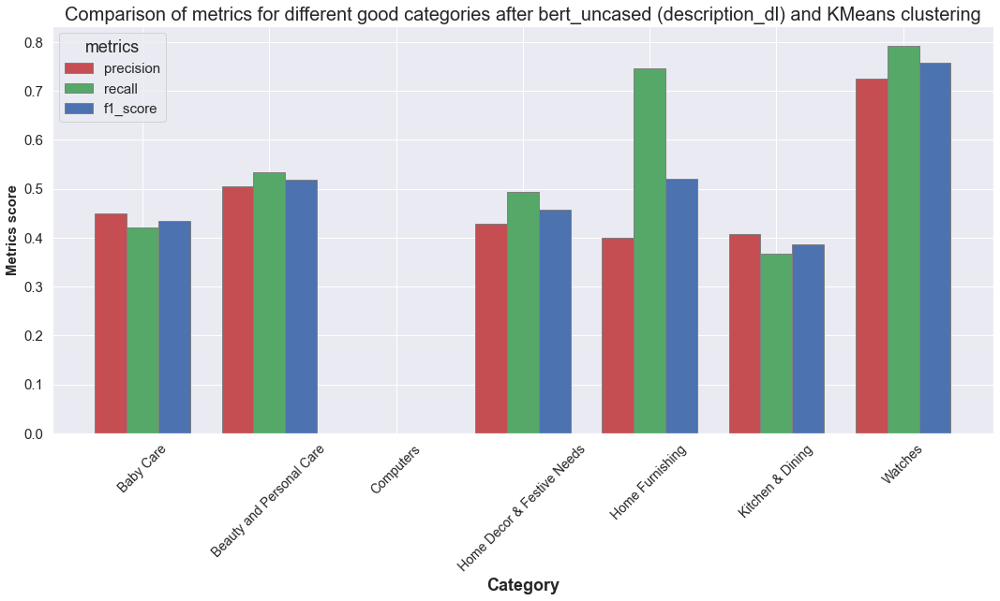

In [534]:
# Create dataframe with categories and metrics
data_metrics_w2vec = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_w2vec['precision'].values
recall = data_metrics_w2vec['recall'].values
f1_score = data_metrics_w2vec['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(precision))],
           [category for category in list_categories], 
           size = 14,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after bert_uncased (description_dl) and KMeans clustering',
         size = 20)
plt.show()

## BERT hub Tensorflow

In [200]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [201]:
descriptions = data['description_dl'].to_list()

In [202]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions, 
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  79.0


In [523]:
# Execute bert_hub_tensorflow embedding model with perplexity from 1 to 50 for 'description_dl' feature
ARI_des_dl_bert_hub_tensorflow = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity)
    ARI_des_dl_bert_hub_tensorflow.append(ARI)

ARI :  0.051 time :  5.0
ARI :  0.1891 time :  6.0
ARI :  0.2366 time :  7.0
ARI :  0.2644 time :  6.0
ARI :  0.3158 time :  5.0
ARI :  0.3126 time :  6.0
ARI :  0.3229 time :  5.0
ARI :  0.3538 time :  5.0
ARI :  0.29 time :  6.0
ARI :  0.3463 time :  6.0
ARI :  0.3439 time :  6.0
ARI :  0.3032 time :  6.0
ARI :  0.3354 time :  6.0
ARI :  0.3326 time :  6.0
ARI :  0.3605 time :  6.0
ARI :  0.3038 time :  5.0
ARI :  0.3865 time :  6.0
ARI :  0.3813 time :  7.0
ARI :  0.3616 time :  7.0
ARI :  0.3631 time :  6.0
ARI :  0.3479 time :  6.0
ARI :  0.3309 time :  7.0
ARI :  0.3229 time :  6.0
ARI :  0.3268 time :  6.0
ARI :  0.3257 time :  7.0
ARI :  0.3304 time :  6.0
ARI :  0.3283 time :  6.0
ARI :  0.3265 time :  6.0
ARI :  0.3202 time :  6.0
ARI :  0.313 time :  6.0
ARI :  0.3178 time :  6.0
ARI :  0.3281 time :  7.0
ARI :  0.3288 time :  7.0
ARI :  0.3249 time :  7.0
ARI :  0.3219 time :  7.0
ARI :  0.3235 time :  7.0
ARI :  0.3209 time :  7.0
ARI :  0.3243 time :  7.0
ARI :  0.3192 ti

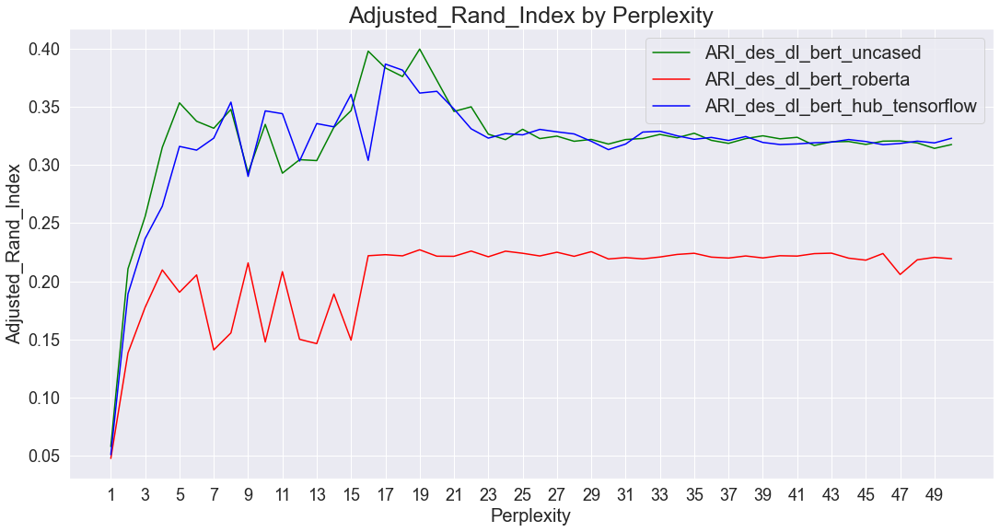

In [524]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_dl_bert_uncased
y2 = ARI_des_dl_bert_roberta
y3 = ARI_des_dl_bert_hub_tensorflow

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_dl_bert_uncased')
ax.plot(x, y2, color = 'red', label = 'ARI_des_dl_bert_roberta')
ax.plot(x, y3, color = 'blue', label = 'ARI_des_dl_bert_hub_tensorflow')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.3865 time :  5.0


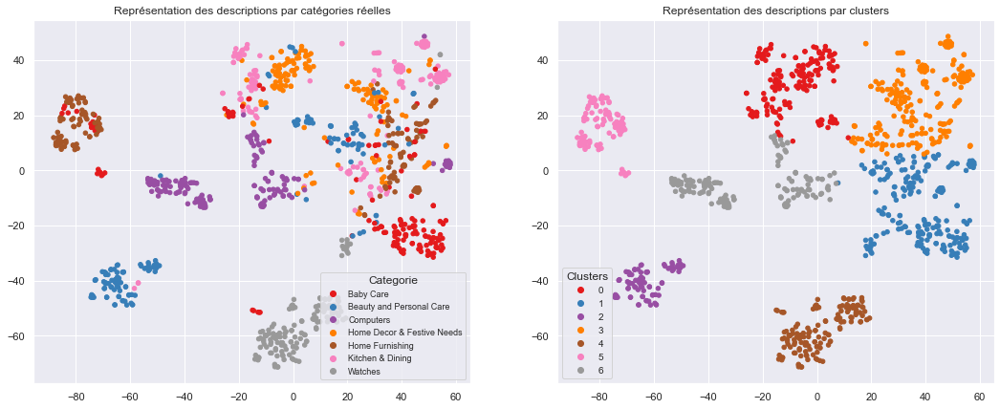

ARI :  0.3865


In [525]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute bert_hub_tensorflow model with perplexity 17 for 'description_dl' feature
ARI, X_tsne, labels = ARI_fct(features_bert, 17)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

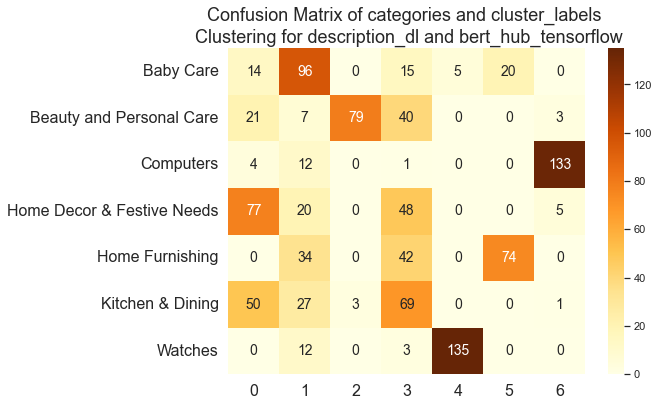

In [526]:
# Confusion Matrix with category names
conf_mat = metrics.confusion_matrix(true_labels, labels)
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_dl and bert_hub_tensorflow',
          size = 18);

In [527]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 96   0   0  14  20  15   5]
 [  7  79   3  21   0  40   0]
 [ 12   0 133   4   0   1   0]
 [ 20   0   5  77   0  48   0]
 [ 34   0   0   0  74  42   0]
 [ 27   3   1  50   0  69   0]
 [ 12   0   0   0   0   3 135]]

                            precision    recall  f1-score   support

                 Baby Care      0.462     0.640     0.536       150
  Beauty and Personal Care      0.963     0.527     0.681       150
                 Computers      0.937     0.887     0.911       150
Home Decor & Festive Needs      0.464     0.513     0.487       150
           Home Furnishing      0.787     0.493     0.607       150
          Kitchen & Dining      0.317     0.460     0.375       150
                   Watches      0.964     0.900     0.931       150

                  accuracy                          0.631      1050
                 macro avg      0.699     0.631     0.647      1050
              weighted avg      0.699     0.631     0.647      1050



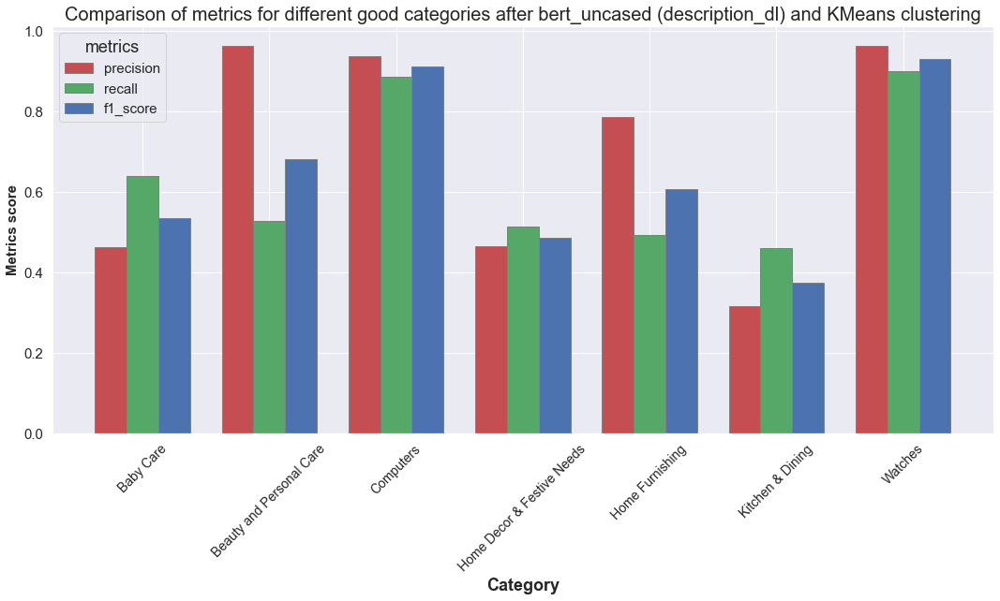

In [528]:
# Create dataframe with categories and metrics
data_metrics_w2vec = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_w2vec['precision'].values
recall = data_metrics_w2vec['recall'].values
f1_score = data_metrics_w2vec['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(precision))],
           [category for category in list_categories], 
           size = 14,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after bert_hub_tensorflow (description_dl) and KMeans clustering',
         size = 20)
plt.show()

In [203]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_wwm_uncased_L-24_H-1024_A-16/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [205]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions, 
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  241.0


In [206]:
# Execute bert_hub_tensorflow embedding model with perplexity from 1 to 50 for 'description_dl' feature
ARI_des_dl_bert_en_wwm_hub_tensorflow = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_bert, perplexity)
    ARI_des_dl_bert_en_wwm_hub_tensorflow.append(ARI)

ARI :  0.071 time :  5.0
ARI :  0.1746 time :  5.0
ARI :  0.2651 time :  5.0
ARI :  0.3106 time :  5.0
ARI :  0.2688 time :  5.0
ARI :  0.3665 time :  6.0
ARI :  0.4197 time :  6.0
ARI :  0.3972 time :  5.0
ARI :  0.3833 time :  5.0
ARI :  0.3887 time :  5.0
ARI :  0.3953 time :  5.0
ARI :  0.3948 time :  5.0
ARI :  0.3922 time :  5.0
ARI :  0.3945 time :  6.0
ARI :  0.397 time :  6.0
ARI :  0.3935 time :  6.0
ARI :  0.3939 time :  5.0
ARI :  0.395 time :  5.0
ARI :  0.3977 time :  6.0
ARI :  0.3927 time :  6.0
ARI :  0.3968 time :  6.0
ARI :  0.3938 time :  6.0
ARI :  0.3921 time :  6.0
ARI :  0.3976 time :  5.0
ARI :  0.4035 time :  5.0
ARI :  0.409 time :  6.0
ARI :  0.4084 time :  6.0
ARI :  0.4011 time :  6.0
ARI :  0.4068 time :  6.0
ARI :  0.408 time :  7.0
ARI :  0.4071 time :  7.0
ARI :  0.4072 time :  7.0
ARI :  0.4078 time :  7.0
ARI :  0.4 time :  8.0
ARI :  0.404 time :  8.0
ARI :  0.4023 time :  8.0
ARI :  0.3748 time :  8.0
ARI :  0.3704 time :  9.0
ARI :  0.3654 time : 

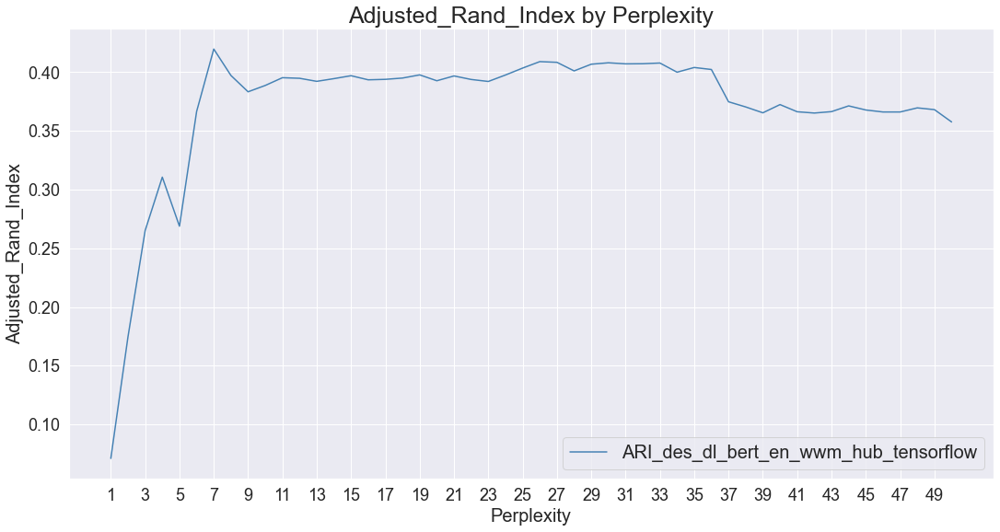

In [210]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y4 = ARI_des_dl_bert_en_wwm_hub_tensorflow

# Plot the different metrics
ax.plot(x, y4, color = 'steelblue', label = 'ARI_des_dl_bert_en_wwm_hub_tensorflow')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

# USE - Universal Sentence Encoder

In [535]:
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [536]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [539]:
descriptions = data['description_dl'].to_list()
features_USE = feature_USE_fct(descriptions, b_size = 10)

In [540]:
# Execute USE embedding model with perplexity from 1 to 50 for 'description_dl' feature and batch_size = 10
ARI_des_dl_USE_10 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_USE, perplexity)
    ARI_des_dl_USE_10.append(ARI)

ARI :  0.0688 time :  5.0
ARI :  0.1737 time :  6.0
ARI :  0.2108 time :  6.0
ARI :  0.3784 time :  6.0
ARI :  0.2782 time :  5.0
ARI :  0.4147 time :  5.0
ARI :  0.3489 time :  5.0
ARI :  0.3984 time :  5.0
ARI :  0.337 time :  5.0
ARI :  0.3464 time :  6.0
ARI :  0.4051 time :  6.0
ARI :  0.4424 time :  6.0
ARI :  0.4471 time :  6.0
ARI :  0.4734 time :  6.0
ARI :  0.4335 time :  6.0
ARI :  0.4357 time :  6.0
ARI :  0.4472 time :  6.0
ARI :  0.4654 time :  6.0
ARI :  0.4709 time :  6.0
ARI :  0.4433 time :  6.0
ARI :  0.4334 time :  6.0
ARI :  0.4423 time :  6.0
ARI :  0.4389 time :  7.0
ARI :  0.4416 time :  6.0
ARI :  0.4476 time :  6.0
ARI :  0.4472 time :  7.0
ARI :  0.4479 time :  7.0
ARI :  0.4406 time :  7.0
ARI :  0.4327 time :  6.0
ARI :  0.429 time :  7.0
ARI :  0.4248 time :  8.0
ARI :  0.4263 time :  7.0
ARI :  0.417 time :  8.0
ARI :  0.4168 time :  7.0
ARI :  0.4206 time :  7.0
ARI :  0.4141 time :  7.0
ARI :  0.422 time :  8.0
ARI :  0.397 time :  8.0
ARI :  0.4151 tim

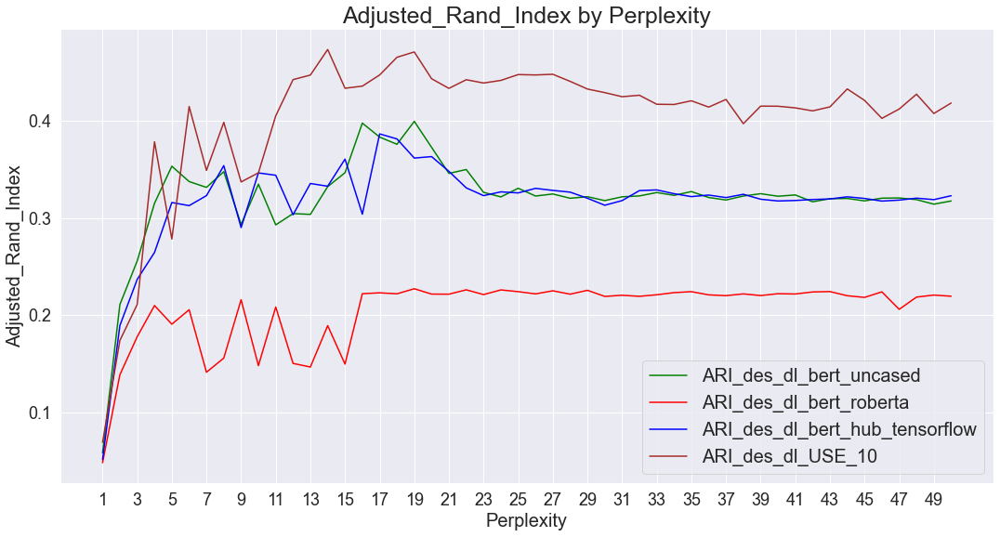

In [541]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_dl_bert_uncased
y2 = ARI_des_dl_bert_roberta
y3 = ARI_des_dl_bert_hub_tensorflow
y4 = ARI_des_dl_USE_10

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_dl_bert_uncased')
ax.plot(x, y2, color = 'red', label = 'ARI_des_dl_bert_roberta')
ax.plot(x, y3, color = 'blue', label = 'ARI_des_dl_bert_hub_tensorflow')
ax.plot(x, y4, color = 'brown', label = 'ARI_des_dl_USE_10')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

ARI :  0.4734 time :  5.0


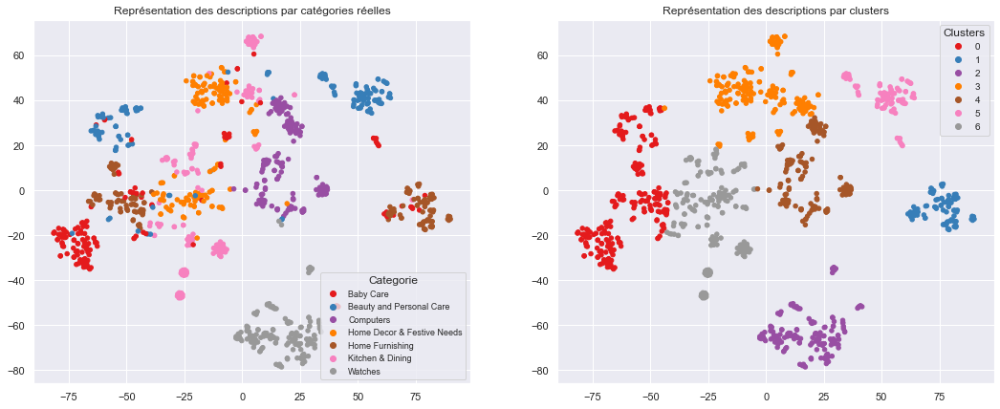

ARI :  0.4734


In [542]:
# DISPLAY BEST RESULTS CLUSTERING

# Execute USE model with perplexity 14 for 'description_dl' feature and batch size = 10
ARI, X_tsne, labels = ARI_fct(features_USE, 14)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

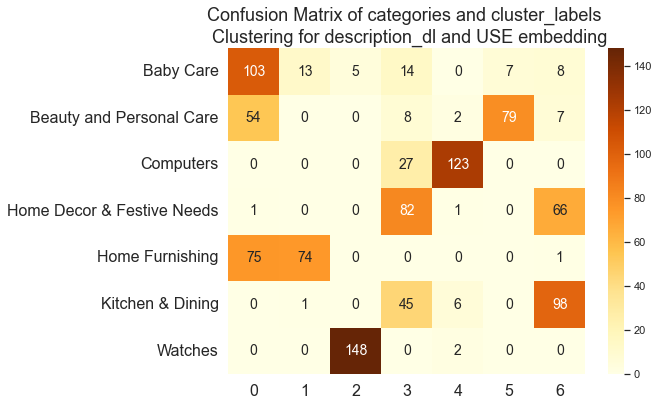

In [543]:
# Confusion Matrix with category names
conf_mat = metrics.confusion_matrix(true_labels, labels)
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for description_dl and USE embedding',
          size = 18);

In [544]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[103   7   0  14  13   8   5]
 [ 54  79   2   8   0   7   0]
 [  0   0 123  27   0   0   0]
 [  1   0   1  82   0  66   0]
 [ 75   0   0   0  74   1   0]
 [  0   0   6  45   1  98   0]
 [  0   0   2   0   0   0 148]]

                            precision    recall  f1-score   support

                 Baby Care      0.442     0.687     0.538       150
  Beauty and Personal Care      0.919     0.527     0.669       150
                 Computers      0.918     0.820     0.866       150
Home Decor & Festive Needs      0.466     0.547     0.503       150
           Home Furnishing      0.841     0.493     0.622       150
          Kitchen & Dining      0.544     0.653     0.594       150
                   Watches      0.967     0.987     0.977       150

                  accuracy                          0.673      1050
                 macro avg      0.728     0.673     0.681      1050
              weighted avg      0.728     0.673     0.681      1050



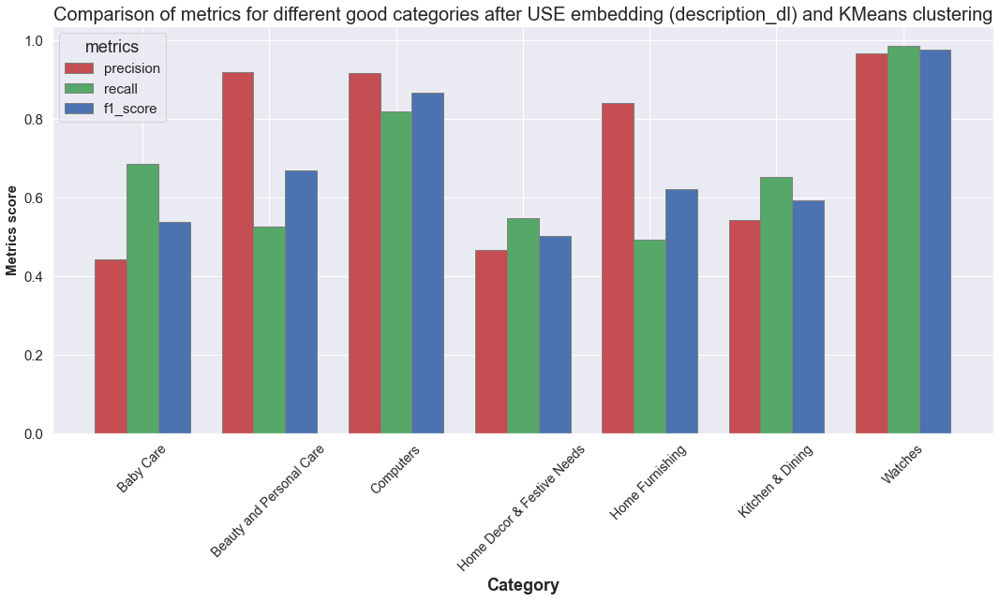

In [545]:
# Create dataframe with categories and metrics
data_metrics_w2vec = round(pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3], 3)

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_w2vec['precision'].values
recall = data_metrics_w2vec['recall'].values
f1_score = data_metrics_w2vec['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metrics score', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(precision))],
           [category for category in list_categories], 
           size = 14,
          rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after USE embedding (description_dl) and KMeans clustering',
         size = 20)
plt.show()

In [548]:
descriptions = data['description_dl'].to_list()
features_USE = feature_USE_fct(descriptions, b_size = 50)

In [549]:
# Execute USE embedding model with perplexity from 1 to 50 for 'description_dl' feature and batch_size = 100
ARI_des_dl_USE_100 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(features_USE, perplexity)
    ARI_des_dl_USE_100.append(ARI)

ARI :  0.0359 time :  5.0
ARI :  0.2066 time :  6.0
ARI :  0.2172 time :  6.0
ARI :  0.3345 time :  5.0
ARI :  0.307 time :  5.0
ARI :  0.3974 time :  6.0
ARI :  0.3899 time :  6.0
ARI :  0.3757 time :  5.0
ARI :  0.3393 time :  6.0
ARI :  0.3765 time :  6.0
ARI :  0.4318 time :  5.0
ARI :  0.4399 time :  5.0
ARI :  0.4188 time :  5.0
ARI :  0.4713 time :  5.0
ARI :  0.4657 time :  5.0
ARI :  0.4413 time :  5.0
ARI :  0.4428 time :  6.0
ARI :  0.4707 time :  6.0
ARI :  0.4861 time :  6.0
ARI :  0.4408 time :  6.0
ARI :  0.4438 time :  6.0
ARI :  0.4346 time :  6.0
ARI :  0.44 time :  6.0
ARI :  0.4438 time :  6.0
ARI :  0.4394 time :  6.0
ARI :  0.4446 time :  6.0
ARI :  0.437 time :  6.0
ARI :  0.4452 time :  6.0
ARI :  0.433 time :  6.0
ARI :  0.4243 time :  7.0
ARI :  0.4236 time :  7.0
ARI :  0.4215 time :  8.0
ARI :  0.4098 time :  7.0
ARI :  0.4153 time :  7.0
ARI :  0.4211 time :  7.0
ARI :  0.4048 time :  7.0
ARI :  0.4289 time :  7.0
ARI :  0.4149 time :  7.0
ARI :  0.4072 tim

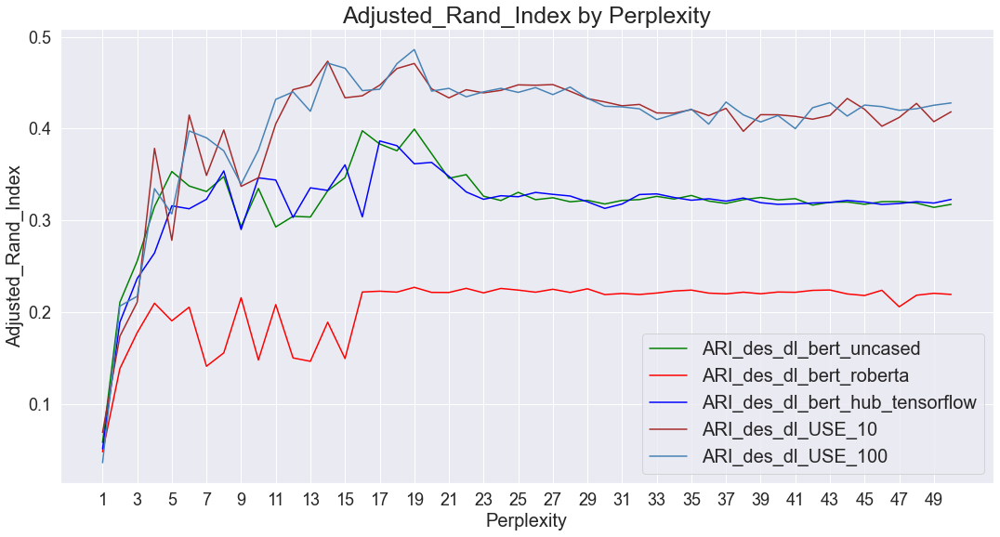

In [551]:
fig, ax = plt.subplots(figsize = (18,9))

sns.set_theme(style="darkgrid")

x = range(1, 51)
y1 = ARI_des_dl_bert_uncased
y2 = ARI_des_dl_bert_roberta
y3 = ARI_des_dl_bert_hub_tensorflow
y4 = ARI_des_dl_USE_10
y5 = ARI_des_dl_USE_100

# Plot the different metrics
ax.plot(x, y1, color = 'green', label = 'ARI_des_dl_bert_uncased')
ax.plot(x, y2, color = 'red', label = 'ARI_des_dl_bert_roberta')
ax.plot(x, y3, color = 'blue', label = 'ARI_des_dl_bert_hub_tensorflow')
ax.plot(x, y4, color = 'brown', label = 'ARI_des_dl_USE_10')
ax.plot(x, y5, color = 'steelblue', label = 'ARI_des_dl_USE_100')

plt.yticks(size = 18)
plt.xticks(np.arange(min(range(1, 51)), max(range(1, 51)), 2.0), size = 18)

plt.xlabel("Perplexity", size = 20)
plt.ylabel("Adjusted_Rand_Index", size = 20)

plt.title('Adjusted_Rand_Index by Perplexity', size = 25)

leg = ax.legend(fontsize = 20)

plt.show()

# SIFT

In [84]:
%matplotlib inline
from os import listdir

path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images/"
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1050


In [85]:
list_photos

['009099b1f6e1e8f893ec29a7023153c4.jpg',
 '0096e89cc25a8b96fb9808716406fe94.jpg',
 '00cbbc837d340fa163d11e169fbdb952.jpg',
 '00d84a518e0550612fcfcba3b02b6255.jpg',
 '00e966a5049a262cfc72e6bbf68b80e7.jpg',
 '00ed03657cedbe4663eff2d7fa702a33.jpg',
 '01089dc3618a0ab7304d784ef400b83d.jpg',
 '0131e5d87b72877702d536299cf83b75.jpg',
 '020d2daba55a723128e4e07c0b0393a9.jpg',
 '02127f52e96fb72c66bf081d25104ef8.jpg',
 '025a85a3d1cddc6307f7dc075d8d2132.jpg',
 '02a53d335775b652f22f41b529b9d646.jpg',
 '02c63a087b298ec74042d557acf61be1.jpg',
 '031c98cfde349d99fb6d5983f54c8751.jpg',
 '032e812adcd11a38fd8b764891a852ff.jpg',
 '037b39bef3db7ccd264c577a0edf0c0a.jpg',
 '037c2402fee39fbc80433935711d1383.jpg',
 '04f9f818e2d657b873b07578cfe2eade.jpg',
 '04f9ff160a1561e3656350f4bd6b8c50.jpg',
 '050ea3acb555bf641e7ae9b4f3ba684a.jpg',
 '052559ede419996737893eb47568ee7f.jpg',
 '057836ecde71565f8ebdd576e41fdc96.jpg',
 '059493eeb88ebb4cc08d1522f3f87c3f.jpg',
 '059bc43e03e1824a9ab6466e32e5f137.jpg',
 '06749cbff1487f

## Création des labels des photos à partir du nom des images

In [86]:
data = data.sort_values('image')
data = data.reset_index()

In [87]:
data.shape

(1050, 21)

In [88]:
# LabelEncoder for first categories
from sklearn import preprocessing

# Create labelencoder model
le = preprocessing.LabelEncoder()

# fit on categories
le.fit(data['first_category'])

# Transform categories to labels
data["category_label"] = le.transform(data['first_category'])
true_label = data["category_label"]

In [89]:
# Create labels for first_category
print("catégories : ", list_categories)
true_labels = true_label.tolist()
print("true_labels : ", true_labels)

catégories :  ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches']
true_labels :  [6, 5, 4, 1, 2, 2, 2, 5, 1, 5, 5, 1, 2, 2, 3, 3, 4, 3, 4, 4, 6, 0, 1, 6, 5, 4, 5, 2, 3, 1, 1, 6, 6, 6, 3, 4, 0, 5, 0, 0, 3, 3, 4, 1, 3, 1, 5, 5, 3, 0, 5, 5, 5, 2, 5, 6, 5, 1, 5, 4, 5, 3, 0, 5, 4, 6, 4, 6, 6, 5, 0, 3, 5, 4, 2, 1, 1, 0, 1, 6, 2, 6, 4, 5, 6, 4, 6, 1, 3, 4, 6, 3, 1, 3, 1, 0, 6, 3, 1, 3, 6, 2, 5, 1, 1, 1, 1, 1, 6, 6, 2, 1, 6, 5, 2, 3, 5, 2, 3, 5, 6, 3, 4, 0, 0, 5, 6, 1, 0, 3, 4, 1, 6, 2, 5, 0, 0, 4, 1, 2, 2, 3, 3, 5, 0, 2, 3, 4, 4, 4, 2, 2, 6, 5, 6, 0, 3, 2, 3, 1, 6, 5, 4, 0, 2, 0, 6, 1, 1, 1, 3, 6, 5, 4, 3, 3, 5, 3, 3, 6, 0, 2, 3, 0, 0, 0, 6, 5, 0, 0, 2, 4, 5, 6, 3, 2, 3, 3, 6, 6, 4, 6, 1, 3, 5, 2, 5, 5, 6, 0, 1, 0, 4, 1, 2, 6, 0, 1, 5, 0, 5, 3, 3, 0, 3, 1, 5, 6, 2, 0, 5, 4, 0, 0, 0, 1, 5, 4, 4, 4, 6, 3, 6, 3, 3, 6, 3, 6, 4, 1, 6, 2, 5, 0, 3, 1, 1, 2, 4, 4, 0, 3, 6, 2, 3, 1, 3, 2, 3, 4, 3, 1, 6, 0, 3, 2, 2, 2, 4

## Affichage d'exemples d'images par label

In [90]:
list_categories

['Baby Care',
 'Beauty and Personal Care',
 'Computers',
 'Home Decor & Festive Needs',
 'Home Furnishing',
 'Kitchen & Dining',
 'Watches']

Baby Care


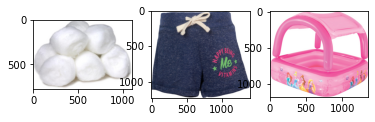

Beauty and Personal Care


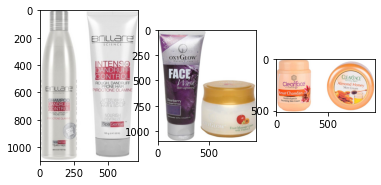

Computers


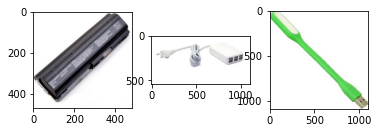

Home Decor & Festive Needs


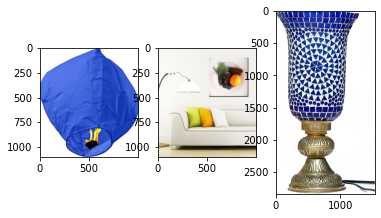

Home Furnishing


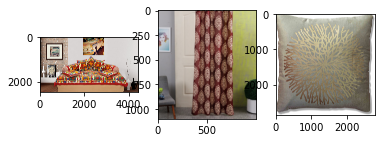

Kitchen & Dining


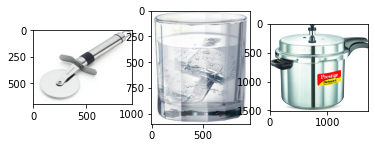

Watches


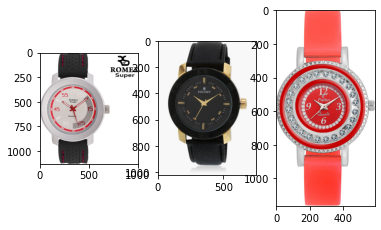

In [91]:
from matplotlib.image import imread

def list_fct(name) :
    list_image_name = [list_photos[i] for i in range(len(data)) if data["first_category"][i]==name]
    return list_image_name

list_baby=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Baby Care"]
list_beauty=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Beauty and Personal Care"]
list_computers=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Computers"]
list_home_decor=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Home Decor & Festive Needs"]
list_home_furnishing=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Home Furnishing"]
list_kitchen=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Kitchen & Dining"]
list_watches=[list_photos[i] for i in range(len(data)) if data["first_category"][i]=="Watches"]

for category in list_categories :
    print(category)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(category)[i+6]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

## Détermination et affichage des descripteurs SIFT

* Chaque descripteur est un vecteur de longueur 128

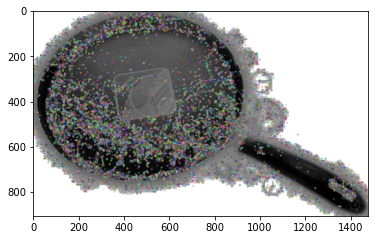

Descripteurs :  (10047, 128)

[[  2.   3.   3. ...   0.   0.   1.]
 [  1.   0.   0. ...   3.   2.   3.]
 [  1.   0.   1. ...  61.   8.   2.]
 ...
 [ 10.  13.  12. ...   0.   0.   0.]
 [ 38. 118. 107. ...   3.   4.  32.]
 [ 19.  23.   3. ...   0.   0.   0.]]


In [92]:
import cv2

# Création des features
sift = cv2.xfeatures2d.SIFT_create()

# Pour chaque image, passage en gris
image = cv2.imread(path+list_photos[1],0) # convert in gray

# pour chaque image, égalisation
image = cv2.equalizeHist(image)   # equalize image histogram

kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

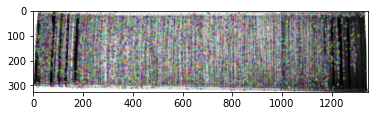

Descripteurs :  (13178, 128)

[[41.  3.  0. ...  0.  0.  0.]
 [28.  1.  0. ...  0.  0.  0.]
 [ 1.  0.  1. ...  0.  0.  1.]
 ...
 [ 1.  1.  1. ...  0.  0.  4.]
 [ 1.  1.  3. ...  0.  0.  2.]
 [ 1.  1.  1. ...  0.  0.  0.]]


In [93]:
import cv2

# Création des features
sift = cv2.xfeatures2d.SIFT_create()

# Pour chaque image, passage en gris
image = cv2.imread(path+list_photos[2],0) # convert in gray

# pour chaque image, égalisation
image = cv2.equalizeHist(image)   # equalize image histogram

kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

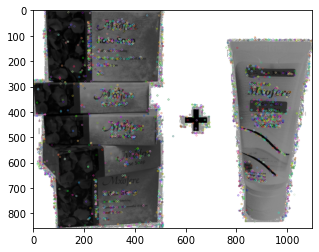

Descripteurs :  (2746, 128)

[[  0.  83.  92. ...   2.   4.  21.]
 [  4.   0.   1. ...   0.   0.   3.]
 [162.   1.   0. ...   0.   0.   0.]
 ...
 [ 38.   1.   0. ...   0.   0.   2.]
 [ 11.  33.  18. ...   1.  21.   2.]
 [  0.   0.   0. ...  12.  39.  14.]]


In [94]:
import cv2

# Création des features
sift = cv2.xfeatures2d.SIFT_create()

# Pour chaque image, passage en gris
image = cv2.imread(path+list_photos[3],0) # convert in gray

# pour chaque image, égalisation
image = cv2.equalizeHist(image)   # equalize image histogram

kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

# Pré-traitement des images via SIFT

## Créations des descripteurs de chaque image
* Pour chaque image passage en gris et equalisation
* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [95]:
len(list_photos)

1050

In [96]:
splits = np.array_split(list_photos, 4)

list1 = splits[0]
list2 = splits[1]
list3 = splits[2]
list4 = splits[3]

In [97]:
print(len(list1))
print(len(list2))
print(len(list3))
print(len(list4))

263
263
262
262


In [125]:
# identification of key points and associated descriptors in list_photos
import time, cv2

temps1=time.time()
sift = cv2.xfeatures2d.SIFT_create(100)

sift_keypoints1 = []
for image_num in range(len(list1)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints1.append(des)

sift_keypoints2 = []
for image_num in range(len(list2)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints2.append(des)

sift_keypoints3 = []
for image_num in range(len(list3)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints3.append(des)

sift_keypoints4 = []
for image_num in range(len(list4)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints4.append(des)

sift_keypoints = (sift_keypoints1 + sift_keypoints2 + sift_keypoints3 + sift_keypoints4)

# Création d'une liste de descripteurs par image 
# (qui sera utilisée pour réaliser les histogrammes par image)
sift_keypoints_by_img = np.asarray(sift_keypoints)

# Création d'une liste de descripteurs pour toutes les images 
# (qui sera utilisée pour créer les clusters de descripteurs)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
0
100
200
0
100
200
0
100
200


C:\Users\33624\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)



Nombre de descripteurs :  (105420, 128)
temps de traitement SIFT descriptor :           294.90 secondes


## Création des clusters de descripteurs
* Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [126]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round((len(sift_keypoints_all))/10,0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  10542
Création de 10542 clusters de descripteurs ...


C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:887: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  warnings.warn(


temps de traitement kmeans :           828.78 secondes


In [110]:
# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=5000, init_size=3*5000, random_state=0)
kmeans.fit(sift_keypoints_all)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:887: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  warnings.warn(


MiniBatchKMeans(init_size=15000, n_clusters=5000, random_state=0)

## Création des features des images
* Pour chaque image : 
   - prédiction des numéros de cluster de chaque descripteur
   - création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

In [127]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             5.39 secondes


## Réductions de dimension

### Réduction de dimension PCA
* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

In [128]:
from sklearn import manifold, decomposition

print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca = pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 10542)
Dimensions dataset après réduction PCA :  (1050, 253)


### Réduction de dimension T-SNE
* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [113]:
import time

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features, perplexity) :
    time1 = time.time()
    num_labels=len(list_categories)
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(true_labels, cls.labels_),4)
    data['cluster'] = cls.labels_
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, true_labels, labels, ARI) :
    fig = plt.figure(figsize=(18,7))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=true_labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=list_categories, loc="best", title="Categorie", fontsize = 9)
    plt.title('Représentation des descriptions par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters", fontsize = 10)
    plt.title('Représentation des descriptions par clusters')
    
    plt.show()
    print("ARI : ", ARI)

In [129]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_pca = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(feat_pca, perplexity)
    ARI_feat_pca.append(ARI)

ARI :  0.0011 time :  5.0
ARI :  -0.0022 time :  5.0
ARI :  0.0015 time :  6.0
ARI :  0.0003 time :  6.0
ARI :  -0.0016 time :  5.0
ARI :  0.0034 time :  6.0
ARI :  0.0011 time :  4.0
ARI :  -0.0008 time :  4.0
ARI :  0.0005 time :  4.0
ARI :  -0.0002 time :  3.0
ARI :  0.0005 time :  3.0
ARI :  0.0008 time :  3.0
ARI :  0.0019 time :  3.0
ARI :  0.0013 time :  3.0
ARI :  0.0006 time :  3.0
ARI :  0.0021 time :  3.0
ARI :  0.001 time :  3.0
ARI :  -0.0002 time :  3.0
ARI :  -0.0005 time :  4.0
ARI :  -0.0001 time :  7.0
ARI :  -0.0011 time :  3.0
ARI :  0.0004 time :  3.0
ARI :  0.0007 time :  3.0
ARI :  -0.0012 time :  3.0


KeyboardInterrupt: 

ARI :  0.0089 time :  3.0


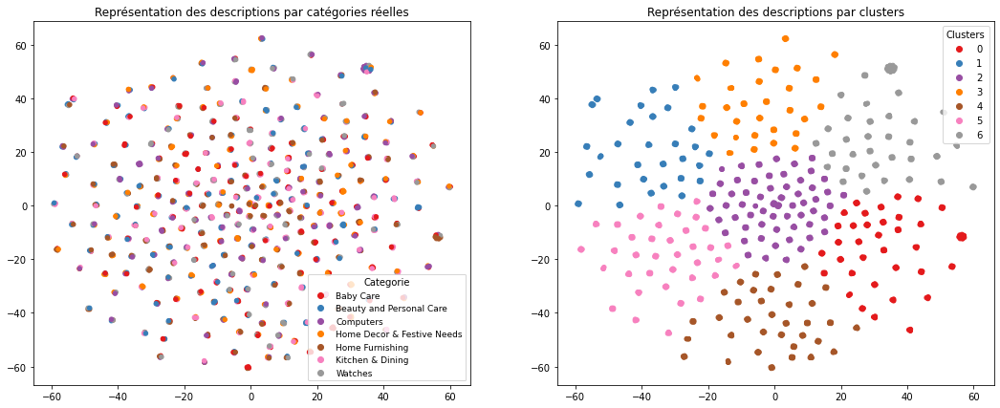

ARI :  0.0089


In [116]:
# Execute clustering with perplexity 18 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(feat_pca, 18)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [118]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["first_category"]
print(df_tsne.shape)

(1050, 3)


In [119]:
df_tsne

,tsne1,tsne2,class
0,-7.097763,5.666492,Watches
1,-24.907650,32.825111,Kitchen & Dining
2,-37.429218,13.634325,Home Furnishing
3,12.470419,7.043664,Beauty and Personal Care
4,-2.537951,-32.376671,Computers
...,...,...,...
1045,-1.705219,45.448647,Kitchen & Dining
1046,-37.471642,23.497656,Home Furnishing
1047,-47.546936,7.268369,Kitchen & Dining
1048,8.631765,34.841831,Home Furnishing


## Analyse visuelle : affichage T-SNE selon catégories d'images

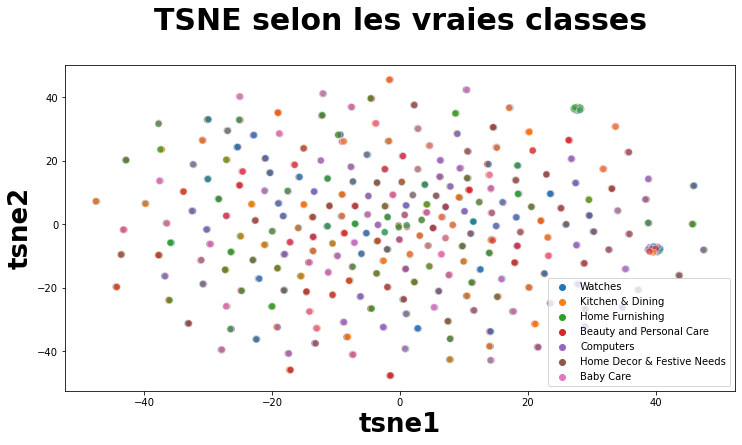

In [120]:
plt.figure(figsize=(12,6))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 10}) 

plt.show()

## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [122]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1050, 4)


In [123]:
df_tsne

,tsne1,tsne2,class,cluster
0,-7.097763,5.666492,Watches,3
1,-24.907650,32.825111,Kitchen & Dining,6
2,-37.429218,13.634325,Home Furnishing,6
3,12.470419,7.043664,Beauty and Personal Care,3
4,-2.537951,-32.376671,Computers,1
...,...,...,...,...
1045,-1.705219,45.448647,Kitchen & Dining,0
1046,-37.471642,23.497656,Home Furnishing,6
1047,-47.546936,7.268369,Kitchen & Dining,5
1048,8.631765,34.841831,Home Furnishing,0


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

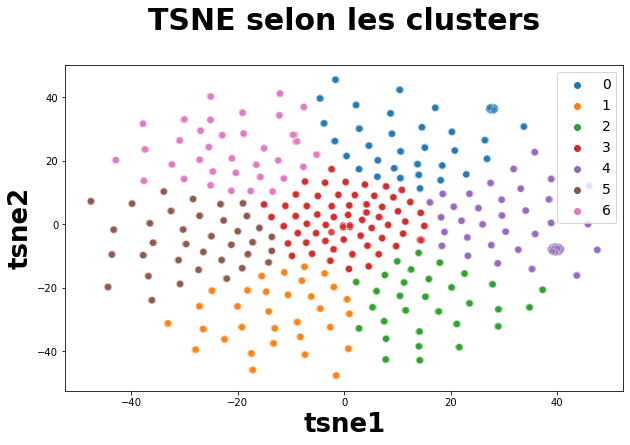

ARI :  0.008248879831175322


In [124]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = data["category_label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

## Transfer Learning

In [130]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

In [ ]:
path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images/"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
photos = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.jpg'):
          # adds only the image files to the photos list
            photos.append(file.name)



In [203]:
path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images/"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
photos = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.jpg'):
          # adds only the image files to the photos list
            photos.append(file.name)

In [204]:
# load the image as a 224x224 array
img = load_img(photos[0], target_size=(224,224))
# convert from 'PIL.Image.Image' to numpy array
img = np.array(img)

print(img.shape)

(224, 224, 3)


In [205]:
reshaped_img = img.reshape(1,224,224,3)
print(reshaped_img.shape)

(1, 224, 224, 3)


In [206]:
x = preprocess_input(reshaped_img)

### Transfer Learning with VGG16

In [135]:
# load model
model = VGG16()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [136]:
features = model.predict(x)
print(features.shape)

(1, 4096)


In [137]:
# All the code in a single function
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [138]:
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo,model)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)
feat.shape

# get the unique labels
label = data['first_category'].tolist()
unique_labels = list(set(label))

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [139]:
filenames

array(['009099b1f6e1e8f893ec29a7023153c4.jpg',
       '0096e89cc25a8b96fb9808716406fe94.jpg',
       '00cbbc837d340fa163d11e169fbdb952.jpg', ...,
       'ffbf3794aa8cb6bb8d3f313d0a549a09.jpg',
       'ffc2e1fc7c886ec09a331040ada038aa.jpg',
       'fffa2117a4006d4a848eb7d5b80d4816.jpg'], dtype='<U36')

In [140]:
unique_labels

['Computers',
 'Baby Care',
 'Kitchen & Dining',
 'Watches',
 'Home Furnishing',
 'Beauty and Personal Care',
 'Home Decor & Festive Needs']

In [141]:
feat.shape

(1050, 4096)

In [142]:
data_photos

{'009099b1f6e1e8f893ec29a7023153c4.jpg': array([[2.5928068, 2.6987536, 0.       , ..., 0.8779248, 0.       ,
         2.967209 ]], dtype=float32),
 '0096e89cc25a8b96fb9808716406fe94.jpg': array([[0.       , 0.       , 0.       , ..., 0.5359812, 0.       ,
         0.5867286]], dtype=float32),
 '00cbbc837d340fa163d11e169fbdb952.jpg': array([[0.        , 0.        , 0.        , ..., 0.69853866, 0.        ,
         0.        ]], dtype=float32),
 '00d84a518e0550612fcfcba3b02b6255.jpg': array([[0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.576265]],
       dtype=float32),
 '00e966a5049a262cfc72e6bbf68b80e7.jpg': array([[0.       , 0.       , 1.525368 , ..., 0.       , 0.       ,
         3.4272323]], dtype=float32),
 '00ed03657cedbe4663eff2d7fa702a33.jpg': array([[0.        , 0.        , 0.        , ..., 1.5859807 , 0.        ,
         0.10182554]], dtype=float32),
 '01089dc3618a0ab7304d784ef400b83d.jpg': array([[0.        , 0.        , 0.48546374, ..., 0.19896585, 0.        ,


In [167]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [168]:
pca.components_

array([[-0.02440464, -0.01706487, -0.00317764, ..., -0.02142391,
        -0.00650981,  0.02023098],
       [-0.02625473, -0.00040165, -0.00367203, ..., -0.0412965 ,
         0.02346245, -0.02693528],
       [ 0.00043991,  0.00780974,  0.00435877, ..., -0.00489782,
         0.00695451, -0.02373452],
       ...,
       [-0.03682267, -0.01363657,  0.00497274, ..., -0.00478378,
        -0.00594439,  0.02154954],
       [ 0.00784056,  0.00475928,  0.00229216, ..., -0.00602347,
         0.0245659 , -0.01643061],
       [-0.01168425,  0.0026028 ,  0.02866392, ..., -0.00470777,
        -0.00330316,  0.01077802]], dtype=float32)

In [169]:
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

Components before PCA: (1050, 4096)
Components after PCA: (1050, 803)


In [170]:
kmeans = KMeans(n_clusters=len(unique_labels),n_jobs=-1, random_state=22)
kmeans.fit(x)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [171]:
kmeans.labels_

array([2, 2, 6, ..., 0, 4, 2])

In [172]:
ARI = np.round(metrics.adjusted_rand_score(true_labels, kmeans.labels_),4)
ARI

0.488

In [173]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_cnn = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_cnn.append(ARI)

ARI :  0.1167 time :  5.0
ARI :  0.3281 time :  5.0
ARI :  0.3511 time :  5.0
ARI :  0.4811 time :  5.0
ARI :  0.4587 time :  5.0
ARI :  0.4381 time :  5.0
ARI :  0.4744 time :  5.0
ARI :  0.4953 time :  6.0
ARI :  0.4669 time :  6.0
ARI :  0.4432 time :  7.0
ARI :  0.4597 time :  6.0
ARI :  0.4415 time :  6.0
ARI :  0.4324 time :  6.0
ARI :  0.4431 time :  6.0
ARI :  0.4737 time :  6.0
ARI :  0.4529 time :  6.0
ARI :  0.4633 time :  6.0
ARI :  0.4596 time :  7.0
ARI :  0.4677 time :  7.0
ARI :  0.4785 time :  7.0
ARI :  0.4862 time :  7.0
ARI :  0.452 time :  7.0
ARI :  0.4756 time :  7.0
ARI :  0.4641 time :  6.0
ARI :  0.4379 time :  7.0
ARI :  0.4729 time :  7.0
ARI :  0.4585 time :  8.0
ARI :  0.4662 time :  8.0
ARI :  0.5017 time :  8.0
ARI :  0.4462 time :  7.0
ARI :  0.489 time :  8.0
ARI :  0.4852 time :  8.0
ARI :  0.437 time :  8.0
ARI :  0.4756 time :  8.0
ARI :  0.4299 time :  8.0
ARI :  0.4653 time :  9.0
ARI :  0.4939 time :  8.0
ARI :  0.4704 time :  8.0
ARI :  0.4926 t

ARI :  0.5347 time :  8.0


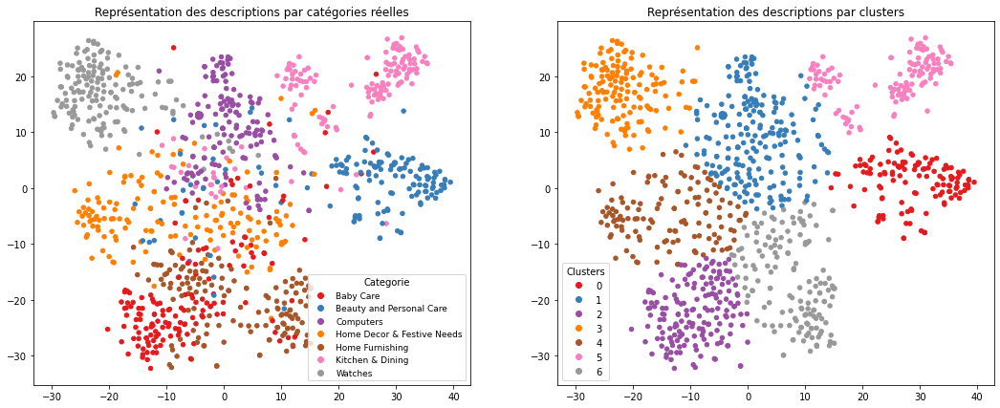

ARI :  0.5347


In [175]:
# Execute clustering with perplexity 47 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, 47)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

ARI :  0.4953 time :  5.0


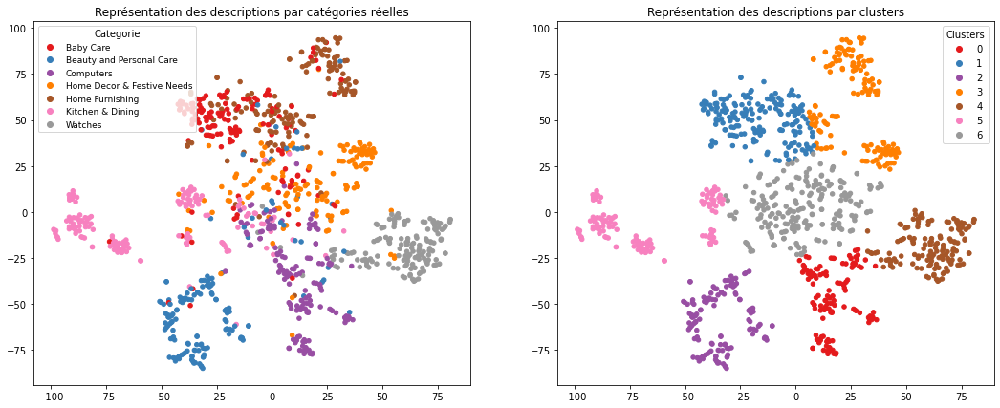

ARI :  0.4953


In [176]:
# Execute clustering with perplexity 8 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, 8)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

ARI :  0.5017 time :  7.0


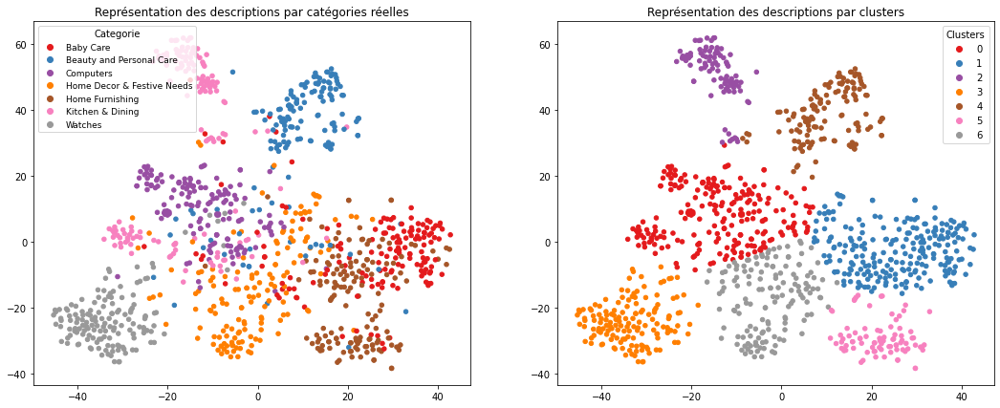

ARI :  0.5017


In [177]:
# Execute clustering with perplexity 29 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, 29)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

## Second test

In [178]:
pca = PCA(n_components=1050, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [179]:
kmeans = KMeans(n_clusters=len(unique_labels),n_jobs=-1, random_state=22)
kmeans.fit(x)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [180]:
ARI = np.round(metrics.adjusted_rand_score(true_labels, kmeans.labels_),4)
ARI

0.4595

In [181]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_cnn = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_cnn.append(ARI)

ARI :  0.0958 time :  5.0
ARI :  0.2864 time :  5.0
ARI :  0.3442 time :  5.0
ARI :  0.3618 time :  6.0
ARI :  0.4887 time :  5.0
ARI :  0.4582 time :  5.0
ARI :  0.4423 time :  6.0
ARI :  0.4632 time :  5.0
ARI :  0.5159 time :  5.0
ARI :  0.4431 time :  5.0
ARI :  0.4516 time :  6.0
ARI :  0.455 time :  5.0
ARI :  0.4661 time :  6.0
ARI :  0.4745 time :  5.0
ARI :  0.4792 time :  5.0
ARI :  0.4575 time :  6.0
ARI :  0.4791 time :  5.0
ARI :  0.418 time :  6.0
ARI :  0.459 time :  6.0
ARI :  0.4829 time :  6.0
ARI :  0.4442 time :  6.0
ARI :  0.4378 time :  6.0
ARI :  0.4291 time :  6.0
ARI :  0.4685 time :  6.0
ARI :  0.449 time :  6.0
ARI :  0.4309 time :  6.0
ARI :  0.456 time :  7.0
ARI :  0.4396 time :  8.0
ARI :  0.4348 time :  7.0
ARI :  0.4689 time :  7.0
ARI :  0.4412 time :  7.0
ARI :  0.4683 time :  7.0
ARI :  0.4406 time :  7.0
ARI :  0.4835 time :  7.0
ARI :  0.4889 time :  7.0
ARI :  0.4654 time :  7.0
ARI :  0.4636 time :  7.0
ARI :  0.4823 time :  8.0
ARI :  0.4421 tim

### Transfer Learning with ResNet50

In [187]:
from tensorflow.keras.applications.resnet50 import ResNet50

In [188]:
path = "C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/Images/"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
photos = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.jpg'):
          # adds only the image files to the photos list
            photos.append(file.name)

In [189]:
# load model
model = ResNet50()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

102981632/102967424 [==============================] - 2s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                         

                                                                                                  
 conv2_block3_1_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization) 

                                                                                                  
 conv3_block3_1_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization) 

                                )                                                                 
                                                                                                  
 conv4_block2_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block1_out[0][0]']       
                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_blo

 conv4_block4_out (Activation)  (None, 14, 14, 1024  0           ['conv4_block4_add[0][0]']       
                                )                                                                 
                                                                                                  
 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
          

 ization)                                                                                         
                                                                                                  
 conv5_block1_add (Add)         (None, 7, 7, 2048)   0           ['conv5_block1_0_bn[0][0]',      
                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization) 

In [196]:
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo,model)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 1050 samples of 2048 vectors
feat = feat.reshape(-1,2048)
feat.shape

(1050, 2048)

In [197]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [198]:
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

Components before PCA: (1050, 2048)
Components after PCA: (1050, 722)


In [199]:
kmeans = KMeans(n_clusters=len(unique_labels),n_jobs=-1, random_state=22)
kmeans.fit(x)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [200]:
ARI = np.round(metrics.adjusted_rand_score(true_labels, kmeans.labels_),4)
ARI

0.4412

In [201]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_ResNet50 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_ResNet50.append(ARI)

ARI :  0.0948 time :  5.0
ARI :  0.2774 time :  5.0
ARI :  0.3357 time :  5.0
ARI :  0.3891 time :  5.0
ARI :  0.4187 time :  5.0
ARI :  0.4796 time :  6.0
ARI :  0.5024 time :  6.0
ARI :  0.4969 time :  5.0
ARI :  0.5116 time :  6.0
ARI :  0.5436 time :  6.0
ARI :  0.5451 time :  6.0
ARI :  0.5446 time :  5.0
ARI :  0.5606 time :  6.0
ARI :  0.5585 time :  6.0
ARI :  0.5598 time :  6.0
ARI :  0.5531 time :  6.0
ARI :  0.5354 time :  6.0
ARI :  0.5352 time :  6.0
ARI :  0.5521 time :  6.0
ARI :  0.5126 time :  6.0
ARI :  0.5226 time :  6.0
ARI :  0.5067 time :  6.0
ARI :  0.501 time :  6.0
ARI :  0.5146 time :  6.0
ARI :  0.5094 time :  6.0
ARI :  0.5453 time :  6.0
ARI :  0.5035 time :  7.0
ARI :  0.508 time :  7.0
ARI :  0.5159 time :  7.0
ARI :  0.5007 time :  8.0
ARI :  0.5116 time :  8.0
ARI :  0.4986 time :  8.0
ARI :  0.5436 time :  9.0
ARI :  0.5315 time :  9.0
ARI :  0.5647 time :  8.0
ARI :  0.5474 time :  7.0
ARI :  0.5671 time :  8.0
ARI :  0.526 time :  9.0
ARI :  0.5366 t

ARI :  0.585 time :  8.0


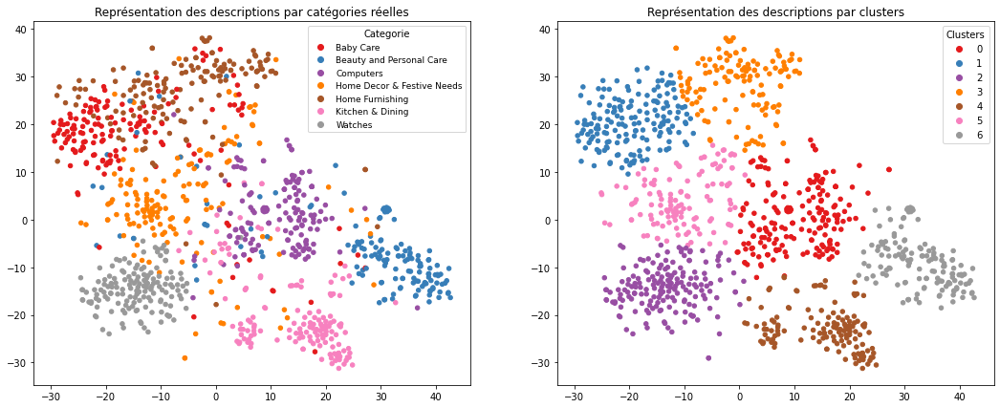

ARI :  0.585


In [202]:
# Execute clustering with perplexity 48 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, 48)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [207]:
# Count the number of products belonging to different categories in each cluster
data.groupby("cluster").count()['first_category']

cluster
0    190
1    167
2    171
3    133
4    132
5    122
6    135
Name: first_category, dtype: int64

In [208]:
# View of confusion matrix without cluster_label reattribution
conf_mat = confusion_matrix(true_labels, labels)
print(conf_mat)

[[  7 106   2  21   4   7   3]
 [ 11   4   3   3   0  10 119]
 [141   0   3   1   0   2   3]
 [  9   4  13  19   6  95   4]
 [  2  53   1  89   0   4   1]
 [ 19   0   3   0 122   1   5]
 [  1   0 146   0   0   3   0]]


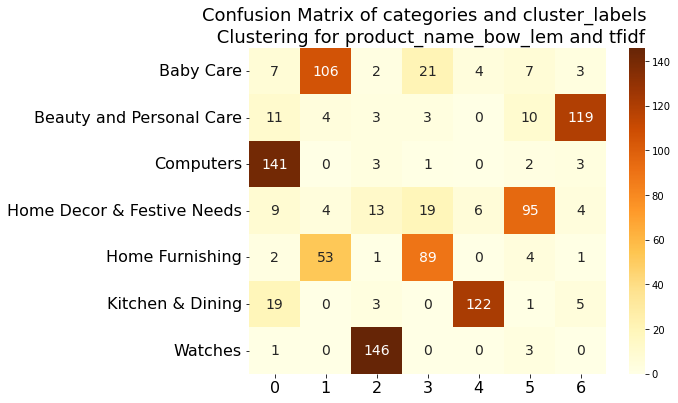

In [209]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for product_name_bow_lem and tfidf',
          size = 18);

In [211]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[106   3   7   7  21   4   2]
 [  4 119  11  10   3   0   3]
 [  0   3 141   2   1   0   3]
 [  4   4   9  95  19   6  13]
 [ 53   1   2   4  89   0   1]
 [  0   5  19   1   0 122   3]
 [  0   0   1   3   0   0 146]]

                            precision    recall  f1-score   support

                 Baby Care      0.635     0.707     0.669       150
  Beauty and Personal Care      0.881     0.793     0.835       150
                 Computers      0.742     0.940     0.829       150
Home Decor & Festive Needs      0.779     0.633     0.699       150
           Home Furnishing      0.669     0.593     0.629       150
          Kitchen & Dining      0.924     0.813     0.865       150
                   Watches      0.854     0.973     0.910       150

                  accuracy                          0.779      1050
                 macro avg      0.783     0.779     0.777      1050
              weighted avg      0.783     0.779     0.777      1050



In [212]:
# Create dataframe with categories and metrics
data_metrics_ResNet50 = pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3]
data_metrics_ResNet50

,precision,recall,f1-score
Baby Care,0.634731,0.706667,0.668770
Beauty and Personal Care,0.881481,0.793333,0.835088
Computers,0.742105,0.940000,0.829412
Home Decor & Festive Needs,0.778689,0.633333,0.698529
Home Furnishing,0.669173,0.593333,0.628975
Kitchen & Dining,0.924242,0.813333,0.865248
Watches,0.853801,0.973333,0.909657


In [214]:
# Same dataframe with rounded values
data_metrics_ResNet50 = round(data_metrics_ResNet50, 3)
data_metrics_ResNet50

,precision,recall,f1-score
Baby Care,0.635,0.707,0.669
Beauty and Personal Care,0.881,0.793,0.835
Computers,0.742,0.940,0.829
Home Decor & Festive Needs,0.779,0.633,0.699
Home Furnishing,0.669,0.593,0.629
Kitchen & Dining,0.924,0.813,0.865
Watches,0.854,0.973,0.910


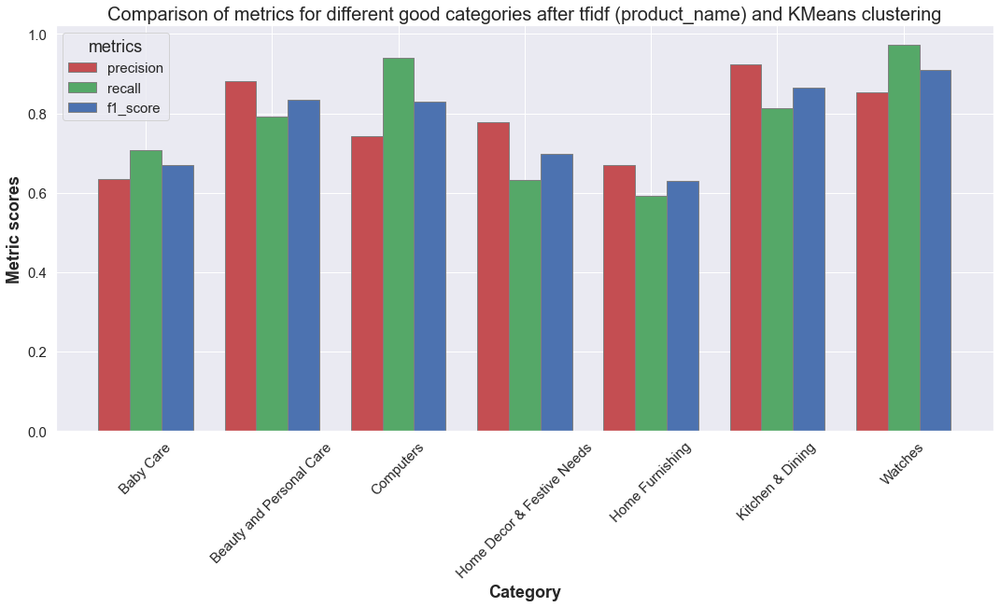

In [215]:
sns.set_theme(context='notebook', style='darkgrid')

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_ResNet50['precision'].values
recall = data_metrics_ResNet50['recall'].values
f1_score = data_metrics_ResNet50['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metric scores', fontweight ='bold', fontsize = 18)
plt.xticks([r + barWidth for r in range(len(precision))],
           list_categories, 
           size = 15,
           rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after tfidf (product_name) and KMeans clustering',
         size = 20)
plt.show()

### Transfer Learning with VGG19

In [216]:
from keras.applications.vgg19 import preprocess_input 
# models 
from keras.applications.vgg19 import VGG19 

In [217]:
# load model
model = VGG19()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

574726144/574710816 [==============================] - 12s 0us/step
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                         

In [218]:
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo,model)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)
feat.shape

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(1050, 4096)

In [219]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

Components before PCA: (1050, 4096)
Components after PCA: (1050, 797)


In [220]:
kmeans = KMeans(n_clusters=len(unique_labels),n_jobs=-1, random_state=22)
kmeans.fit(x)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [221]:
ARI = np.round(metrics.adjusted_rand_score(true_labels, kmeans.labels_),4)
ARI

0.4603

In [222]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_VGG19 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_VGG19.append(ARI)

ARI :  0.1347 time :  6.0
ARI :  0.288 time :  5.0
ARI :  0.4053 time :  5.0
ARI :  0.4379 time :  5.0
ARI :  0.4654 time :  5.0
ARI :  0.4803 time :  5.0
ARI :  0.43 time :  5.0
ARI :  0.473 time :  5.0
ARI :  0.4973 time :  6.0
ARI :  0.4872 time :  6.0
ARI :  0.5301 time :  5.0
ARI :  0.422 time :  6.0
ARI :  0.4355 time :  5.0
ARI :  0.4529 time :  6.0
ARI :  0.4591 time :  6.0
ARI :  0.4249 time :  6.0
ARI :  0.5143 time :  6.0
ARI :  0.4602 time :  6.0
ARI :  0.4303 time :  6.0
ARI :  0.5307 time :  6.0
ARI :  0.5176 time :  6.0
ARI :  0.5026 time :  6.0
ARI :  0.5421 time :  6.0
ARI :  0.5122 time :  7.0
ARI :  0.5225 time :  8.0
ARI :  0.5203 time :  7.0
ARI :  0.5436 time :  8.0
ARI :  0.5366 time :  8.0
ARI :  0.5083 time :  7.0
ARI :  0.5306 time :  7.0
ARI :  0.5373 time :  8.0
ARI :  0.5083 time :  9.0
ARI :  0.5267 time :  8.0
ARI :  0.5404 time :  8.0
ARI :  0.5199 time :  8.0
ARI :  0.5199 time :  8.0
ARI :  0.5365 time :  8.0
ARI :  0.5344 time :  8.0
ARI :  0.5437 tim

In [223]:
max_value = None
max_idx = None

for idx, num in enumerate(ARI_feat_VGG19):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx

print('Maximum value:', max_value, "At index: ", max_idx)

Maximum value: 0.5606 At index:  47


ARI :  0.5606 time :  8.0


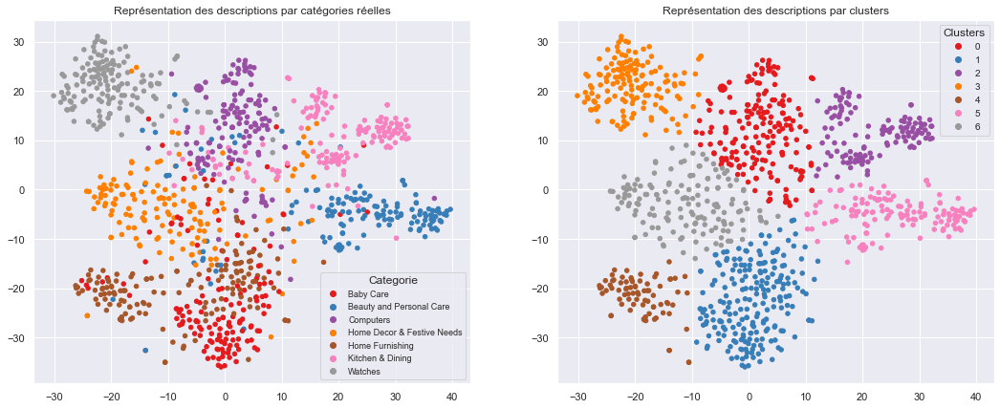

ARI :  0.5606


In [225]:
# Execute clustering with perplexity 48 (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, 48)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

### Transfer Learning with InceptionV3

In [226]:
from keras.applications.inception_v3 import preprocess_input 
# models 
from keras.applications.inception_v3 import InceptionV3

In [227]:
# load model
model = InceptionV3()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

96124928/96112376 [==============================] - 2s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                

                                                                                                  
 conv2d_11 (Conv2D)             (None, 35, 35, 32)   6144        ['average_pooling2d[0][0]']      
                                                                                                  
 batch_normalization_5 (BatchNo  (None, 35, 35, 64)  192         ['conv2d_5[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 35, 35, 64)  192         ['conv2d_7[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 35, 35, 96)  288         ['conv2d_10[0][0]']              
 ormalizat

                                                                  'activation_18[0][0]']          
                                                                                                  
 conv2d_22 (Conv2D)             (None, 35, 35, 64)   18432       ['mixed1[0][0]']                 
                                                                                                  
 batch_normalization_22 (BatchN  (None, 35, 35, 64)  192         ['conv2d_22[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_22 (Activation)     (None, 35, 35, 64)   0           ['batch_normalization_22[0][0]'] 
                                                                                                  
 conv2d_20 (Conv2D)             (None, 35, 35, 48)   13824       ['mixed1[0][0]']                 
          

 activation_26 (Activation)     (None, 17, 17, 384)  0           ['batch_normalization_26[0][0]'] 
                                                                                                  
 activation_29 (Activation)     (None, 17, 17, 96)   0           ['batch_normalization_29[0][0]'] 
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 17, 17, 288)  0          ['mixed2[0][0]']                 
                                                                                                  
 mixed3 (Concatenate)           (None, 17, 17, 768)  0           ['activation_26[0][0]',          
                                                                  'activation_29[0][0]',          
                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_34

 mixed4 (Concatenate)           (None, 17, 17, 768)  0           ['activation_30[0][0]',          
                                                                  'activation_33[0][0]',          
                                                                  'activation_38[0][0]',          
                                                                  'activation_39[0][0]']          
                                                                                                  
 conv2d_44 (Conv2D)             (None, 17, 17, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_44 (BatchN  (None, 17, 17, 160)  480        ['conv2d_44[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

 conv2d_54 (Conv2D)             (None, 17, 17, 160)  122880      ['mixed5[0][0]']                 
                                                                                                  
 batch_normalization_54 (BatchN  (None, 17, 17, 160)  480        ['conv2d_54[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_54 (Activation)     (None, 17, 17, 160)  0           ['batch_normalization_54[0][0]'] 
                                                                                                  
 conv2d_55 (Conv2D)             (None, 17, 17, 160)  179200      ['activation_54[0][0]']          
                                                                                                  
 batch_normalization_55 (BatchN  (None, 17, 17, 160)  480        ['conv2d_55[0][0]']              
 ormalizat

 activation_64 (Activation)     (None, 17, 17, 192)  0           ['batch_normalization_64[0][0]'] 
                                                                                                  
 conv2d_65 (Conv2D)             (None, 17, 17, 192)  258048      ['activation_64[0][0]']          
                                                                                                  
 batch_normalization_65 (BatchN  (None, 17, 17, 192)  576        ['conv2d_65[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_65 (Activation)     (None, 17, 17, 192)  0           ['batch_normalization_65[0][0]'] 
                                                                                                  
 conv2d_61 (Conv2D)             (None, 17, 17, 192)  147456      ['mixed6[0][0]']                 
          

 ormalization)                                                                                    
                                                                                                  
 activation_73 (Activation)     (None, 17, 17, 192)  0           ['batch_normalization_73[0][0]'] 
                                                                                                  
 conv2d_70 (Conv2D)             (None, 17, 17, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_74 (Conv2D)             (None, 17, 17, 192)  258048      ['activation_73[0][0]']          
                                                                                                  
 batch_normalization_70 (BatchN  (None, 17, 17, 192)  576        ['conv2d_70[0][0]']              
 ormalization)                                                                                    
          

                                                                                                  
 conv2d_84 (Conv2D)             (None, 8, 8, 192)    245760      ['average_pooling2d_7[0][0]']    
                                                                                                  
 batch_normalization_76 (BatchN  (None, 8, 8, 320)   960         ['conv2d_76[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_78 (Activation)     (None, 8, 8, 384)    0           ['batch_normalization_78[0][0]'] 
                                                                                                  
 activation_79 (Activation)     (None, 8, 8, 384)    0           ['batch_normalization_79[0][0]'] 
                                                                                                  
 activatio

 activation_87 (Activation)     (None, 8, 8, 384)    0           ['batch_normalization_87[0][0]'] 
                                                                                                  
 activation_88 (Activation)     (None, 8, 8, 384)    0           ['batch_normalization_88[0][0]'] 
                                                                                                  
 activation_91 (Activation)     (None, 8, 8, 384)    0           ['batch_normalization_91[0][0]'] 
                                                                                                  
 activation_92 (Activation)     (None, 8, 8, 384)    0           ['batch_normalization_92[0][0]'] 
                                                                                                  
 batch_normalization_93 (BatchN  (None, 8, 8, 192)   576         ['conv2d_93[0][0]']              
 ormalization)                                                                                    
          

In [228]:
# All the code in a single function
def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(299,299))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,299,299,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [230]:
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo,model)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 1050 samples of 2048 vectors
feat = feat.reshape(-1,2048)
feat.shape

(1050, 2048)

In [231]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

Components before PCA: (1050, 2048)
Components after PCA: (1050, 696)


In [232]:
kmeans = KMeans(n_clusters=len(unique_labels),n_jobs=-1, random_state=22)
kmeans.fit(x)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [233]:
ARI = np.round(metrics.adjusted_rand_score(true_labels, kmeans.labels_),4)
ARI

0.4876

In [234]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_InceptionV3 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_InceptionV3.append(ARI)

max_value = None
max_idx = None

for idx, num in enumerate(ARI_feat_InceptionV3):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx
        opt_perplexity = max_idx + 1

print('Maximum value:', max_value, "At index: ", max_idx)
print('Optimal perplexity = ', opt_perplexity)

ARI :  0.0894 time :  5.0
ARI :  0.3403 time :  5.0
ARI :  0.4071 time :  6.0
ARI :  0.5238 time :  5.0
ARI :  0.5462 time :  5.0
ARI :  0.485 time :  6.0
ARI :  0.4959 time :  5.0
ARI :  0.5458 time :  6.0
ARI :  0.576 time :  6.0
ARI :  0.5394 time :  5.0
ARI :  0.552 time :  5.0
ARI :  0.5458 time :  6.0
ARI :  0.5558 time :  6.0
ARI :  0.5534 time :  5.0
ARI :  0.5383 time :  6.0
ARI :  0.5375 time :  6.0
ARI :  0.556 time :  6.0
ARI :  0.5719 time :  6.0
ARI :  0.5306 time :  6.0
ARI :  0.5426 time :  7.0
ARI :  0.5492 time :  6.0
ARI :  0.5582 time :  6.0
ARI :  0.558 time :  7.0
ARI :  0.5428 time :  7.0
ARI :  0.5396 time :  7.0
ARI :  0.5411 time :  6.0
ARI :  0.5587 time :  7.0
ARI :  0.5333 time :  7.0
ARI :  0.5802 time :  7.0
ARI :  0.5482 time :  8.0
ARI :  0.5545 time :  7.0
ARI :  0.5696 time :  6.0
ARI :  0.5731 time :  8.0
ARI :  0.5547 time :  9.0
ARI :  0.5429 time :  7.0
ARI :  0.5668 time :  8.0
ARI :  0.5688 time :  9.0
ARI :  0.5763 time :  8.0
ARI :  0.5628 tim

ARI :  0.5802 time :  7.0


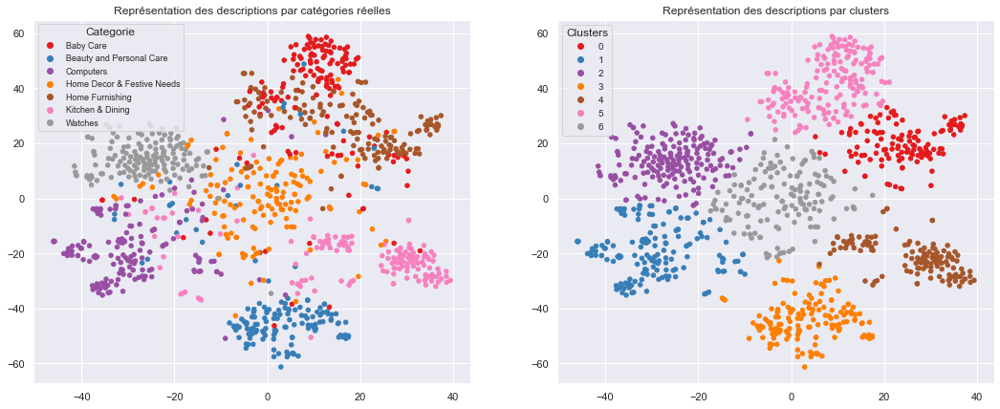

ARI :  0.5802


In [235]:
# Execute clustering with optimal perplexity (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

### Transfer Learning with InceptionResNetV2

In [236]:
from keras.applications.inception_resnet_v2 import preprocess_input 
# models 
from keras.applications.inception_resnet_v2 import InceptionResNetV2

In [237]:
# load model
model = InceptionResNetV2()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

225222656/225209952 [==============================] - 4s 0us/step
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 149, 149, 32  864         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 149, 149, 32  96         ['conv2d_94[0][0]']              
 ormalization)           

                                                                                                  
 conv2d_105 (Conv2D)            (None, 35, 35, 64)   12288       ['average_pooling2d_9[0][0]']    
                                                                                                  
 batch_normalization_99 (BatchN  (None, 35, 35, 96)  288         ['conv2d_99[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_101 (Batch  (None, 35, 35, 64)  192         ['conv2d_101[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_104 (Batch  (None, 35, 35, 96)  288         ['conv2d_104[0][0]']             
 Normaliza

 batch_normalization_115 (Batch  (None, 35, 35, 32)  96          ['conv2d_115[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_115 (Activation)    (None, 35, 35, 32)   0           ['batch_normalization_115[0][0]']
                                                                                                  
 conv2d_113 (Conv2D)            (None, 35, 35, 32)   10240       ['block35_1_ac[0][0]']           
                                                                                                  
 conv2d_116 (Conv2D)            (None, 35, 35, 48)   13824       ['activation_115[0][0]']         
                                                                                                  
 batch_normalization_113 (Batch  (None, 35, 35, 32)  96          ['conv2d_113[0][0]']             
 Normaliza

                                                                                                  
 batch_normalization_123 (Batch  (None, 35, 35, 64)  192         ['conv2d_123[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_118 (Activation)    (None, 35, 35, 32)   0           ['batch_normalization_118[0][0]']
                                                                                                  
 activation_120 (Activation)    (None, 35, 35, 32)   0           ['batch_normalization_120[0][0]']
                                                                                                  
 activation_123 (Activation)    (None, 35, 35, 64)   0           ['batch_normalization_123[0][0]']
                                                                                                  
 block35_3

 conv2d_134 (Conv2D)            (None, 35, 35, 48)   13824       ['activation_133[0][0]']         
                                                                                                  
 batch_normalization_131 (Batch  (None, 35, 35, 32)  96          ['conv2d_131[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_134 (Batch  (None, 35, 35, 48)  144         ['conv2d_134[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_131 (Activation)    (None, 35, 35, 32)   0           ['batch_normalization_131[0][0]']
                                                                                                  
 activatio

                                                                                                  
 activation_141 (Activation)    (None, 35, 35, 64)   0           ['batch_normalization_141[0][0]']
                                                                                                  
 block35_6_mixed (Concatenate)  (None, 35, 35, 128)  0           ['activation_136[0][0]',         
                                                                  'activation_138[0][0]',         
                                                                  'activation_141[0][0]']         
                                                                                                  
 block35_6_conv (Conv2D)        (None, 35, 35, 320)  41280       ['block35_6_mixed[0][0]']        
                                                                                                  
 block35_6 (Lambda)             (None, 35, 35, 320)  0           ['block35_5_ac[0][0]',           
          

                                                                                                  
 activation_149 (Activation)    (None, 35, 35, 32)   0           ['batch_normalization_149[0][0]']
                                                                                                  
 activation_152 (Activation)    (None, 35, 35, 48)   0           ['batch_normalization_152[0][0]']
                                                                                                  
 conv2d_148 (Conv2D)            (None, 35, 35, 32)   10240       ['block35_7_ac[0][0]']           
                                                                                                  
 conv2d_150 (Conv2D)            (None, 35, 35, 32)   9216        ['activation_149[0][0]']         
                                                                                                  
 conv2d_153 (Conv2D)            (None, 35, 35, 64)   27648       ['activation_152[0][0]']         
          

 block35_9_conv (Conv2D)        (None, 35, 35, 320)  41280       ['block35_9_mixed[0][0]']        
                                                                                                  
 block35_9 (Lambda)             (None, 35, 35, 320)  0           ['block35_8_ac[0][0]',           
                                                                  'block35_9_conv[0][0]']         
                                                                                                  
 block35_9_ac (Activation)      (None, 35, 35, 320)  0           ['block35_9[0][0]']              
                                                                                                  
 conv2d_163 (Conv2D)            (None, 35, 35, 32)   10240       ['block35_9_ac[0][0]']           
                                                                                                  
 batch_normalization_163 (Batch  (None, 35, 35, 32)  96          ['conv2d_163[0][0]']             
 Normaliza

                                                                                                  
 activation_166 (Activation)    (None, 17, 17, 384)  0           ['batch_normalization_166[0][0]']
                                                                                                  
 activation_169 (Activation)    (None, 17, 17, 384)  0           ['batch_normalization_169[0][0]']
                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, 17, 17, 320)  0          ['block35_10_ac[0][0]']          
                                                                                                  
 mixed_6a (Concatenate)         (None, 17, 17, 1088  0           ['activation_166[0][0]',         
                                )                                 'activation_169[0][0]',         
                                                                  'max_pooling2d_6[0][0]']        
          

                                )                                                                 
                                                                                                  
 block17_2 (Lambda)             (None, 17, 17, 1088  0           ['block17_1_ac[0][0]',           
                                )                                 'block17_2_conv[0][0]']         
                                                                                                  
 block17_2_ac (Activation)      (None, 17, 17, 1088  0           ['block17_2[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_179 (Conv2D)            (None, 17, 17, 128)  139264      ['block17_2_ac[0][0]']           
                                                                                                  
 batch_nor

                                )                                 'block17_4_conv[0][0]']         
                                                                                                  
 block17_4_ac (Activation)      (None, 17, 17, 1088  0           ['block17_4[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_187 (Conv2D)            (None, 17, 17, 128)  139264      ['block17_4_ac[0][0]']           
                                                                                                  
 batch_normalization_187 (Batch  (None, 17, 17, 128)  384        ['conv2d_187[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

                                )                                                                 
                                                                                                  
 conv2d_195 (Conv2D)            (None, 17, 17, 128)  139264      ['block17_6_ac[0][0]']           
                                                                                                  
 batch_normalization_195 (Batch  (None, 17, 17, 128)  384        ['conv2d_195[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_195 (Activation)    (None, 17, 17, 128)  0           ['batch_normalization_195[0][0]']
                                                                                                  
 conv2d_196 (Conv2D)            (None, 17, 17, 160)  143360      ['activation_195[0][0]']         
          

                                                                                                  
 batch_normalization_203 (Batch  (None, 17, 17, 128)  384        ['conv2d_203[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_203 (Activation)    (None, 17, 17, 128)  0           ['batch_normalization_203[0][0]']
                                                                                                  
 conv2d_204 (Conv2D)            (None, 17, 17, 160)  143360      ['activation_203[0][0]']         
                                                                                                  
 batch_normalization_204 (Batch  (None, 17, 17, 160)  480        ['conv2d_204[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 activation_211 (Activation)    (None, 17, 17, 128)  0           ['batch_normalization_211[0][0]']
                                                                                                  
 conv2d_212 (Conv2D)            (None, 17, 17, 160)  143360      ['activation_211[0][0]']         
                                                                                                  
 batch_normalization_212 (Batch  (None, 17, 17, 160)  480        ['conv2d_212[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_212 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_212[0][0]']
                                                                                                  
 conv2d_21

 conv2d_220 (Conv2D)            (None, 17, 17, 160)  143360      ['activation_219[0][0]']         
                                                                                                  
 batch_normalization_220 (Batch  (None, 17, 17, 160)  480        ['conv2d_220[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_220 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_220[0][0]']
                                                                                                  
 conv2d_218 (Conv2D)            (None, 17, 17, 192)  208896      ['block17_12_ac[0][0]']          
                                                                                                  
 conv2d_221 (Conv2D)            (None, 17, 17, 192)  215040      ['activation_220[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_228 (Activation)    (None, 17, 17, 160)  0           ['batch_normalization_228[0][0]']
                                                                                                  
 conv2d_226 (Conv2D)            (None, 17, 17, 192)  208896      ['block17_14_ac[0][0]']          
                                                                                                  
 conv2d_229 (Conv2D)            (None, 17, 17, 192)  215040      ['activation_228[0][0]']         
                                                                                                  
 batch_normalization_226 (Batch  (None, 17, 17, 192)  576        ['conv2d_226[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_234 (Conv2D)            (None, 17, 17, 192)  208896      ['block17_16_ac[0][0]']          
                                                                                                  
 conv2d_237 (Conv2D)            (None, 17, 17, 192)  215040      ['activation_236[0][0]']         
                                                                                                  
 batch_normalization_234 (Batch  (None, 17, 17, 192)  576        ['conv2d_234[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_237 (Batch  (None, 17, 17, 192)  576        ['conv2d_237[0][0]']             
 Normalization)                                                                                   
          

 conv2d_245 (Conv2D)            (None, 17, 17, 192)  215040      ['activation_244[0][0]']         
                                                                                                  
 batch_normalization_242 (Batch  (None, 17, 17, 192)  576        ['conv2d_242[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_245 (Batch  (None, 17, 17, 192)  576        ['conv2d_245[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_242 (Activation)    (None, 17, 17, 192)  0           ['batch_normalization_242[0][0]']
                                                                                                  
 activatio

 batch_normalization_255 (Batch  (None, 17, 17, 288)  864        ['conv2d_255[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_250 (Activation)    (None, 17, 17, 256)  0           ['batch_normalization_250[0][0]']
                                                                                                  
 activation_252 (Activation)    (None, 17, 17, 256)  0           ['batch_normalization_252[0][0]']
                                                                                                  
 activation_255 (Activation)    (None, 17, 17, 288)  0           ['batch_normalization_255[0][0]']
                                                                                                  
 conv2d_251 (Conv2D)            (None, 8, 8, 384)    884736      ['activation_250[0][0]']         
          

                                                                                                  
 batch_normalization_263 (Batch  (None, 8, 8, 224)   672         ['conv2d_263[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_263 (Activation)    (None, 8, 8, 224)    0           ['batch_normalization_263[0][0]']
                                                                                                  
 conv2d_261 (Conv2D)            (None, 8, 8, 192)    399360      ['block8_1_ac[0][0]']            
                                                                                                  
 conv2d_264 (Conv2D)            (None, 8, 8, 256)    172032      ['activation_263[0][0]']         
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_272 (Conv2D)            (None, 8, 8, 256)    172032      ['activation_271[0][0]']         
                                                                                                  
 batch_normalization_269 (Batch  (None, 8, 8, 192)   576         ['conv2d_269[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_272 (Batch  (None, 8, 8, 256)   768         ['conv2d_272[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_269 (Activation)    (None, 8, 8, 192)    0           ['batch_normalization_269[0][0]']
          

 Normalization)                                                                                   
                                                                                                  
 activation_277 (Activation)    (None, 8, 8, 192)    0           ['batch_normalization_277[0][0]']
                                                                                                  
 activation_280 (Activation)    (None, 8, 8, 256)    0           ['batch_normalization_280[0][0]']
                                                                                                  
 block8_6_mixed (Concatenate)   (None, 8, 8, 448)    0           ['activation_277[0][0]',         
                                                                  'activation_280[0][0]']         
                                                                                                  
 block8_6_conv (Conv2D)         (None, 8, 8, 2080)   933920      ['block8_6_mixed[0][0]']         
          

                                                                  'activation_288[0][0]']         
                                                                                                  
 block8_8_conv (Conv2D)         (None, 8, 8, 2080)   933920      ['block8_8_mixed[0][0]']         
                                                                                                  
 block8_8 (Lambda)              (None, 8, 8, 2080)   0           ['block8_7_ac[0][0]',            
                                                                  'block8_8_conv[0][0]']          
                                                                                                  
 block8_8_ac (Activation)       (None, 8, 8, 2080)   0           ['block8_8[0][0]']               
                                                                                                  
 conv2d_290 (Conv2D)            (None, 8, 8, 192)    399360      ['block8_8_ac[0][0]']            
          

 conv_7b (Conv2D)               (None, 8, 8, 1536)   3194880     ['block8_10[0][0]']              
                                                                                                  
 conv_7b_bn (BatchNormalization  (None, 8, 8, 1536)  4608        ['conv_7b[0][0]']                
 )                                                                                                
                                                                                                  
 conv_7b_ac (Activation)        (None, 8, 8, 1536)   0           ['conv_7b_bn[0][0]']             
                                                                                                  
 avg_pool (GlobalAveragePooling  (None, 1536)        0           ['conv_7b_ac[0][0]']             
 2D)                                                                                              
                                                                                                  
Total para

In [238]:
# All the code in a single function
def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(299,299))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,299,299,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [239]:
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo,model)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 1050 samples of 1536 vectors
feat = feat.reshape(-1,1536)
feat.shape

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(1050, 1536)

In [240]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

Components before PCA: (1050, 1536)
Components after PCA: (1050, 508)


In [245]:
kmeans = KMeans(n_clusters=len(unique_labels),n_jobs=-1, random_state=22)
kmeans.fit(x)

C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [246]:
ARI = np.round(metrics.adjusted_rand_score(true_labels, kmeans.labels_),4)
ARI

0.4066

In [243]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_InceptionResNetV2 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_InceptionResNetV2.append(ARI)

max_value = None
max_idx = None

for idx, num in enumerate(ARI_feat_InceptionResNetV2):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx
        opt_perplexity = max_idx + 1

print('Maximum value:', max_value, "At index: ", max_idx)
print('Optimal perplexity = ', opt_perplexity)

ARI :  0.0684 time :  5.0
ARI :  0.3322 time :  5.0
ARI :  0.4142 time :  5.0
ARI :  0.4943 time :  6.0
ARI :  0.51 time :  6.0
ARI :  0.598 time :  5.0
ARI :  0.5234 time :  5.0
ARI :  0.5738 time :  5.0
ARI :  0.6007 time :  5.0
ARI :  0.5838 time :  5.0
ARI :  0.541 time :  6.0
ARI :  0.5739 time :  5.0
ARI :  0.5763 time :  5.0
ARI :  0.5712 time :  6.0
ARI :  0.6202 time :  5.0
ARI :  0.5338 time :  5.0
ARI :  0.5829 time :  6.0
ARI :  0.5984 time :  6.0
ARI :  0.59 time :  6.0
ARI :  0.5716 time :  6.0
ARI :  0.5528 time :  6.0
ARI :  0.5426 time :  6.0
ARI :  0.5843 time :  6.0
ARI :  0.5814 time :  6.0
ARI :  0.558 time :  6.0
ARI :  0.5624 time :  6.0
ARI :  0.6244 time :  6.0
ARI :  0.5812 time :  7.0
ARI :  0.5655 time :  7.0
ARI :  0.5919 time :  9.0
ARI :  0.553 time :  8.0
ARI :  0.617 time :  7.0
ARI :  0.5714 time :  7.0
ARI :  0.6005 time :  8.0
ARI :  0.531 time :  7.0
ARI :  0.5618 time :  8.0
ARI :  0.5858 time :  8.0
ARI :  0.5896 time :  8.0
ARI :  0.5817 time :  

ARI :  0.6244 time :  6.0


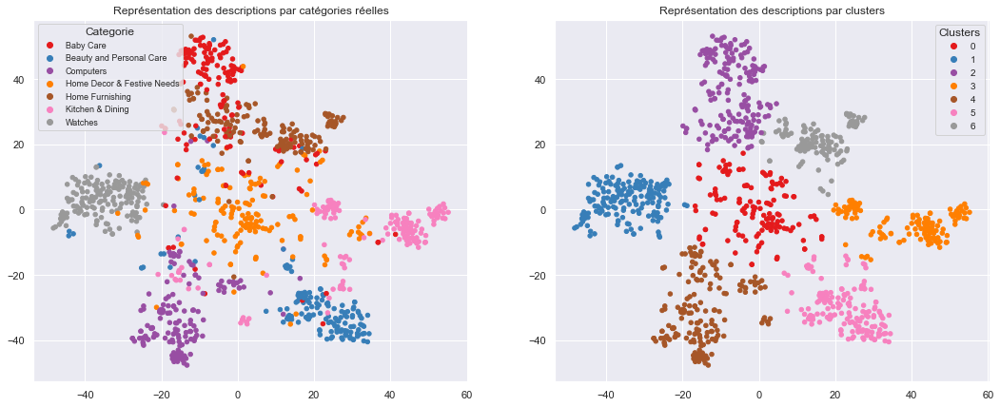

ARI :  0.6244


In [244]:
# Execute clustering with optimal perplexity (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

### Transfer Learning with EfficientNet

In [251]:
from tensorflow.keras.applications import EfficientNetB0

In [252]:
from tensorflow.keras.applications import EfficientNetB0
# load model
model = EfficientNetB0()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

21848064/21834768 [==============================] - 1s 0us/step
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_7[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (ZeroPadding

 block2a_project_conv (Conv2D)  (None, 56, 56, 24)   2304        ['block2a_se_excite[0][0]']      
                                                                                                  
 block2a_project_bn (BatchNorma  (None, 56, 56, 24)  96          ['block2a_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2b_expand_conv (Conv2D)   (None, 56, 56, 144)  3456        ['block2a_project_bn[0][0]']     
                                                                                                  
 block2b_expand_bn (BatchNormal  (None, 56, 56, 144)  576        ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_e

 block3b_expand_bn (BatchNormal  (None, 28, 28, 240)  960        ['block3b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3b_expand_activation (Act  (None, 28, 28, 240)  0          ['block3b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3b_dwconv (DepthwiseConv2  (None, 28, 28, 240)  6000       ['block3b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, 28, 28, 240)  960        ['block3b_dwconv[0][0]']         
 )        

 D)                                                              ']                               
                                                                                                  
 block4b_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block4b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block4b_activation (Activation  (None, 14, 14, 480)  0          ['block4b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
          

 block5a_activation (Activation  (None, 14, 14, 480)  0          ['block5a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5a_se_squeeze (GlobalAver  (None, 480)         0           ['block5a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     
                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_s

 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      
                                                                                                  
 block5c_se_excite (Multiply)   (None, 14, 14, 672)  0           ['block5c_activation[0][0]',     
                                                                  'block5c_se_expand[0][0]']      
                                                                                                  
 block5c_project_conv (Conv2D)  (None, 14, 14, 112)  75264       ['block5c_se_excite[0][0]']      
                                                                                                  
 block5c_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5c_d

 block6b_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6b_drop (Dropout)         (None, 7, 7, 192)    0           ['block6b_project_bn[0][0]']     
                                                                                                  
 block6b_add (Add)              (None, 7, 7, 192)    0           ['block6b_drop[0][0]',           
                                                                  'block6a_project_bn[0][0]']     
                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6b_add[0][0]']            
                                                                                                  
 block6c_e

 block6d_add (Add)              (None, 7, 7, 192)    0           ['block6d_drop[0][0]',           
                                                                  'block6c_add[0][0]']            
                                                                                                  
 block7a_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6d_add[0][0]']            
                                                                                                  
 block7a_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block7a_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7a_expand_activation (Act  (None, 7, 7, 1152)  0           ['block7a_expand_bn[0][0]']      
 ivation)                                                                                         
          

In [255]:
# All the code in a single function
def extract_features(file, model, target_size):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(target_size,target_size))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,target_size,target_size,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [256]:
target_size = 224
final_vectors = 1280
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo, model, target_size)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 1050 samples of 1280 vectors
feat = feat.reshape(-1,final_vectors)
feat.shape

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(1050, 1280)

In [257]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

kmeans = KMeans(n_clusters=len(unique_labels), random_state=22)
kmeans.fit(x)

Components before PCA: (1050, 1280)
Components after PCA: (1050, 3)


C:\Users\33624\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


KMeans(n_clusters=7, n_jobs=-1, random_state=22)

In [258]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_EfficientNetB0 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_EfficientNetB0.append(ARI)

max_value = None
max_idx = None

for idx, num in enumerate(ARI_feat_EfficientNetB0):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx
        opt_perplexity = max_idx + 1

print('Maximum value:', max_value, "At index: ", max_idx)
print('Optimal perplexity = ', opt_perplexity)

ARI :  0.0019 time :  5.0
ARI :  0.0021 time :  5.0
ARI :  0.0093 time :  5.0
ARI :  0.0106 time :  5.0
ARI :  0.0136 time :  5.0
ARI :  0.008 time :  5.0
ARI :  0.0129 time :  4.0
ARI :  0.0098 time :  5.0
ARI :  0.0062 time :  5.0
ARI :  0.0125 time :  5.0
ARI :  0.0126 time :  5.0
ARI :  0.0109 time :  5.0
ARI :  0.0128 time :  5.0
ARI :  0.0129 time :  5.0
ARI :  0.0137 time :  5.0
ARI :  0.0132 time :  5.0
ARI :  0.0117 time :  5.0
ARI :  0.0107 time :  5.0
ARI :  0.0117 time :  5.0
ARI :  0.011 time :  5.0
ARI :  0.0113 time :  5.0
ARI :  0.0113 time :  5.0
ARI :  0.0137 time :  5.0
ARI :  0.0118 time :  5.0
ARI :  0.0115 time :  6.0
ARI :  0.0115 time :  5.0
ARI :  0.0117 time :  5.0
ARI :  0.0112 time :  5.0
ARI :  0.0118 time :  5.0
ARI :  0.0115 time :  5.0
ARI :  0.0113 time :  6.0
ARI :  0.0114 time :  6.0
ARI :  0.0116 time :  5.0
ARI :  0.0112 time :  6.0
ARI :  0.0114 time :  6.0
ARI :  0.0114 time :  6.0
ARI :  0.0133 time :  6.0
ARI :  0.0132 time :  6.0
ARI :  0.0129 

ARI :  0.0137 time :  5.0


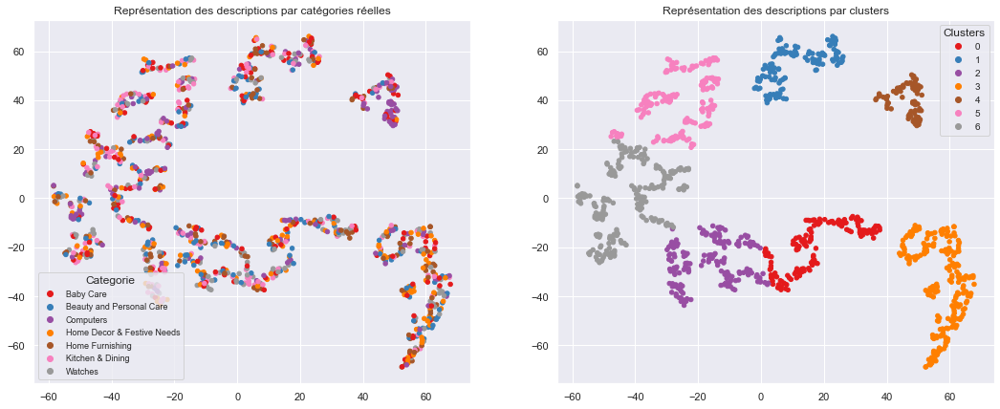

ARI :  0.0137


In [259]:
# Execute clustering with optimal perplexity (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [260]:
from tensorflow.keras.applications import EfficientNetB4
# load model
model = EfficientNetB4()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

78880768/78864416 [==============================] - 2s 0us/step
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 380, 380, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 380, 380, 3)  0           ['input_8[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 380, 380, 3)  7          ['rescaling_1[0][0]']            
 )                                                                                                
                           

                                                                                                  
 block2a_expand_conv (Conv2D)   (None, 190, 190, 14  3456        ['block1b_add[0][0]']            
                                4)                                                                
                                                                                                  
 block2a_expand_bn (BatchNormal  (None, 190, 190, 14  576        ['block2a_expand_conv[0][0]']    
 ization)                       4)                                                                
                                                                                                  
 block2a_expand_activation (Act  (None, 190, 190, 14  0          ['block2a_expand_bn[0][0]']      
 ivation)                       4)                                                                
                                                                                                  
 block2a_d

 block2c_expand_activation (Act  (None, 95, 95, 192)  0          ['block2c_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block2c_dwconv (DepthwiseConv2  (None, 95, 95, 192)  1728       ['block2c_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block2c_bn (BatchNormalization  (None, 95, 95, 192)  768        ['block2c_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block2c_activation (Activation  (None, 95, 95, 192)  0          ['block2c_bn[0][0]']             
 )        

                                                                                                  
 block3a_dwconv (DepthwiseConv2  (None, 48, 48, 192)  4800       ['block3a_dwconv_pad[0][0]']     
 D)                                                                                               
                                                                                                  
 block3a_bn (BatchNormalization  (None, 48, 48, 192)  768        ['block3a_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block3a_activation (Activation  (None, 48, 48, 192)  0          ['block3a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block3a_s

 block3c_se_squeeze (GlobalAver  (None, 336)         0           ['block3c_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block3c_se_reshape (Reshape)   (None, 1, 1, 336)    0           ['block3c_se_squeeze[0][0]']     
                                                                                                  
 block3c_se_reduce (Conv2D)     (None, 1, 1, 14)     4718        ['block3c_se_reshape[0][0]']     
                                                                                                  
 block3c_se_expand (Conv2D)     (None, 1, 1, 336)    5040        ['block3c_se_reduce[0][0]']      
                                                                                                  
 block3c_se_excite (Multiply)   (None, 48, 48, 336)  0           ['block3c_activation[0][0]',     
          

                                                                                                  
 block4a_se_reshape (Reshape)   (None, 1, 1, 336)    0           ['block4a_se_squeeze[0][0]']     
                                                                                                  
 block4a_se_reduce (Conv2D)     (None, 1, 1, 14)     4718        ['block4a_se_reshape[0][0]']     
                                                                                                  
 block4a_se_expand (Conv2D)     (None, 1, 1, 336)    5040        ['block4a_se_reduce[0][0]']      
                                                                                                  
 block4a_se_excite (Multiply)   (None, 24, 24, 336)  0           ['block4a_activation[0][0]',     
                                                                  'block4a_se_expand[0][0]']      
                                                                                                  
 block4a_p

 block4c_project_conv (Conv2D)  (None, 24, 24, 112)  75264       ['block4c_se_excite[0][0]']      
                                                                                                  
 block4c_project_bn (BatchNorma  (None, 24, 24, 112)  448        ['block4c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block4c_drop (Dropout)         (None, 24, 24, 112)  0           ['block4c_project_bn[0][0]']     
                                                                                                  
 block4c_add (Add)              (None, 24, 24, 112)  0           ['block4c_drop[0][0]',           
                                                                  'block4b_add[0][0]']            
                                                                                                  
 block4d_e

 block4e_drop (Dropout)         (None, 24, 24, 112)  0           ['block4e_project_bn[0][0]']     
                                                                                                  
 block4e_add (Add)              (None, 24, 24, 112)  0           ['block4e_drop[0][0]',           
                                                                  'block4d_add[0][0]']            
                                                                                                  
 block4f_expand_conv (Conv2D)   (None, 24, 24, 672)  75264       ['block4e_add[0][0]']            
                                                                                                  
 block4f_expand_bn (BatchNormal  (None, 24, 24, 672)  2688       ['block4f_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block4f_e

 block5b_expand_activation (Act  (None, 24, 24, 960)  0          ['block5b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block5b_dwconv (DepthwiseConv2  (None, 24, 24, 960)  24000      ['block5b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block5b_bn (BatchNormalization  (None, 24, 24, 960)  3840       ['block5b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block5b_activation (Activation  (None, 24, 24, 960)  0          ['block5b_bn[0][0]']             
 )        

                                                                                                  
 block5d_bn (BatchNormalization  (None, 24, 24, 960)  3840       ['block5d_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block5d_activation (Activation  (None, 24, 24, 960)  0          ['block5d_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5d_se_squeeze (GlobalAver  (None, 960)         0           ['block5d_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5d_s

 )                                                                                                
                                                                                                  
 block5f_se_squeeze (GlobalAver  (None, 960)         0           ['block5f_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5f_se_reshape (Reshape)   (None, 1, 1, 960)    0           ['block5f_se_squeeze[0][0]']     
                                                                                                  
 block5f_se_reduce (Conv2D)     (None, 1, 1, 40)     38440       ['block5f_se_reshape[0][0]']     
                                                                                                  
 block5f_se_expand (Conv2D)     (None, 1, 1, 960)    39360       ['block5f_se_reduce[0][0]']      
          

                                                                                                  
 block6b_se_reduce (Conv2D)     (None, 1, 1, 68)     111044      ['block6b_se_reshape[0][0]']     
                                                                                                  
 block6b_se_expand (Conv2D)     (None, 1, 1, 1632)   112608      ['block6b_se_reduce[0][0]']      
                                                                                                  
 block6b_se_excite (Multiply)   (None, 12, 12, 1632  0           ['block6b_activation[0][0]',     
                                )                                 'block6b_se_expand[0][0]']      
                                                                                                  
 block6b_project_conv (Conv2D)  (None, 12, 12, 272)  443904      ['block6b_se_excite[0][0]']      
                                                                                                  
 block6b_p

 block6d_se_expand (Conv2D)     (None, 1, 1, 1632)   112608      ['block6d_se_reduce[0][0]']      
                                                                                                  
 block6d_se_excite (Multiply)   (None, 12, 12, 1632  0           ['block6d_activation[0][0]',     
                                )                                 'block6d_se_expand[0][0]']      
                                                                                                  
 block6d_project_conv (Conv2D)  (None, 12, 12, 272)  443904      ['block6d_se_excite[0][0]']      
                                                                                                  
 block6d_project_bn (BatchNorma  (None, 12, 12, 272)  1088       ['block6d_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6d_d

                                )                                 'block6f_se_expand[0][0]']      
                                                                                                  
 block6f_project_conv (Conv2D)  (None, 12, 12, 272)  443904      ['block6f_se_excite[0][0]']      
                                                                                                  
 block6f_project_bn (BatchNorma  (None, 12, 12, 272)  1088       ['block6f_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6f_drop (Dropout)         (None, 12, 12, 272)  0           ['block6f_project_bn[0][0]']     
                                                                                                  
 block6f_add (Add)              (None, 12, 12, 272)  0           ['block6f_drop[0][0]',           
          

                                                                                                  
 block6h_project_bn (BatchNorma  (None, 12, 12, 272)  1088       ['block6h_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6h_drop (Dropout)         (None, 12, 12, 272)  0           ['block6h_project_bn[0][0]']     
                                                                                                  
 block6h_add (Add)              (None, 12, 12, 272)  0           ['block6h_drop[0][0]',           
                                                                  'block6g_add[0][0]']            
                                                                                                  
 block7a_expand_conv (Conv2D)   (None, 12, 12, 1632  443904      ['block6h_add[0][0]']            
          

                                                                                                  
 top_conv (Conv2D)              (None, 12, 12, 1792  802816      ['block7b_add[0][0]']            
                                )                                                                 
                                                                                                  
 top_bn (BatchNormalization)    (None, 12, 12, 1792  7168        ['top_conv[0][0]']               
                                )                                                                 
                                                                                                  
 top_activation (Activation)    (None, 12, 12, 1792  0           ['top_bn[0][0]']                 
                                )                                                                 
                                                                                                  
 avg_pool 

In [261]:
target_size = 380
final_vectors = 1792
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo, model, target_size)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of the filenames
filenames = np.array(list(data_photos.keys()))

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 1050 samples of 1280 vectors
feat = feat.reshape(-1,final_vectors)
feat.shape

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(1050, 1792)

In [262]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

kmeans = KMeans(n_clusters=len(unique_labels), random_state=22)
kmeans.fit(x)

Components before PCA: (1050, 1792)
Components after PCA: (1050, 17)


KMeans(n_clusters=7, random_state=22)

In [263]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_feat_EfficientNetB4 = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_feat_EfficientNetB4.append(ARI)

max_value = None
max_idx = None

for idx, num in enumerate(ARI_feat_EfficientNetB4):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx
        opt_perplexity = max_idx + 1

print('Maximum value:', max_value, "At index: ", max_idx)
print('Optimal perplexity = ', opt_perplexity)

ARI :  0.0084 time :  5.0
ARI :  0.0276 time :  6.0
ARI :  0.0297 time :  6.0
ARI :  0.0313 time :  6.0
ARI :  0.0278 time :  6.0
ARI :  0.0296 time :  7.0
ARI :  0.022 time :  6.0
ARI :  0.0319 time :  6.0
ARI :  0.0322 time :  6.0
ARI :  0.032 time :  6.0
ARI :  0.0274 time :  5.0
ARI :  0.032 time :  5.0
ARI :  0.0315 time :  6.0
ARI :  0.029 time :  6.0
ARI :  0.024 time :  6.0
ARI :  0.029 time :  6.0
ARI :  0.0309 time :  6.0
ARI :  0.0295 time :  6.0
ARI :  0.0259 time :  6.0
ARI :  0.0272 time :  7.0
ARI :  0.0197 time :  8.0
ARI :  0.0276 time :  7.0
ARI :  0.0297 time :  6.0
ARI :  0.0254 time :  6.0
ARI :  0.0248 time :  6.0
ARI :  0.0283 time :  7.0
ARI :  0.027 time :  6.0
ARI :  0.0276 time :  6.0
ARI :  0.0289 time :  7.0
ARI :  0.0258 time :  7.0
ARI :  0.0235 time :  7.0
ARI :  0.0231 time :  9.0
ARI :  0.0245 time :  8.0
ARI :  0.0262 time :  8.0
ARI :  0.0254 time :  7.0
ARI :  0.0331 time :  8.0
ARI :  0.0198 time :  8.0
ARI :  0.0278 time :  9.0
ARI :  0.0176 time 

ARI :  0.0331 time :  9.0


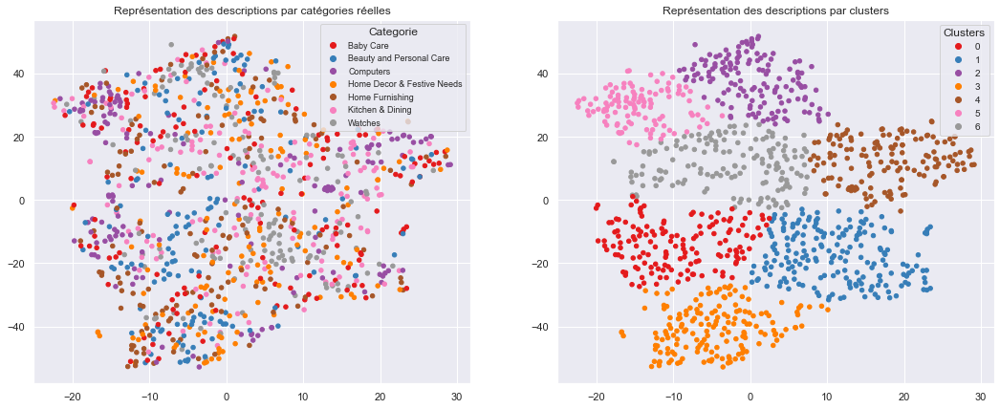

ARI :  0.0331


In [265]:
# Execute clustering with optimal perplexity (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

### Transfer Learning with NASNetLarge

In [280]:
from tensorflow.keras.applications import NASNetLarge
# load model
model = NASNetLarge()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 331, 331, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 165, 165, 96  2592        ['input_11[0][0]']               
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 165, 165, 96  384         ['stem_conv1[0][0]']             
                                )                                                          

                                                                                                  
 separable_conv_1_pad_reduction  (None, 169, 169, 96  0          ['activation_752[0][0]']         
 _right3_stem_1 (ZeroPadding2D)  )                                                                
                                                                                                  
 activation_754 (Activation)    (None, 83, 83, 42)   0           ['reduction_add_1_stem_1[0][0]'] 
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 83, 83, 42)  168         ['separable_conv_1_reduction_righ
 right2_stem_1 (BatchNormalizat                                  t2_stem_1[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable

 add_8 (Add)                    (None, 83, 83, 42)   0           ['reduction_add_2_stem_1[0][0]', 
                                                                  'reduction_left4_stem_1[0][0]'] 
                                                                                                  
 reduction_add4_stem_1 (Add)    (None, 83, 83, 42)   0           ['separable_conv_2_bn_reduction_l
                                                                 eft4_stem_1[0][0]',              
                                                                  'reduction_right5_stem_1[0][0]']
                                                                                                  
 cropping2d_8 (Cropping2D)      (None, 165, 165, 96  0           ['zero_padding2d_8[0][0]']       
                                )                                                                 
                                                                                                  
 reduction

 separable_conv_2_bn_reduction_  (None, 42, 42, 84)  336         ['separable_conv_2_reduction_righ
 right1_stem_2 (BatchNormalizat                                  t1_stem_2[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable_conv_1_pad_reduction  (None, 89, 89, 84)  0           ['activation_761[0][0]']         
 _right2_stem_2 (ZeroPadding2D)                                                                   
                                                                                                  
 activation_763 (Activation)    (None, 83, 83, 84)   0           ['adjust_bn_stem_2[0][0]']       
                                                                                                  
 reduction_add_1_stem_2 (Add)   (None, 42, 42, 84)   0           ['separable_conv_2_bn_reduction_l
          

                                                                                                  
 separable_conv_2_bn_reduction_  (None, 42, 42, 84)  336         ['separable_conv_2_reduction_left
 left4_stem_2 (BatchNormalizati                                  4_stem_2[0][0]']                 
 on)                                                                                              
                                                                                                  
 reduction_right5_stem_2 (MaxPo  (None, 42, 42, 84)  0           ['reduction_pad_1_stem_2[0][0]'] 
 oling2D)                                                                                         
                                                                                                  
 zero_padding2d_9 (ZeroPadding2  (None, 84, 84, 168)  0          ['adjust_relu_1_0[0][0]']        
 D)                                                                                               
          

 separable_conv_1_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_1_normal_left2_0
 t2_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 42, 42, 168)  672        ['separable_conv_1_normal_right2_
 ht2_0 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_1_normal_left5_0
 t5_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_769 (Activation)    (None, 42, 42, 168)  0           ['separable_conv_1_bn_normal_left
          

 normal_concat_0 (Concatenate)  (None, 42, 42, 1008  0           ['adjust_bn_0[0][0]',            
                                )                                 'normal_add_1_0[0][0]',         
                                                                  'normal_add_2_0[0][0]',         
                                                                  'normal_add_3_0[0][0]',         
                                                                  'normal_add_4_0[0][0]',         
                                                                  'normal_add_5_0[0][0]']         
                                                                                                  
 activation_778 (Activation)    (None, 42, 42, 336)  0           ['reduction_concat_stem_2[0][0]']
                                                                                                  
 activation_779 (Activation)    (None, 42, 42, 1008  0           ['normal_concat_0[0][0]']        
          

                                                                                                  
 separable_conv_2_normal_left2_  (None, 42, 42, 168)  32424      ['activation_785[0][0]']         
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 42, 42, 168)  29736      ['activation_787[0][0]']         
 _1 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 42, 42, 168)  29736      ['activation_789[0][0]']         
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable

                                                                                                  
 activation_798 (Activation)    (None, 42, 42, 168)  0           ['adjust_bn_2[0][0]']            
                                                                                                  
 activation_800 (Activation)    (None, 42, 42, 168)  0           ['normal_bn_1_2[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 42, 42, 168)  32424      ['activation_792[0][0]']         
 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right1  (None, 42, 42, 168)  29736      ['activation_794[0][0]']         
 _2 (SeparableConv2D)                                                                             
          

 normal_right4_2 (AveragePoolin  (None, 42, 42, 168)  0          ['adjust_bn_2[0][0]']            
 g2D)                                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_2_normal_left5_2
 t5_2 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_2 (Add)           (None, 42, 42, 168)  0           ['separable_conv_2_bn_normal_left
                                                                 1_2[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_2[0][0]']                     
          

                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 42, 42, 168)  672        ['separable_conv_1_normal_right2_
 ht2_3 (BatchNormalization)                                      3[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_1_normal_left5_3
 t5_3 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_805 (Activation)    (None, 42, 42, 168)  0           ['separable_conv_1_bn_normal_left
                                                                 1_3[0][0]']                      
                                                                                                  
 activatio

                                                                  'normal_add_2_3[0][0]',         
                                                                  'normal_add_3_3[0][0]',         
                                                                  'normal_add_4_3[0][0]',         
                                                                  'normal_add_5_3[0][0]']         
                                                                                                  
 activation_814 (Activation)    (None, 42, 42, 1008  0           ['normal_concat_2[0][0]']        
                                )                                                                 
                                                                                                  
 activation_815 (Activation)    (None, 42, 42, 1008  0           ['normal_concat_3[0][0]']        
                                )                                                                 
          

 separable_conv_2_normal_left2_  (None, 42, 42, 168)  32424      ['activation_821[0][0]']         
 4 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 42, 42, 168)  29736      ['activation_823[0][0]']         
 _4 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 42, 42, 168)  29736      ['activation_825[0][0]']         
 4 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_2_normal_left1_4
 t1_4 (Bat

 activation_834 (Activation)    (None, 42, 42, 168)  0           ['adjust_bn_5[0][0]']            
                                                                                                  
 activation_836 (Activation)    (None, 42, 42, 168)  0           ['normal_bn_1_5[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 42, 42, 168)  32424      ['activation_828[0][0]']         
 5 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right1  (None, 42, 42, 168)  29736      ['activation_830[0][0]']         
 _5 (SeparableConv2D)                                                                             
                                                                                                  
 separable

 g2D)                                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 42, 42, 168)  672        ['separable_conv_2_normal_left5_5
 t5_5 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_5 (Add)           (None, 42, 42, 168)  0           ['separable_conv_2_bn_normal_left
                                                                 1_5[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_5[0][0]']                     
                                                                                                  
 normal_ad

 t1_reduce_6 (SeparableConv2D)                                                                    
                                                                                                  
 separable_conv_2_reduction_rig  (None, 21, 21, 336)  129360     ['activation_843[0][0]']         
 ht1_reduce_6 (SeparableConv2D)                                                                   
                                                                                                  
 activation_844 (Activation)    (None, 42, 42, 336)  0           ['adjust_bn_reduce_6[0][0]']     
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 21, 21, 336)  1344       ['separable_conv_2_reduction_left
 left1_reduce_6 (BatchNormaliza                                  1_reduce_6[0][0]']               
 tion)                                                                                            
          

                                )                                                                 
                                                                                                  
 reduction_add_2_reduce_6 (Add)  (None, 21, 21, 336)  0          ['reduction_left2_reduce_6[0][0]'
                                                                 , 'separable_conv_2_bn_reduction_
                                                                 right2_reduce_6[0][0]']          
                                                                                                  
 reduction_left3_reduce_6 (Aver  (None, 21, 21, 336)  0          ['reduction_pad_1_reduce_6[0][0]'
 agePooling2D)                                                   ]                                
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 21, 21, 336)  1344       ['separable_conv_2_reduction_righ
 right3_re

                                                                                                  
 separable_conv_1_normal_right1  (None, 21, 21, 336)  115920     ['activation_853[0][0]']         
 _7 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left2_  (None, 21, 21, 336)  121296     ['activation_855[0][0]']         
 7 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right2  (None, 21, 21, 336)  115920     ['activation_857[0][0]']         
 _7 (SeparableConv2D)                                                                             
                                                                                                  
 separable

                                                                 1_7[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_7[0][0]']                     
                                                                                                  
 normal_add_2_7 (Add)           (None, 21, 21, 336)  0           ['separable_conv_2_bn_normal_left
                                                                 2_7[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_7[0][0]']                     
                                                                                                  
 normal_add_3_7 (Add)           (None, 21, 21, 336)  0           ['normal_left3_7[0][0]',         
          

 activation_864 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 1_8[0][0]']                      
                                                                                                  
 activation_866 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_8[0][0]']                     
                                                                                                  
 activation_868 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 2_8[0][0]']                      
                                                                                                  
 activation_870 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
          

                                                                                                  
 activation_874 (Activation)    (None, 21, 21, 2016  0           ['normal_concat_8[0][0]']        
                                )                                                                 
                                                                                                  
 adjust_conv_projection_9 (Conv  (None, 21, 21, 336)  677376     ['activation_873[0][0]']         
 2D)                                                                                              
                                                                                                  
 normal_conv_1_9 (Conv2D)       (None, 21, 21, 336)  677376      ['activation_874[0][0]']         
                                                                                                  
 adjust_bn_9 (BatchNormalizatio  (None, 21, 21, 336)  1344       ['adjust_conv_projection_9[0][0]'
 n)       

 9 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left1_9
 t1_9 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_right1_
 ht1_9 (BatchNormalization)                                      9[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left2_9
 t2_9 (BatchNormalization)                                       [0][0]']                         
          

 separable_conv_1_normal_right1  (None, 21, 21, 336)  115920     ['activation_889[0][0]']         
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 21, 21, 336)  121296     ['activation_891[0][0]']         
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right2  (None, 21, 21, 336)  115920     ['activation_893[0][0]']         
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left5_  (None, 21, 21, 336)  115920     ['activation_895[0][0]']         
 10 (Separ

                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_10[0][0]']                    
                                                                                                  
 normal_add_2_10 (Add)          (None, 21, 21, 336)  0           ['separable_conv_2_bn_normal_left
                                                                 2_10[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_10[0][0]']                    
                                                                                                  
 normal_add_3_10 (Add)          (None, 21, 21, 336)  0           ['normal_left3_10[0][0]',        
                                                                  'adjust_bn_10[0][0]']           
          

                                                                 1_11[0][0]']                     
                                                                                                  
 activation_902 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_11[0][0]']                    
                                                                                                  
 activation_904 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 2_11[0][0]']                     
                                                                                                  
 activation_906 (Activation)    (None, 21, 21, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t2_11[0][0]']                    
          

 activation_910 (Activation)    (None, 21, 21, 2016  0           ['normal_concat_11[0][0]']       
                                )                                                                 
                                                                                                  
 adjust_conv_projection_12 (Con  (None, 21, 21, 336)  677376     ['activation_909[0][0]']         
 v2D)                                                                                             
                                                                                                  
 normal_conv_1_12 (Conv2D)      (None, 21, 21, 336)  677376      ['activation_910[0][0]']         
                                                                                                  
 adjust_bn_12 (BatchNormalizati  (None, 21, 21, 336)  1344       ['adjust_conv_projection_12[0][0]
 on)                                                             ']                               
          

                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left1_1
 t1_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_right1_
 ht1_12 (BatchNormalization)                                     12[0][0]']                       
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 21, 21, 336)  1344       ['separable_conv_2_normal_left2_1
 t2_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable

 separable_conv_1_reduction_lef  (None, 11, 11, 672)  468384     ['separable_conv_1_pad_reduction_
 t1_reduce_12 (SeparableConv2D)                                  left1_reduce_12[0][0]']          
                                                                                                  
 separable_conv_1_reduction_rig  (None, 11, 11, 672)  484512     ['separable_conv_1_pad_reduction_
 ht1_reduce_12 (SeparableConv2D                                  right1_reduce_12[0][0]']         
 )                                                                                                
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 11, 11, 672)  2688       ['separable_conv_1_reduction_left
 left1_reduce_12 (BatchNormaliz                                  1_reduce_12[0][0]']              
 ation)                                                                                           
          

 oPadding2D)                                                     ]                                
                                                                                                  
 separable_conv_2_reduction_rig  (None, 11, 11, 672)  484512     ['activation_928[0][0]']         
 ht2_reduce_12 (SeparableConv2D                                                                   
 )                                                                                                
                                                                                                  
 activation_930 (Activation)    (None, 11, 11, 672)  0           ['separable_conv_1_bn_reduction_r
                                                                 ight3_reduce_12[0][0]']          
                                                                                                  
 activation_932 (Activation)    (None, 11, 11, 672)  0           ['separable_conv_1_bn_reduction_l
          

 ooling2D)                      )                                                                 
                                                                                                  
 adjust_conv_1_13 (Conv2D)      (None, 11, 11, 336)  677376      ['adjust_avg_pool_1_13[0][0]']   
                                                                                                  
 adjust_conv_2_13 (Conv2D)      (None, 11, 11, 336)  677376      ['adjust_avg_pool_2_13[0][0]']   
                                                                                                  
 activation_933 (Activation)    (None, 11, 11, 2688  0           ['reduction_concat_reduce_12[0][0
                                )                                ]']                              
                                                                                                  
 concatenate_13 (Concatenate)   (None, 11, 11, 672)  0           ['adjust_conv_1_13[0][0]',       
          

                                                                                                  
 separable_conv_2_normal_right2  (None, 11, 11, 672)  457632     ['activation_941[0][0]']         
 _13 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_2_normal_left5_  (None, 11, 11, 672)  457632     ['activation_943[0][0]']         
 13 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_left1_1
 t1_13 (BatchNormalization)                                      3[0][0]']                        
                                                                                                  
 separable

 activation_954 (Activation)    (None, 11, 11, 672)  0           ['normal_bn_1_14[0][0]']         
                                                                                                  
 separable_conv_1_normal_left1_  (None, 11, 11, 672)  468384     ['activation_946[0][0]']         
 14 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right1  (None, 11, 11, 672)  457632     ['activation_948[0][0]']         
 _14 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 11, 11, 672)  468384     ['activation_950[0][0]']         
 14 (SeparableConv2D)                                                                             
          

 separable_conv_2_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_left5_1
 t5_14 (BatchNormalization)                                      4[0][0]']                        
                                                                                                  
 normal_add_1_14 (Add)          (None, 11, 11, 672)  0           ['separable_conv_2_bn_normal_left
                                                                 1_14[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_14[0][0]']                    
                                                                                                  
 normal_add_2_14 (Add)          (None, 11, 11, 672)  0           ['separable_conv_2_bn_normal_left
                                                                 2_14[0][0]',                     
          

                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_1_normal_left5_1
 t5_15 (BatchNormalization)                                      5[0][0]']                        
                                                                                                  
 activation_959 (Activation)    (None, 11, 11, 672)  0           ['separable_conv_1_bn_normal_left
                                                                 1_15[0][0]']                     
                                                                                                  
 activation_961 (Activation)    (None, 11, 11, 672)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_15[0][0]']                    
                                                                                                  
 activatio

                                                                  'normal_add_5_15[0][0]']        
                                                                                                  
 activation_968 (Activation)    (None, 11, 11, 4032  0           ['normal_concat_14[0][0]']       
                                )                                                                 
                                                                                                  
 activation_969 (Activation)    (None, 11, 11, 4032  0           ['normal_concat_15[0][0]']       
                                )                                                                 
                                                                                                  
 adjust_conv_projection_16 (Con  (None, 11, 11, 672)  2709504    ['activation_968[0][0]']         
 v2D)                                                                                             
          

 separable_conv_2_normal_right2  (None, 11, 11, 672)  457632     ['activation_977[0][0]']         
 _16 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_2_normal_left5_  (None, 11, 11, 672)  457632     ['activation_979[0][0]']         
 16 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_left1_1
 t1_16 (BatchNormalization)                                      6[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 11, 11, 672)  2688       ['separable_conv_2_normal_right1_
 ht1_16 (B

                                                                                                  
 separable_conv_1_normal_left1_  (None, 11, 11, 672)  468384     ['activation_982[0][0]']         
 17 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right1  (None, 11, 11, 672)  457632     ['activation_984[0][0]']         
 _17 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 11, 11, 672)  468384     ['activation_986[0][0]']         
 17 (SeparableConv2D)                                                                             
                                                                                                  
 separable

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [281]:
target_size = 331
final_vectors = 4032
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo, model, target_size)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)
            
# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

# reshape so that there are 1050 samples of 1280 vectors
feat = feat.reshape(-1,final_vectors)
feat.shape

C:\Users\33624\anaconda3\lib\site-packages\PIL\Image.py:2918: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(1050, 4032)

In [282]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat)
x = pca.transform(feat)
print(f"Components before PCA: {feat.shape}")
print(f"Components after PCA: {x.shape}")

kmeans = KMeans(n_clusters=len(unique_labels), random_state=22)
kmeans.fit(x)

Components before PCA: (1050, 4032)
Components after PCA: (1050, 712)


KMeans(n_clusters=7, random_state=22)

In [283]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_NASNetLarge = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_NASNetLarge.append(ARI)

max_value = None
max_idx = None

for idx, num in enumerate(ARI_NASNetLarge):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx
        opt_perplexity = max_idx + 1

print('Maximum value:', max_value, "At index: ", max_idx)
print('Optimal perplexity = ', opt_perplexity)

ARI :  0.1192 time :  6.0
ARI :  0.2577 time :  6.0
ARI :  0.3463 time :  7.0
ARI :  0.3958 time :  6.0
ARI :  0.4495 time :  5.0
ARI :  0.5308 time :  6.0
ARI :  0.5127 time :  7.0
ARI :  0.5061 time :  6.0
ARI :  0.522 time :  6.0
ARI :  0.5287 time :  6.0
ARI :  0.5171 time :  6.0
ARI :  0.5599 time :  7.0
ARI :  0.5413 time :  7.0
ARI :  0.5112 time :  6.0
ARI :  0.5268 time :  5.0
ARI :  0.524 time :  6.0
ARI :  0.5153 time :  6.0
ARI :  0.5293 time :  6.0
ARI :  0.4936 time :  6.0
ARI :  0.5788 time :  6.0
ARI :  0.5506 time :  6.0
ARI :  0.5117 time :  6.0
ARI :  0.5481 time :  6.0
ARI :  0.5414 time :  6.0
ARI :  0.5825 time :  6.0
ARI :  0.5404 time :  7.0
ARI :  0.4964 time :  7.0
ARI :  0.6055 time :  8.0
ARI :  0.5132 time :  8.0
ARI :  0.5433 time :  7.0
ARI :  0.5865 time :  8.0
ARI :  0.4902 time :  7.0
ARI :  0.5889 time :  7.0
ARI :  0.586 time :  8.0
ARI :  0.5595 time :  8.0
ARI :  0.5654 time :  9.0
ARI :  0.6012 time :  8.0
ARI :  0.6087 time :  8.0
ARI :  0.6079 t

ARI :  0.6087 time :  8.0


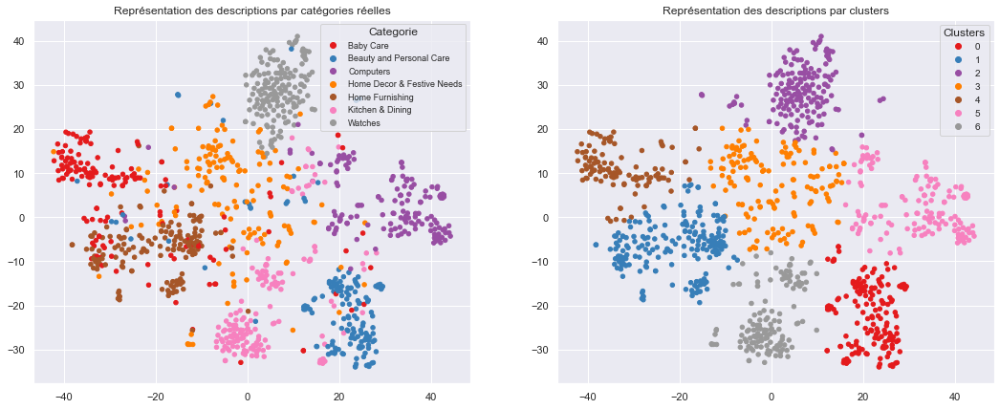

ARI :  0.6087


In [284]:
# Execute clustering with optimal perplexity (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [285]:
# View of confusion matrix without cluster_label reattribution
conf_mat = confusion_matrix(true_labels, labels)
print(conf_mat)

[[  6  34   2   7  93   3   5]
 [123   7   8  10   1   0   1]
 [  1   3   1   7   1 137   0]
 [  3  11   9 100   9   2  16]
 [  0 138   0   6   3   0   3]
 [ 21   0   3  13   0   4 109]
 [  0   0 142   8   0   0   0]]


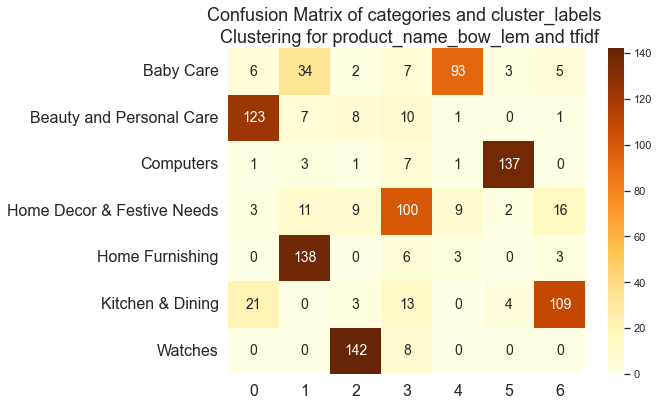

In [286]:
# Confusion Matrix with category names
data_cm = pd.DataFrame(conf_mat, index = [category for category in list_categories],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (8,6))
cmap = 'YlOrBr'
colormap = sns.heatmap(data_cm, annot=True, annot_kws ={'size':14}, cmap=cmap, fmt='.3g')
colormap.set_xticklabels(colormap.get_xmajorticklabels(), size = 16)
colormap.set_yticklabels(colormap.get_ymajorticklabels(), size = 16)

plt.title('Confusion Matrix of categories and cluster_labels \n Clustering for product_name_bow_lem and tfidf',
          size = 18);

In [287]:
# Calculate accuracy by categorie
# Fonction to create confusion matrix and translate cluster_labels to categories
from sklearn.metrics import confusion_matrix

def conf_mat_transform(y_true,y_pred) :
    conf_mat = confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = np.argmax(conf_mat, axis=0)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['cluster_labels'] = y_pred
    labels['cluster_labels_transform'] = labels['cluster_labels'].apply(lambda x : corresp[x])
    
    return labels['cluster_labels_transform']

# Transform cluster_labels to categories
labels_transform = conf_mat_transform(true_labels, labels)
conf_mat = metrics.confusion_matrix(true_labels, labels_transform)
print(conf_mat)
print()
classification = metrics.classification_report(true_labels, labels_transform,
                                               target_names = list_categories, digits = 3)
print(metrics.classification_report(true_labels, labels_transform, 
                                    target_names=[category for category in list_categories], digits = 3))
dict_classification = metrics.classification_report(true_labels, labels_transform,
                                                    target_names=[category for category in list_categories],
                                                    digits = 3, output_dict = True)

[[ 93   6   3   7  34   5   2]
 [  1 123   0  10   7   1   8]
 [  1   1 137   7   3   0   1]
 [  9   3   2 100  11  16   9]
 [  3   0   0   6 138   3   0]
 [  0  21   4  13   0 109   3]
 [  0   0   0   8   0   0 142]]

                            precision    recall  f1-score   support

                 Baby Care      0.869     0.620     0.724       150
  Beauty and Personal Care      0.799     0.820     0.809       150
                 Computers      0.938     0.913     0.926       150
Home Decor & Festive Needs      0.662     0.667     0.664       150
           Home Furnishing      0.715     0.920     0.805       150
          Kitchen & Dining      0.813     0.727     0.768       150
                   Watches      0.861     0.947     0.902       150

                  accuracy                          0.802      1050
                 macro avg      0.808     0.802     0.800      1050
              weighted avg      0.808     0.802     0.800      1050



In [288]:
# Create dataframe with categories and metrics
data_metrics_NASNetLarge = pd.DataFrame.from_dict(dict_classification, orient='columns').T.iloc[0:7,0:3]
data_metrics_NASNetLarge = round(data_metrics_NASNetLarge, 3)
data_metrics_NASNetLarge

,precision,recall,f1-score
Baby Care,0.869,0.620,0.724
Beauty and Personal Care,0.799,0.820,0.809
Computers,0.938,0.913,0.926
Home Decor & Festive Needs,0.662,0.667,0.664
Home Furnishing,0.715,0.920,0.805
Kitchen & Dining,0.813,0.727,0.768
Watches,0.861,0.947,0.902


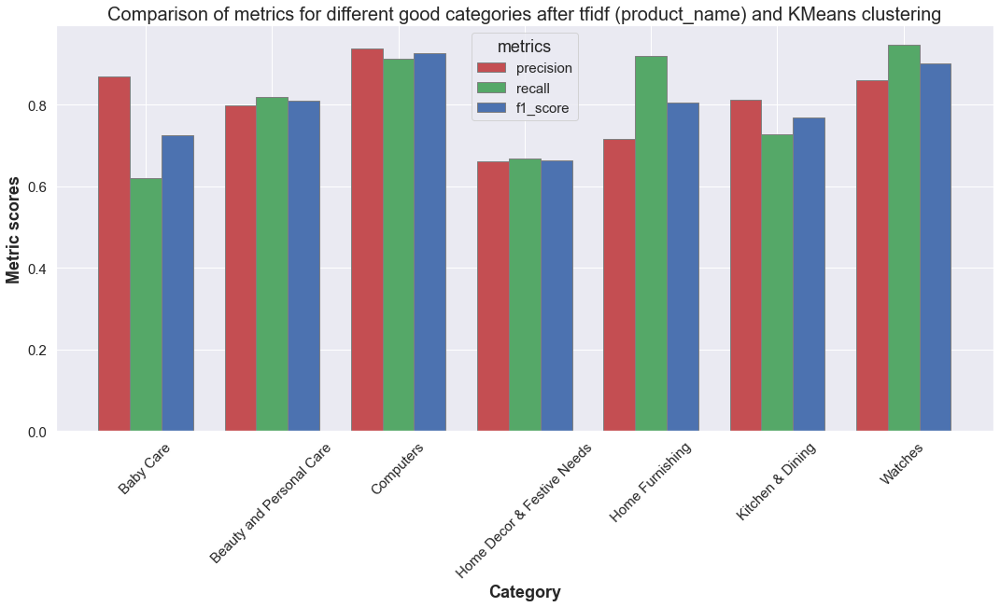

In [289]:
sns.set_theme(context='notebook', style='darkgrid')

# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(18, 8))
 
# set height of bar
precision = data_metrics_NASNetLarge['precision'].values
recall = data_metrics_NASNetLarge['recall'].values
f1_score = data_metrics_NASNetLarge['f1-score'].values
 
# Set position of bar on X axis
br1 = np.arange(len(precision))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
 
# Make the plot
rects1 = plt.bar(br1, precision, color ='r', width = barWidth,
        edgecolor ='grey', label ='precision')
rects2 = plt.bar(br2, recall, color ='g', width = barWidth,
        edgecolor ='grey', label ='recall')
rects3 = plt.bar(br3, f1_score, color ='b', width = barWidth,
        edgecolor ='grey', label ='f1_score')
 
# Adding Xticks
plt.xlabel('Category', fontweight ='bold', fontsize = 18)
plt.ylabel('Metric scores', fontweight ='bold', fontsize = 18)
plt.xticks([r + barWidth for r in range(len(precision))],
           list_categories, 
           size = 15,
           rotation = 45)
plt.yticks(size = 15)

plt.legend(title = 'metrics', title_fontsize = 18, fontsize = 15)
plt.title('Comparison of metrics for different good categories after tfidf (product_name) and KMeans clustering',
         size = 20)
plt.show()

### Transfer Learning with NASNetMobile

In [273]:
from tensorflow.keras.applications import NASNetMobile
# load model
model = NASNetMobile()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize the model
model.summary()

24240128/24227760 [==============================] - 1s 0us/step
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 111, 111, 32  864         ['input_10[0][0]']               
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 111, 111, 32  128         ['stem_conv1[0][0]']             
                           

 separable_conv_1_reduction_rig  (None, 56, 56, 11)  1920        ['separable_conv_1_pad_reduction_
 ht2_stem_1 (SeparableConv2D)                                    right2_stem_1[0][0]']            
                                                                                                  
 separable_conv_1_pad_reduction  (None, 115, 115, 32  0          ['activation_564[0][0]']         
 _right3_stem_1 (ZeroPadding2D)  )                                                                
                                                                                                  
 activation_566 (Activation)    (None, 56, 56, 11)   0           ['reduction_add_1_stem_1[0][0]'] 
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 56, 56, 11)  44          ['separable_conv_1_reduction_righ
 right2_stem_1 (BatchNormalizat                                  t2_stem_1[0][0]']                
 ion)     

                                                                 ight3_stem_1[0][0]']             
                                                                                                  
 add_4 (Add)                    (None, 56, 56, 11)   0           ['reduction_add_2_stem_1[0][0]', 
                                                                  'reduction_left4_stem_1[0][0]'] 
                                                                                                  
 reduction_add4_stem_1 (Add)    (None, 56, 56, 11)   0           ['separable_conv_2_bn_reduction_l
                                                                 eft4_stem_1[0][0]',              
                                                                  'reduction_right5_stem_1[0][0]']
                                                                                                  
 cropping2d_4 (Cropping2D)      (None, 111, 111, 32  0           ['zero_padding2d_4[0][0]']       
          

 on)                                                                                              
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 28, 28, 22)  88          ['separable_conv_2_reduction_righ
 right1_stem_2 (BatchNormalizat                                  t1_stem_2[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable_conv_1_pad_reduction  (None, 61, 61, 22)  0           ['activation_573[0][0]']         
 _right2_stem_2 (ZeroPadding2D)                                                                   
                                                                                                  
 activation_575 (Activation)    (None, 56, 56, 22)   0           ['adjust_bn_stem_2[0][0]']       
          

 reduction_left4_stem_2 (Averag  (None, 28, 28, 22)  0           ['reduction_add_1_stem_2[0][0]'] 
 ePooling2D)                                                                                      
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 28, 28, 22)  88          ['separable_conv_2_reduction_left
 left4_stem_2 (BatchNormalizati                                  4_stem_2[0][0]']                 
 on)                                                                                              
                                                                                                  
 reduction_right5_stem_2 (MaxPo  (None, 28, 28, 22)  0           ['reduction_pad_1_stem_2[0][0]'] 
 oling2D)                                                                                         
                                                                                                  
 zero_padd

 ht1_0 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_1_normal_left2_0
 t2_0 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 28, 28, 44)  176         ['separable_conv_1_normal_right2_
 ht2_0 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_1_normal_left5_0
 t5_0 (BatchNormalization)                                       [0][0]']                         
          

                                                                  'normal_bn_1_0[0][0]']          
                                                                                                  
 normal_concat_0 (Concatenate)  (None, 28, 28, 264)  0           ['adjust_bn_0[0][0]',            
                                                                  'normal_add_1_0[0][0]',         
                                                                  'normal_add_2_0[0][0]',         
                                                                  'normal_add_3_0[0][0]',         
                                                                  'normal_add_4_0[0][0]',         
                                                                  'normal_add_5_0[0][0]']         
                                                                                                  
 activation_590 (Activation)    (None, 28, 28, 88)   0           ['reduction_concat_stem_2[0][0]']
          

 _1 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left2_  (None, 28, 28, 44)  3036        ['activation_597[0][0]']         
 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 28, 28, 44)  2332        ['activation_599[0][0]']         
 _1 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 28, 28, 44)  2332        ['activation_601[0][0]']         
 1 (SeparableConv2D)                                                                              
          

 activation_610 (Activation)    (None, 28, 28, 44)   0           ['adjust_bn_2[0][0]']            
                                                                                                  
 activation_612 (Activation)    (None, 28, 28, 44)   0           ['normal_bn_1_2[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 28, 28, 44)  3036        ['activation_604[0][0]']         
 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right1  (None, 28, 28, 44)  2332        ['activation_606[0][0]']         
 _2 (SeparableConv2D)                                                                             
                                                                                                  
 separable

 g2D)                                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_2_normal_left5_2
 t5_2 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_2 (Add)           (None, 28, 28, 44)   0           ['separable_conv_2_bn_normal_left
                                                                 1_2[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_2[0][0]']                     
                                                                                                  
 normal_ad

                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 28, 28, 44)  176         ['separable_conv_1_normal_left5_3
 t5_3 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_617 (Activation)    (None, 28, 28, 44)   0           ['separable_conv_1_bn_normal_left
                                                                 1_3[0][0]']                      
                                                                                                  
 activation_619 (Activation)    (None, 28, 28, 44)   0           ['separable_conv_1_bn_normal_righ
                                                                 t1_3[0][0]']                     
                                                                                                  
 activatio

                                                                  'normal_add_5_3[0][0]']         
                                                                                                  
 activation_627 (Activation)    (None, 28, 28, 264)  0           ['normal_concat_3[0][0]']        
                                                                                                  
 activation_626 (Activation)    (None, 28, 28, 264)  0           ['normal_concat_2[0][0]']        
                                                                                                  
 reduction_conv_1_reduce_4 (Con  (None, 28, 28, 88)  23232       ['activation_627[0][0]']         
 v2D)                                                                                             
                                                                                                  
 adjust_conv_projection_reduce_  (None, 28, 28, 88)  23232       ['activation_626[0][0]']         
 4 (Conv2D

                                                                                                  
 activation_636 (Activation)    (None, 14, 14, 88)   0           ['reduction_add_1_reduce_4[0][0]'
                                                                 ]                                
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 14, 14, 88)  352         ['separable_conv_1_reduction_righ
 right2_reduce_4 (BatchNormaliz                                  t2_reduce_4[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable_conv_1_reduction_rig  (None, 14, 14, 88)  9944        ['separable_conv_1_pad_reduction_
 ht3_reduce_4 (SeparableConv2D)                                  right3_reduce_4[0][0]']          
          

                                                                                                  
 reduction_add4_reduce_4 (Add)  (None, 14, 14, 88)   0           ['separable_conv_2_bn_reduction_l
                                                                 eft4_reduce_4[0][0]',            
                                                                  'reduction_right5_reduce_4[0][0]
                                                                 ']                               
                                                                                                  
 cropping2d_6 (Cropping2D)      (None, 28, 28, 264)  0           ['zero_padding2d_6[0][0]']       
                                                                                                  
 reduction_concat_reduce_4 (Con  (None, 14, 14, 352)  0          ['reduction_add_2_reduce_4[0][0]'
 catenate)                                                       , 'reduction_add3_reduce_4[0][0]'
          

 activation_644 (Activation)    (None, 14, 14, 88)   0           ['separable_conv_1_bn_normal_left
                                                                 2_5[0][0]']                      
                                                                                                  
 activation_646 (Activation)    (None, 14, 14, 88)   0           ['separable_conv_1_bn_normal_righ
                                                                 t2_5[0][0]']                     
                                                                                                  
 activation_648 (Activation)    (None, 14, 14, 88)   0           ['separable_conv_1_bn_normal_left
                                                                 5_5[0][0]']                      
                                                                                                  
 separable_conv_2_normal_left1_  (None, 14, 14, 88)  9944        ['activation_640[0][0]']         
 5 (Separa

 normal_conv_1_6 (Conv2D)       (None, 14, 14, 88)   46464       ['activation_650[0][0]']         
                                                                                                  
 adjust_bn_6 (BatchNormalizatio  (None, 14, 14, 88)  352         ['adjust_conv_projection_6[0][0]'
 n)                                                              ]                                
                                                                                                  
 normal_bn_1_6 (BatchNormalizat  (None, 14, 14, 88)  352         ['normal_conv_1_6[0][0]']        
 ion)                                                                                             
                                                                                                  
 activation_651 (Activation)    (None, 14, 14, 88)   0           ['normal_bn_1_6[0][0]']          
                                                                                                  
 activatio

                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 14, 14, 88)  352         ['separable_conv_2_normal_left2_6
 t2_6 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 14, 14, 88)  352         ['separable_conv_2_normal_right2_
 ht2_6 (BatchNormalization)                                      6[0][0]']                        
                                                                                                  
 normal_left3_6 (AveragePooling  (None, 14, 14, 88)  0           ['normal_bn_1_6[0][0]']          
 2D)                                                                                              
                                                                                                  
 normal_le

 separable_conv_1_normal_left5_  (None, 14, 14, 88)  8536        ['activation_671[0][0]']         
 7 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 14, 14, 88)  352         ['separable_conv_1_normal_left1_7
 t1_7 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 14, 14, 88)  352         ['separable_conv_1_normal_right1_
 ht1_7 (BatchNormalization)                                      7[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 14, 14, 88)  352         ['separable_conv_1_normal_left2_7
 t2_7 (Bat

                                                                  'adjust_bn_7[0][0]']            
                                                                                                  
 normal_add_4_7 (Add)           (None, 14, 14, 88)   0           ['normal_left4_7[0][0]',         
                                                                  'normal_right4_7[0][0]']        
                                                                                                  
 normal_add_5_7 (Add)           (None, 14, 14, 88)   0           ['separable_conv_2_bn_normal_left
                                                                 5_7[0][0]',                      
                                                                  'normal_bn_1_7[0][0]']          
                                                                                                  
 normal_concat_7 (Concatenate)  (None, 14, 14, 528)  0           ['adjust_bn_7[0][0]',            
          

 activation_684 (Activation)    (None, 14, 14, 88)   0           ['separable_conv_1_bn_normal_left
                                                                 5_8[0][0]']                      
                                                                                                  
 separable_conv_2_normal_left1_  (None, 14, 14, 88)  9944        ['activation_676[0][0]']         
 8 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right1  (None, 14, 14, 88)  8536        ['activation_678[0][0]']         
 _8 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left2_  (None, 14, 14, 88)  9944        ['activation_680[0][0]']         
 8 (Separa

 lization)                                                       [0][0]']                         
                                                                                                  
 activation_687 (Activation)    (None, 14, 14, 176)  0           ['reduction_bn_1_reduce_8[0][0]']
                                                                                                  
 activation_689 (Activation)    (None, 14, 14, 176)  0           ['adjust_bn_reduce_8[0][0]']     
                                                                                                  
 separable_conv_1_pad_reduction  (None, 17, 17, 176)  0          ['activation_687[0][0]']         
 _left1_reduce_8 (ZeroPadding2D                                                                   
 )                                                                                                
                                                                                                  
 separable

                                                                                                  
 separable_conv_1_bn_reduction_  (None, 7, 7, 176)   704         ['separable_conv_1_reduction_righ
 right3_reduce_8 (BatchNormaliz                                  t3_reduce_8[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 7, 7, 176)   704         ['separable_conv_1_reduction_left
 left4_reduce_8 (BatchNormaliza                                  4_reduce_8[0][0]']               
 tion)                                                                                            
                                                                                                  
 reduction_pad_1_reduce_8 (Zero  (None, 15, 15, 176)  0          ['reduction_bn_1_reduce_8[0][0]']
 Padding2D

 adjust_avg_pool_2_9 (AveragePo  (None, 7, 7, 528)   0           ['cropping2d_7[0][0]']           
 oling2D)                                                                                         
                                                                                                  
 adjust_conv_1_9 (Conv2D)       (None, 7, 7, 88)     46464       ['adjust_avg_pool_1_9[0][0]']    
                                                                                                  
 adjust_conv_2_9 (Conv2D)       (None, 7, 7, 88)     46464       ['adjust_avg_pool_2_9[0][0]']    
                                                                                                  
 activation_697 (Activation)    (None, 7, 7, 704)    0           ['reduction_concat_reduce_8[0][0]
                                                                 ']                               
                                                                                                  
 concatena

 9 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 7, 7, 176)   32560       ['activation_705[0][0]']         
 _9 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 7, 7, 176)   32560       ['activation_707[0][0]']         
 9 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left1_9
 t1_9 (BatchNormalization)                                       [0][0]']                         
          

 activation_718 (Activation)    (None, 7, 7, 176)    0           ['normal_bn_1_10[0][0]']         
                                                                                                  
 separable_conv_1_normal_left1_  (None, 7, 7, 176)   35376       ['activation_710[0][0]']         
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right1  (None, 7, 7, 176)   32560       ['activation_712[0][0]']         
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left2_  (None, 7, 7, 176)   35376       ['activation_714[0][0]']         
 10 (SeparableConv2D)                                                                             
          

 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left5_1
 t5_10 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 normal_add_1_10 (Add)          (None, 7, 7, 176)    0           ['separable_conv_2_bn_normal_left
                                                                 1_10[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_10[0][0]']                    
                                                                                                  
 normal_add_2_10 (Add)          (None, 7, 7, 176)    0           ['separable_conv_2_bn_normal_left
                                                                 2_10[0][0]',                     
          

 t5_11 (BatchNormalization)                                      1[0][0]']                        
                                                                                                  
 activation_723 (Activation)    (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_left
                                                                 1_11[0][0]']                     
                                                                                                  
 activation_725 (Activation)    (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_righ
                                                                 t1_11[0][0]']                    
                                                                                                  
 activation_727 (Activation)    (None, 7, 7, 176)    0           ['separable_conv_1_bn_normal_left
                                                                 2_11[0][0]']                     
          

 activation_732 (Activation)    (None, 7, 7, 1056)   0           ['normal_concat_10[0][0]']       
                                                                                                  
 activation_733 (Activation)    (None, 7, 7, 1056)   0           ['normal_concat_11[0][0]']       
                                                                                                  
 adjust_conv_projection_12 (Con  (None, 7, 7, 176)   185856      ['activation_732[0][0]']         
 v2D)                                                                                             
                                                                                                  
 normal_conv_1_12 (Conv2D)      (None, 7, 7, 176)    185856      ['activation_733[0][0]']         
                                                                                                  
 adjust_bn_12 (BatchNormalizati  (None, 7, 7, 176)   704         ['adjust_conv_projection_12[0][0]
 on)      

 12 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left1_1
 t1_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 7, 7, 176)   704         ['separable_conv_2_normal_right1_
 ht1_12 (BatchNormalization)                                     12[0][0]']                       
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 7, 7, 176)   704         ['separable_conv_2_normal_left2_1
 t2_12 (BatchNormalization)                                      2[0][0]']                        
          

In [275]:
target_size = 224
final_vectors = 1056
data_photos = {}
p = r"C:/Users/33624/Dataset_projet_pretraitement_textes_images/Flipkart/photo_features.pkl"

# lop through each image in the dataset
for photo in photos:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(photo, model, target_size)
        data_photos[photo] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data_photos,file)

# get a list of just the features
feat = np.array(list(data_photos.values()))
feat.shape

(1050, 1, 1056)

In [276]:
# reshape so that there are 1050 samples of 1280 vectors
feat2 = feat.reshape(-1,final_vectors)
feat2.shape

(1050, 1056)

In [277]:
pca = PCA(n_components=.99, random_state=22)
pca.fit(feat2)
x = pca.transform(feat2)
print(f"Components before PCA: {feat2.shape}")
print(f"Components after PCA: {x.shape}")

kmeans = KMeans(n_clusters=len(unique_labels), random_state=22)
kmeans.fit(x)

Components before PCA: (1050, 1056)
Components after PCA: (1050, 539)


KMeans(n_clusters=7, random_state=22)

In [278]:
# Execute clustering with perplexity from 1 to 50 for 'feat_pca' feature
ARI_NASNetMobile = []

for perplexity in range(1, 51):
    ARI, X_tsne, labels = ARI_fct(x, perplexity)
    ARI_NASNetMobile.append(ARI)

max_value = None
max_idx = None

for idx, num in enumerate(ARI_NASNetMobile):
    if (max_value is None or num > max_value):
        max_value = num
        max_idx = idx
        opt_perplexity = max_idx + 1

print('Maximum value:', max_value, "At index: ", max_idx)
print('Optimal perplexity = ', opt_perplexity)

ARI :  0.0907 time :  6.0
ARI :  0.2546 time :  5.0
ARI :  0.3292 time :  5.0
ARI :  0.408 time :  5.0
ARI :  0.4713 time :  6.0
ARI :  0.4933 time :  6.0
ARI :  0.4679 time :  5.0
ARI :  0.477 time :  5.0
ARI :  0.5402 time :  6.0
ARI :  0.5361 time :  5.0
ARI :  0.4953 time :  5.0
ARI :  0.4987 time :  6.0
ARI :  0.5178 time :  5.0
ARI :  0.5108 time :  5.0
ARI :  0.5357 time :  6.0
ARI :  0.5346 time :  6.0
ARI :  0.5218 time :  6.0
ARI :  0.5269 time :  6.0
ARI :  0.5491 time :  6.0
ARI :  0.5222 time :  6.0
ARI :  0.5184 time :  6.0
ARI :  0.5519 time :  7.0
ARI :  0.526 time :  7.0
ARI :  0.5105 time :  7.0
ARI :  0.557 time :  7.0
ARI :  0.4802 time :  7.0
ARI :  0.5646 time :  7.0
ARI :  0.5142 time :  7.0
ARI :  0.5282 time :  7.0
ARI :  0.5189 time :  7.0
ARI :  0.5382 time :  8.0
ARI :  0.482 time :  8.0
ARI :  0.5054 time :  8.0
ARI :  0.5613 time :  8.0
ARI :  0.5148 time :  8.0
ARI :  0.5509 time :  7.0
ARI :  0.5661 time :  7.0
ARI :  0.5513 time :  8.0
ARI :  0.5147 tim

ARI :  0.5983 time :  9.0


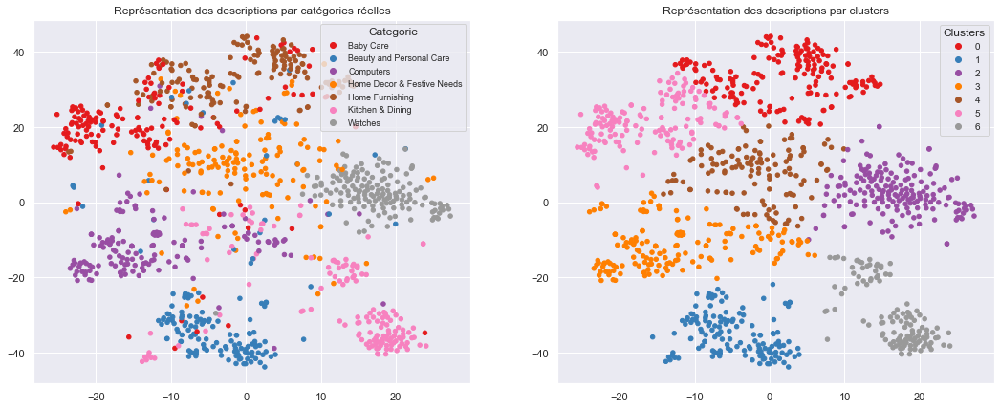

ARI :  0.5983


In [279]:
# Execute clustering with optimal perplexity (argmax) for 'product_name_description_bow_lem' feature
ARI, X_tsne, labels = ARI_fct(x, opt_perplexity)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)